# Taxi demand prediction in New York City


<img src='new_york.gif'>

In [1]:
#Importing Libraries
# pip3 install graphviz
#pip3 install dask
#pip3 install toolz
#pip3 install cloudpickle
# https://www.youtube.com/watch?v=ieW3G7ZzRZ0
# https://github.com/dask/dask-tutorial
# please do go through this python notebook: https://github.com/dask/dask-tutorial/blob/master/07_dataframe.ipynb
import dask.dataframe as dd#similar to pandas

import pandas as pd#pandas to create small dataframes 

# pip3 install foliun
# if this doesnt work refere install_folium.JPG in drive
import folium #open street map

# unix time: https://www.unixtimestamp.com/
import datetime #Convert to unix time

import time #Convert to unix time

# if numpy is not installed already : pip3 install numpy
import numpy as np#Do aritmetic operations on arrays

# matplotlib: used to plot graphs
import matplotlib
# matplotlib.use('nbagg') : matplotlib uses this protocall which makes plots more user intractive like zoom in and zoom out
matplotlib.use('nbagg')
import matplotlib.pylab as plt
import seaborn as sns#Plots
from matplotlib import rcParams#Size of plots  

# this lib is used while we calculate the stight line distance between two (lat,lon) pairs in miles
import gpxpy.geo #Get the haversine distance

from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering
import math
import pickle
import os

# download migwin: https://mingw-w64.org/doku.php/download/mingw-builds
# install it in your system and keep the path, migw_path ='installed path'
mingw_path = 'C:\Program Files\mingw-w64\x86_64-8.1.0-posix-seh-rt_v6-rev0\\mingw64\\bin'
#'C:\\Program Files\\mingw-w64\\x86_64-5.3.0-posix-seh-rt_v4-rev0\\mingw64\\bin'
os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']

# to install xgboost: pip3 install xgboost
# if it didnt happen check install_xgboost.JPG
import xgboost as xgb
# !pip install tsfresh
import tsfresh as tsf

# to install sklearn: pip install -U scikit-learn
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

import warnings
warnings.filterwarnings("ignore")

from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy import stats

# Data Information

<p>
Ge the data from : http://www.nyc.gov/html/tlc/html/about/trip_record_data.shtml (2016 data)
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) 
</p>

## Information on taxis:

<h5> Yellow Taxi: Yellow Medallion Taxicabs</h5>
<p> These are the famous NYC yellow taxis that provide transportation exclusively through street-hails. The number of taxicabs is limited by a finite number of medallions issued by the TLC. You access this mode of transportation by standing in the street and hailing an available taxi with your hand. The pickups are not pre-arranged.</p>

<h5> For Hire Vehicles (FHVs) </h5>
<p> FHV transportation is accessed by a pre-arrangement with a dispatcher or limo company. These FHVs are not permitted to pick up passengers via street hails, as those rides are not considered pre-arranged. </p>

<h5> Green Taxi: Street Hail Livery (SHL) </h5>
<p>  The SHL program will allow livery vehicle owners to license and outfit their vehicles with green borough taxi branding, meters, credit card machines, and ultimately the right to accept street hails in addition to pre-arranged rides. </p>
<p> Credits: Quora</p>

<h5>Footnote:</h5>
In the given notebook we are considering only the yellow taxis for the time period between Jan - Mar 2015 & Jan - Mar 2016

# Data Collection
We Have collected all yellow taxi trips data from jan-2015 to dec-2016(Will be using only 2015 data)
<table>
<tr>
<th> file name </th>
<th> file name size</th>
<th> number of records </th>
<th> number of features </th>
</tr>
<tr>
<td> yellow_tripdata_2016-01 </td>
<td> 1. 59G </td>
<td> 10906858 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-02 </td>
<td> 1. 66G </td>
<td> 11382049 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-03 </td>
<td> 1. 78G </td>
<td> 12210952 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-04 </td>
<td> 1. 74G </td>
<td> 11934338 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-05 </td>
<td> 1. 73G </td>
<td> 11836853 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-06 </td>
<td> 1. 62G </td>
<td> 11135470 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-07 </td>
<td> 884Mb </td>
<td> 10294080 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-08 </td>
<td> 854Mb </td>
<td> 9942263 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-09 </td>
<td> 870Mb </td>
<td> 10116018 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-10 </td>
<td> 933Mb </td>
<td> 10854626 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-11 </td>
<td> 868Mb </td>
<td> 10102128 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-12 </td>
<td> 897Mb </td>
<td> 10449408 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-01 </td>
<td> 1.84Gb </td>
<td> 12748986 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-02 </td>
<td> 1.81Gb </td>
<td> 12450521 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-03 </td>
<td> 1.94Gb </td>
<td> 13351609 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-04 </td>
<td> 1.90Gb </td>
<td> 13071789 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-05 </td>
<td> 1.91Gb </td>
<td> 13158262 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-06 </td>
<td> 1.79Gb </td>
<td> 12324935 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-07 </td>
<td> 1.68Gb </td>
<td> 11562783 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-08 </td>
<td> 1.62Gb </td>
<td> 11130304 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-09 </td>
<td> 1.63Gb </td>
<td> 11225063 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-10 </td>
<td> 1.79Gb </td>
<td> 12315488 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-11 </td>
<td> 1.65Gb </td>
<td> 11312676 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-12 </td>
<td> 1.67Gb </td>
<td> 11460573 </td>
<td> 19 </td>
</tr>
</table>

In [2]:
#Looking at the features
# dask dataframe  : # https://github.com/dask/dask-tutorial/blob/master/07_dataframe.ipynb
month = dd.read_csv('yellow_tripdata_2015-01.csv')
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


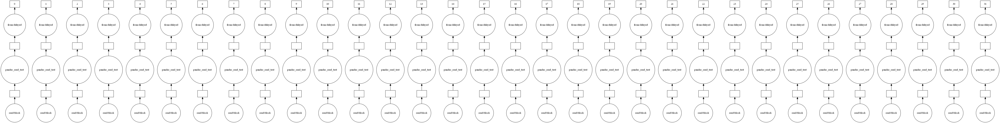

In [3]:
# However unlike Pandas, operations on dask.dataframes don't trigger immediate computation, 
# instead they add key-value pairs to an underlying Dask graph. Recall that in the diagram below, 
# circles are operations and rectangles are results.

# to see the visulaization you need to install graphviz
# pip3 install graphviz if this doesnt work please check the install_graphviz.jpg in the drive
month.visualize()

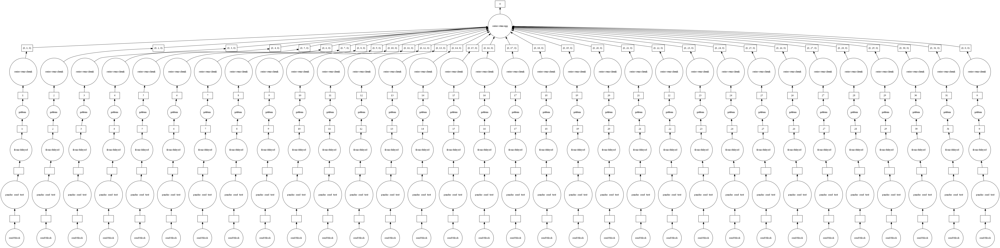

In [4]:
month.fare_amount.sum().visualize()

## Features in the dataset:
<table border="1">
	<tr>
		<th>Field Name</th>
		<th>Description</th>
	</tr>
	<tr>
		<td>VendorID</td>
		<td>
		A code indicating the TPEP provider that provided the record.
		<ol>
			<li>Creative Mobile Technologies</li>
			<li>VeriFone Inc.</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>tpep_pickup_datetime</td>
		<td>The date and time when the meter was engaged.</td>
	</tr>
	<tr>
		<td>tpep_dropoff_datetime</td>
		<td>The date and time when the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Passenger_count</td>
		<td>The number of passengers in the vehicle. This is a driver-entered value.</td>
	</tr>
	<tr>
		<td>Trip_distance</td>
		<td>The elapsed trip distance in miles reported by the taximeter.</td>
	</tr>
	<tr>
		<td>Pickup_longitude</td>
		<td>Longitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>Pickup_latitude</td>
		<td>Latitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>RateCodeID</td>
		<td>The final rate code in effect at the end of the trip.
		<ol>
			<li> Standard rate </li>
			<li> JFK </li>
			<li> Newark </li>
			<li> Nassau or Westchester</li>
			<li> Negotiated fare </li>
			<li> Group ride</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Store_and_fwd_flag</td>
		<td>This flag indicates whether the trip record was held in vehicle memory before sending to the vendor,<br\> aka “store and forward,” because the vehicle did not have a connection to the server.
		<br\>Y= store and forward trip
		<br\>N= not a store and forward trip
        </td>
        </tr>
	<tr>
		<td>Dropoff_longitude</td>
		<td>Longitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Dropoff_ latitude</td>
		<td>Latitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Payment_type</td>
		<td>A numeric code signifying how the passenger paid for the trip.
		<ol>
			<li> Credit card </li>
			<li> Cash </li>
			<li> No charge </li>
			<li> Dispute</li>
			<li> Unknown </li>
			<li> Voided trip</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Fare_amount</td>
		<td>The time-and-distance fare calculated by the meter.</td>
	</tr>
	<tr>
		<td>Extra</td>
		<td>Miscellaneous extras and surcharges. Currently, this only includes. the $0.50 and $1 rush hour and overnight charges.</td>
	</tr>
	<tr>
		<td>MTA_tax</td>
		<td>0.50 MTA tax that is automatically triggered based on the metered rate in use.</td>
	</tr>
	<tr>
		<td>Improvement_surcharge</td>
		<td>0.30 improvement surcharge assessed trips at the flag drop. the improvement surcharge began being levied in 2015.</td>
	</tr>
	<tr>
		<td>Tip_amount</td>
		<td>Tip amount – This field is automatically populated for credit card tips.Cash tips are not included.</td>
	</tr>
	<tr>
		<td>Tolls_amount</td>
		<td>Total amount of all tolls paid in trip.</td>
	</tr>
	<tr>
		<td>Total_amount</td>
		<td>The total amount charged to passengers. Does not include cash tips.</td>
	</tr>
</table>

# ML Problem Formulation
<p><b> Time-series forecasting and Regression</b></p>
<br>
-<i> To find number of pickups, given location cordinates(latitude and longitude) and time, in the query reigion and surrounding regions.</i>
<p> 
To solve the above we would be using data collected in Jan - Mar 2015 to predict the pickups in Jan - Mar 2016.
</p>

# Performance metrics
1. Mean Absolute percentage error.
2. Mean Squared error.

## Data Cleaning

In this section we will be doing univariate analysis and removing outlier/illegitimate values which may be caused due to some error

In [5]:
#table below shows few datapoints along with all our features
month.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


### 1. Pickup Latitude and Pickup Longitude

It is inferred from the source https://www.flickr.com/places/info/2459115 that New York is bounded by the location cordinates(lat,long) - (40.5774, -74.15) & (40.9176,-73.7004) so hence any cordinates not within these cordinates are not considered by us as we are only concerned with pickups which originate within New York.

In [6]:
# Plotting pickup cordinates which are outside the bounding box of New-York 
# we will collect all the points outside the bounding box of newyork city to outlier_locations
outlier_locations = month[((month.pickup_longitude <= -74.15) | (month.pickup_latitude <= 40.5774)| \
                   (month.pickup_longitude >= -73.7004) | (month.pickup_latitude >= 40.9176))]

# creating a map with the a base location
# read more about the folium here: http://folium.readthedocs.io/en/latest/quickstart.html

# note: you dont need to remember any of these, you dont need indeepth knowledge on these maps and plots

map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')

# we will spot only first 100 outliers on the map, plotting all the outliers will take more time
sample_locations = outlier_locations.head(10000)
for i,j in sample_locations.iterrows():
    if int(j['pickup_latitude']) != 0:
        folium.Marker(list((j['pickup_latitude'],j['pickup_longitude']))).add_to(map_osm)
map_osm

<b>Observation:-</b> As you can see above that there are some points just outside the boundary but there are a few that are in either South america, Mexico or Canada

### 2. Dropoff Latitude & Dropoff Longitude

It is inferred from the source https://www.flickr.com/places/info/2459115 that New York is bounded by the location cordinates(lat,long) - (40.5774, -74.15) & (40.9176,-73.7004) so hence any cordinates not within these cordinates are not considered by us as we are only concerned with dropoffs which are within New York.

In [7]:
# Plotting dropoff cordinates which are outside the bounding box of New-York 
# we will collect all the points outside the bounding box of newyork city to outlier_locations
outlier_locations = month[((month.dropoff_longitude <= -74.15) | (month.dropoff_latitude <= 40.5774)| \
                   (month.dropoff_longitude >= -73.7004) | (month.dropoff_latitude >= 40.9176))]

# creating a map with the a base location
# read more about the folium here: http://folium.readthedocs.io/en/latest/quickstart.html

# note: you dont need to remember any of these, you dont need indeepth knowledge on these maps and plots

map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')

# we will spot only first 100 outliers on the map, plotting all the outliers will take more time
sample_locations = outlier_locations.head(10000)
for i,j in sample_locations.iterrows():
    if int(j['pickup_latitude']) != 0:
        folium.Marker(list((j['dropoff_latitude'],j['dropoff_longitude']))).add_to(map_osm)
map_osm

<b>Observation:-</b> The observations here are similar to those obtained while analysing pickup latitude and longitude

### 3. Trip Durations:

<p style="font-size:18px">According to NYC Taxi &amp; Limousine Commision Regulations <b style= "color:blue">the maximum allowed trip duration in a 24 hour interval is 12 hours.</b> </p>

In [8]:
# The timestamps are converted to unix so as to get duration(trip-time) & 
# speed also pickup-times in unix are used while binning

# in out data we have time in the format "YYYY-MM-DD HH:MM:SS" we convert this string to python time format
# and then into unix time stamp
# https://stackoverflow.com/a/27914405


def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())


# we return a data frame which contains the columns
# 1.'passenger_count' : self explanatory
# 2.'trip_distance' : self explanatory
# 3.'pickup_longitude' : self explanatory
# 4.'pickup_latitude' : self explanatory
# 5.'dropoff_longitude' : self explanatory
# 6.'dropoff_latitude' : self explanatory
# 7.'total_amount' : total fair that was paid
# 8.'trip_times' : duration of each trip
# 9.'pickup_times : pickup time converted into unix time
# 10.'Speed' : velocity of each trip
def return_with_trip_times(month):
    duration = month[['tpep_pickup_datetime',
                      'tpep_dropoff_datetime']].compute()
    # pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(
        x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(
        x) for x in duration['tpep_dropoff_datetime'].values]
    # calculate duration of trips
    durations = (np.array(duration_drop) - np.array(duration_pickup))/float(60)

    # append durations of trips and speed in miles/hr to a new dataframe
    new_frame = month[['passenger_count', 'trip_distance', 'pickup_longitude',
                       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'total_amount']].compute()

    new_frame['trip_times'] = durations
    new_frame['pickup_times'] = duration_pickup
    new_frame['Speed'] = 60 * \
        (new_frame['trip_distance']/new_frame['trip_times'])

    return new_frame


# print(frame_with_durations.head())
#  passenger_count	trip_distance	pickup_longitude	pickup_latitude	dropoff_longitude	dropoff_latitude	total_amount	trip_times	pickup_times	Speed
#   1                  1.59	      -73.993896        	40.750111    	-73.974785      	40.750618           	17.05   	 18.050000	1.421329e+09	5.285319
#   1               	3.30    	-74.001648      	40.724243   	-73.994415      	40.759109           	17.80   	19.833333	1.420902e+09	9.983193
#   1               	1.80     	-73.963341      	40.802788     	-73.951820      	40.824413           	10.80   	10.050000	1.420902e+09	10.746269
#   1               	0.50    	-74.009087      	40.713818    	-74.004326       	40.719986           	4.80    	1.866667	1.420902e+09	16.071429
#   1               	3.00    	-73.971176      	40.762428    	-74.004181      	40.742653           	16.30   	19.316667	1.420902e+09	9.318378
frame_with_durations = return_with_trip_times(month)

<IPython.core.display.Javascript object>


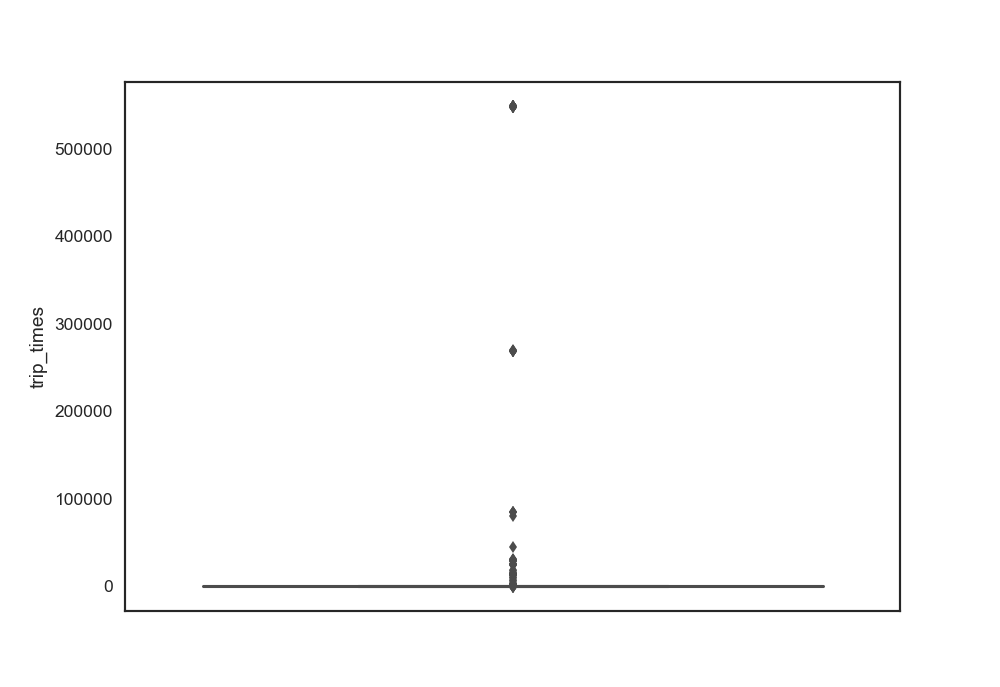

In [10]:
sns.set_style('white')
# the skewed box plot shows us the presence of outliers 
sns.boxplot(y="trip_times", data =frame_with_durations)
plt.show()

In [12]:
#calculating 0-100th percentile to find a the correct percentile value for removal of outliers
for i in range(0,100,10):
    var =frame_with_durations["trip_times"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

0 percentile value is -1211.0166666666667
10 percentile value is 3.8333333333333335
20 percentile value is 5.383333333333334
30 percentile value is 6.816666666666666
40 percentile value is 8.3
50 percentile value is 9.95
60 percentile value is 11.866666666666667
70 percentile value is 14.283333333333333
80 percentile value is 17.633333333333333
90 percentile value is 23.45
100 percentile value is  548555.6333333333


In [13]:
#looking further from the 99th percecntile
for i in range(90,100):
    var =frame_with_durations["trip_times"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 23.45
91 percentile value is 24.35
92 percentile value is 25.383333333333333
93 percentile value is 26.55
94 percentile value is 27.933333333333334
95 percentile value is 29.583333333333332
96 percentile value is 31.683333333333334
97 percentile value is 34.46666666666667
98 percentile value is 38.71666666666667
99 percentile value is 46.75
100 percentile value is  548555.6333333333


In [11]:
# removing data based on our analysis and TLC regulations
frame_with_durations_modified = frame_with_durations[(
    frame_with_durations.trip_times > 1) & (frame_with_durations.trip_times < 720)]

<IPython.core.display.Javascript object>


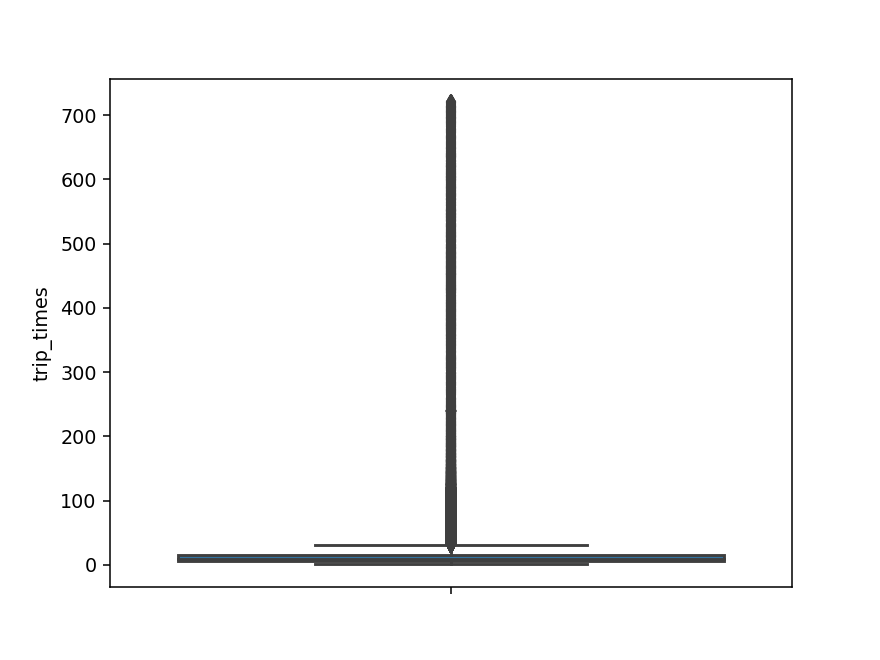

In [15]:
#box-plot after removal of outliers
sns.boxplot(y="trip_times", data =frame_with_durations_modified)
plt.show()

In [12]:
#converting the values to log-values to chec for log-normal
import math
frame_with_durations_modified['log_times']=[math.log(i) for i in frame_with_durations_modified['trip_times'].values]

<IPython.core.display.Javascript object>


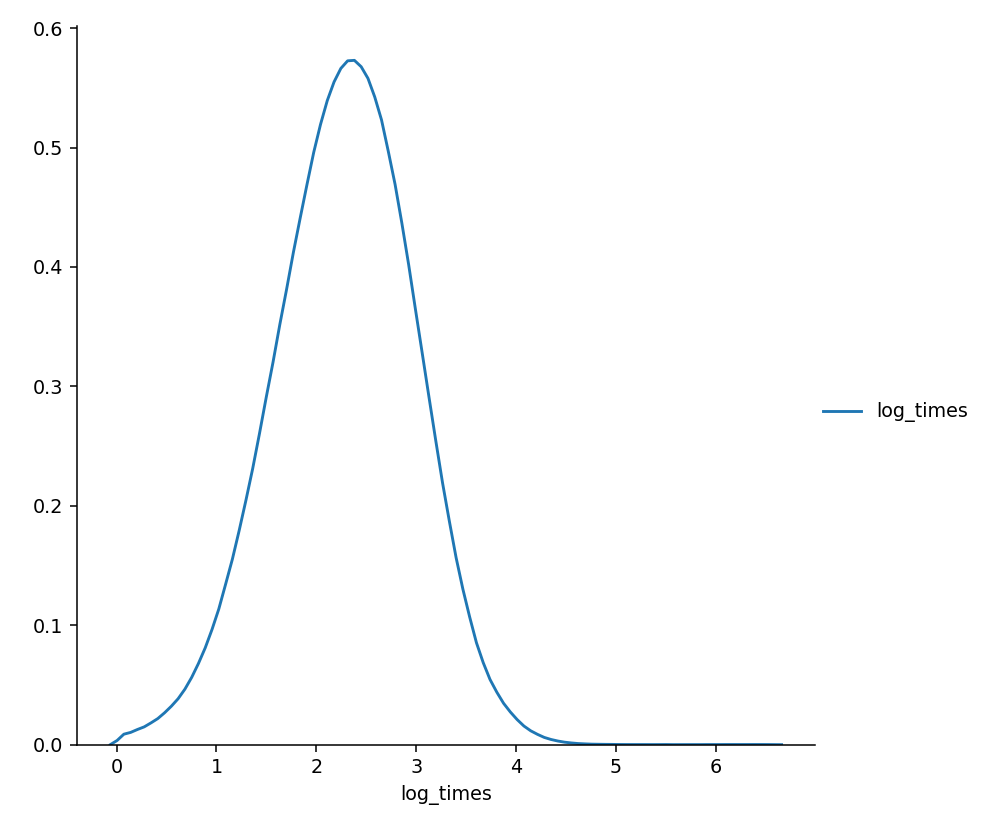

In [17]:
#pdf of log-values
sns.FacetGrid(frame_with_durations_modified,size=6) \
      .map(sns.kdeplot,"log_times") \
      .add_legend();
plt.show();

<IPython.core.display.Javascript object>


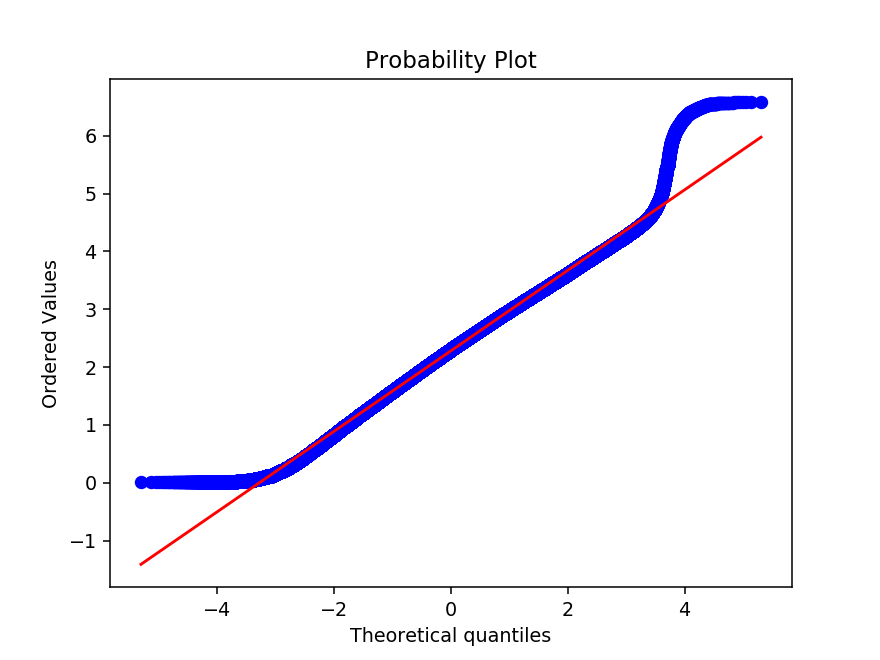

In [20]:
import scipy
plt.style.use('default')
#Q-Q plot for checking if trip-times is log-normal
scipy.stats.probplot(frame_with_durations_modified['log_times'].values, plot=plt)
plt.show()

### 4. Speed

<IPython.core.display.Javascript object>


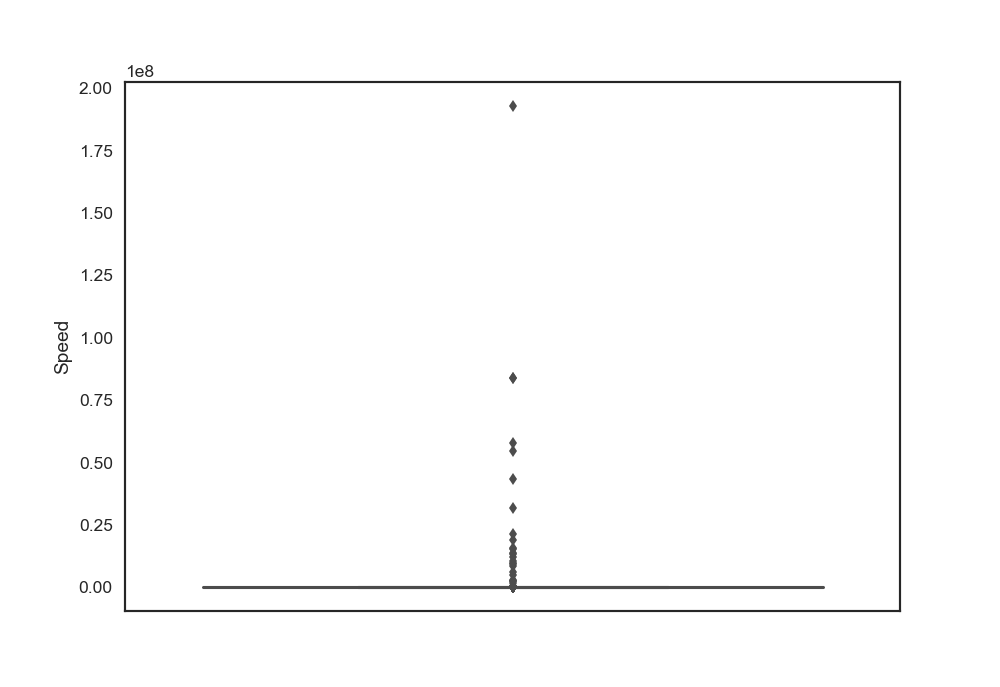

In [13]:
# check for any outliers in the data after trip duration outliers removed
# box-plot for speeds with outliers
frame_with_durations_modified['Speed'] = 60*(frame_with_durations_modified['trip_distance']/frame_with_durations_modified['trip_times'])
sns.boxplot(y="Speed", data =frame_with_durations_modified)
plt.show()

In [27]:
#calculating speed values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 6.409495548961425
20 percentile value is 7.80952380952381
30 percentile value is 8.929133858267717
40 percentile value is 9.98019801980198
50 percentile value is 11.06865671641791
60 percentile value is 12.286689419795222
70 percentile value is 13.796407185628745
80 percentile value is 15.963224893917962
90 percentile value is 20.186915887850468
100 percentile value is  192857142.85714284


In [28]:
#calculating speed values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 20.186915887850468
91 percentile value is 20.91645569620253
92 percentile value is 21.752988047808763
93 percentile value is 22.721893491124263
94 percentile value is 23.844155844155843
95 percentile value is 25.182552504038775
96 percentile value is 26.80851063829787
97 percentile value is 28.84304932735426
98 percentile value is 31.591128254580514
99 percentile value is 35.7513566847558
100 percentile value is  192857142.85714284


In [29]:
#calculating speed values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 35.7513566847558
99.1 percentile value is 36.31084727468969
99.2 percentile value is 36.91470054446461
99.3 percentile value is 37.588235294117645
99.4 percentile value is 38.33035714285714
99.5 percentile value is 39.17580340264651
99.6 percentile value is 40.15384615384615
99.7 percentile value is 41.338301043219076
99.8 percentile value is 42.86631016042781
99.9 percentile value is 45.3107822410148
100 percentile value is  192857142.85714284


In [14]:
#removing further outliers based on the 99.9th percentile value
frame_with_durations_modified=frame_with_durations[(frame_with_durations.Speed>0) & (frame_with_durations.Speed<45.31)]

In [15]:
#avg.speed of cabs in New-York
sum(frame_with_durations_modified["Speed"]) / float(len(frame_with_durations_modified["Speed"]))

12.450173996027528

<b style='font-size:16px'>The avg speed in Newyork speed is 12.45miles/hr, so a cab driver can travel <font color='blue'> 2 miles per 10min on avg.</font> </b>

### 4. Trip Distance

<IPython.core.display.Javascript object>


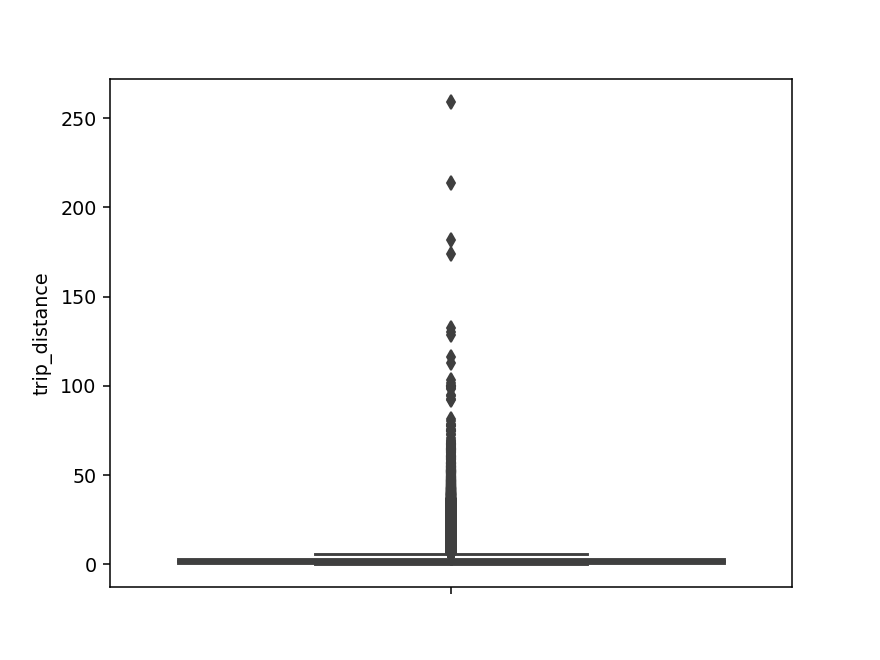

In [23]:
# up to now we have removed the outliers based on trip durations and cab speeds
# lets try if there are any outliers in trip distances
# box-plot showing outliers in trip-distance values
sns.boxplot(y="trip_distance", data =frame_with_durations_modified)
plt.show()

In [34]:
#calculating trip distance values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.01
10 percentile value is 0.66
20 percentile value is 0.9
30 percentile value is 1.1
40 percentile value is 1.39
50 percentile value is 1.69
60 percentile value is 2.07
70 percentile value is 2.6
80 percentile value is 3.6
90 percentile value is 5.97
100 percentile value is  258.9


In [35]:
#calculating trip distance values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 5.97
91 percentile value is 6.45
92 percentile value is 7.07
93 percentile value is 7.85
94 percentile value is 8.72
95 percentile value is 9.6
96 percentile value is 10.6
97 percentile value is 12.1
98 percentile value is 16.03
99 percentile value is 18.17
100 percentile value is  258.9


In [36]:
#calculating trip distance values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 18.17
99.1 percentile value is 18.37
99.2 percentile value is 18.6
99.3 percentile value is 18.83
99.4 percentile value is 19.13
99.5 percentile value is 19.5
99.6 percentile value is 19.96
99.7 percentile value is 20.5
99.8 percentile value is 21.22
99.9 percentile value is 22.57
100 percentile value is  258.9


In [16]:
# removing further outliers based on the 99.9th percentile value
frame_with_durations_modified = frame_with_durations[(
    frame_with_durations.trip_distance > 0) & (frame_with_durations.trip_distance < 23)]

<IPython.core.display.Javascript object>


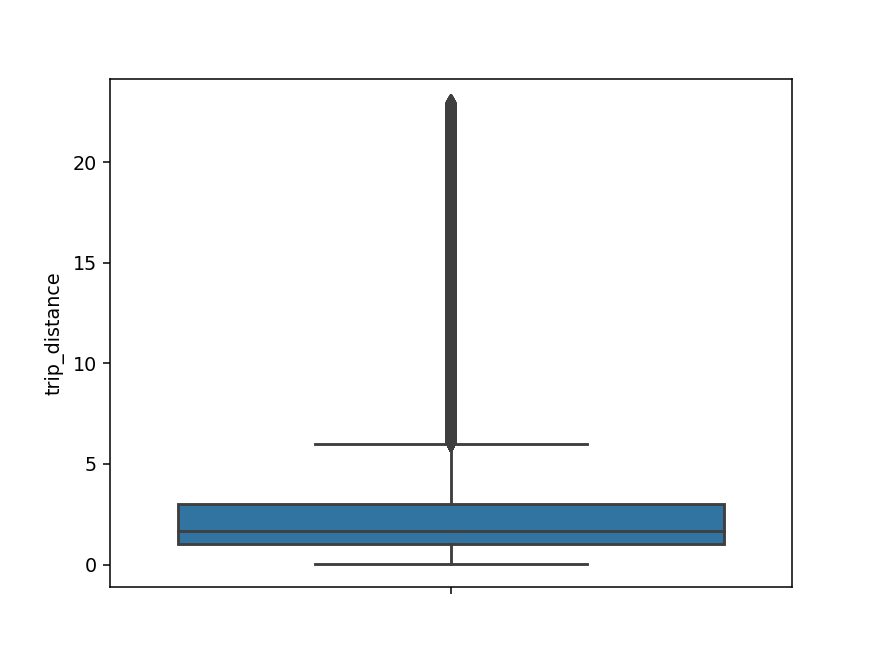

In [25]:
#box-plot after removal of outliers
sns.boxplot(y="trip_distance", data = frame_with_durations_modified)
plt.show()

### 5. Total Fare

<IPython.core.display.Javascript object>


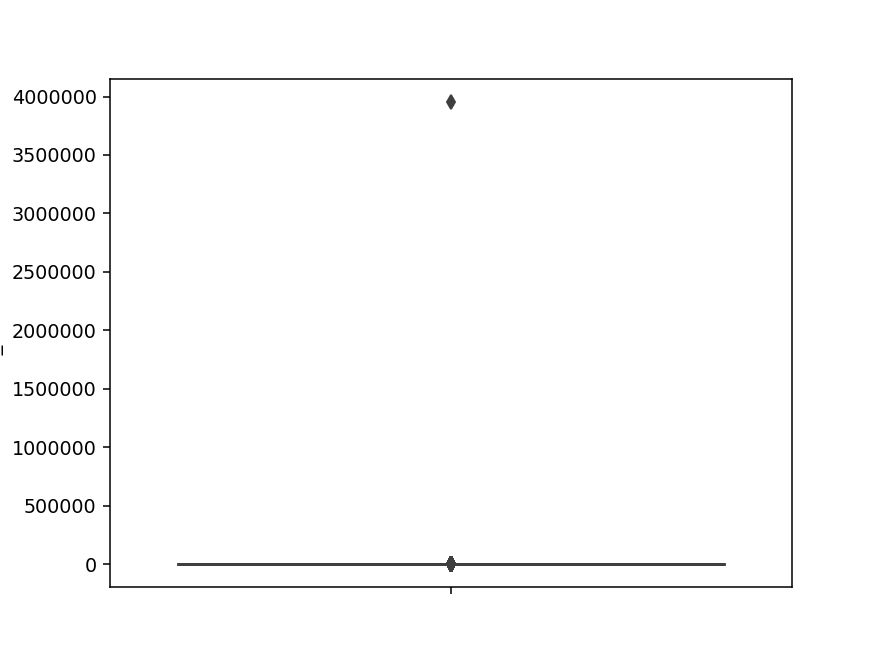

In [26]:
# up to now we have removed the outliers based on trip durations, cab speeds, and trip distances
# lets try if there are any outliers in based on the total_amount
# box-plot showing outliers in fare
sns.boxplot(y="total_amount", data =frame_with_durations_modified)
plt.show()

In [40]:
#calculating total fare amount values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is -242.55
10 percentile value is 6.3
20 percentile value is 7.8
30 percentile value is 8.8
40 percentile value is 9.8
50 percentile value is 11.16
60 percentile value is 12.8
70 percentile value is 14.8
80 percentile value is 18.3
90 percentile value is 25.8
100 percentile value is  3950611.6


In [41]:
#calculating total fare amount values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 25.8
91 percentile value is 27.3
92 percentile value is 29.3
93 percentile value is 31.8
94 percentile value is 34.8
95 percentile value is 38.53
96 percentile value is 42.6
97 percentile value is 48.13
98 percentile value is 58.13
99 percentile value is 66.13
100 percentile value is  3950611.6


In [42]:
#calculating total fare amount values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 66.13
99.1 percentile value is 68.13
99.2 percentile value is 69.6
99.3 percentile value is 69.6
99.4 percentile value is 69.73
99.5 percentile value is 69.75
99.6 percentile value is 69.76
99.7 percentile value is 72.58
99.8 percentile value is 75.35
99.9 percentile value is 88.28
100 percentile value is  3950611.6


<b>Observation:-</b> As even the 99.9th percentile value doesnt look like an outlier,as there is not much difference between the 99.8th percentile and 99.9th percentile, we move on to do graphical analyis

<IPython.core.display.Javascript object>


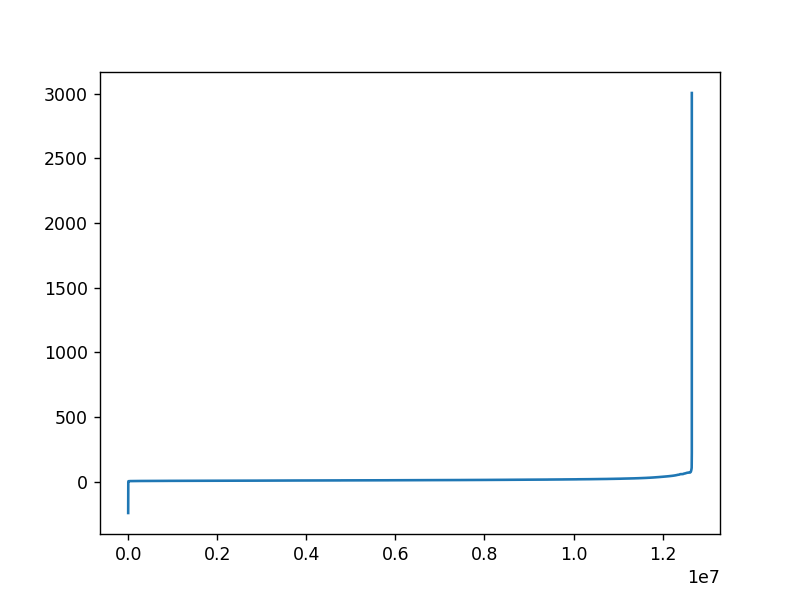

In [43]:
#below plot shows us the fare values(sorted) to find a sharp increase to remove those values as outliers
# plot the fare amount excluding last two values in sorted data
plt.plot(var[:-2])
plt.show()

<IPython.core.display.Javascript object>


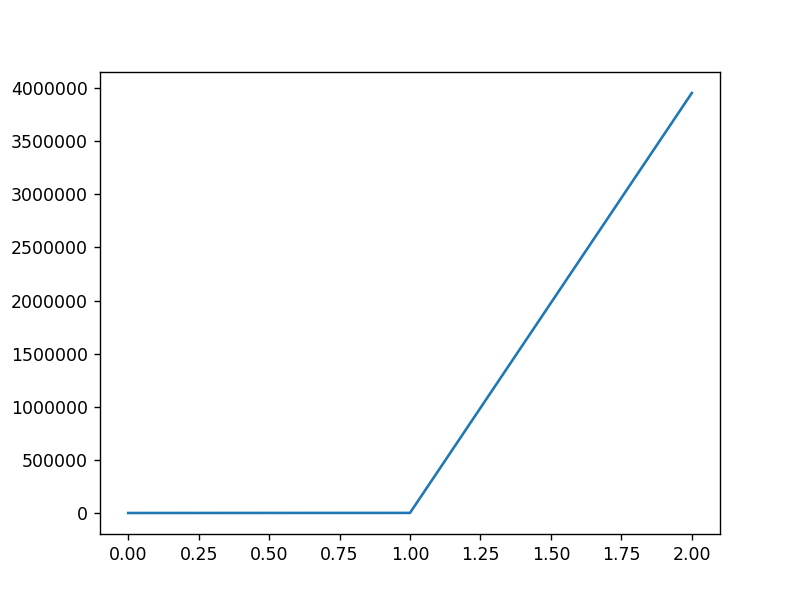

In [44]:
# a very sharp increase in fare values can be seen 
# plotting last three total fare values, and we can observe there is share increase in the values
plt.plot(var[-3:])
plt.show()

<IPython.core.display.Javascript object>


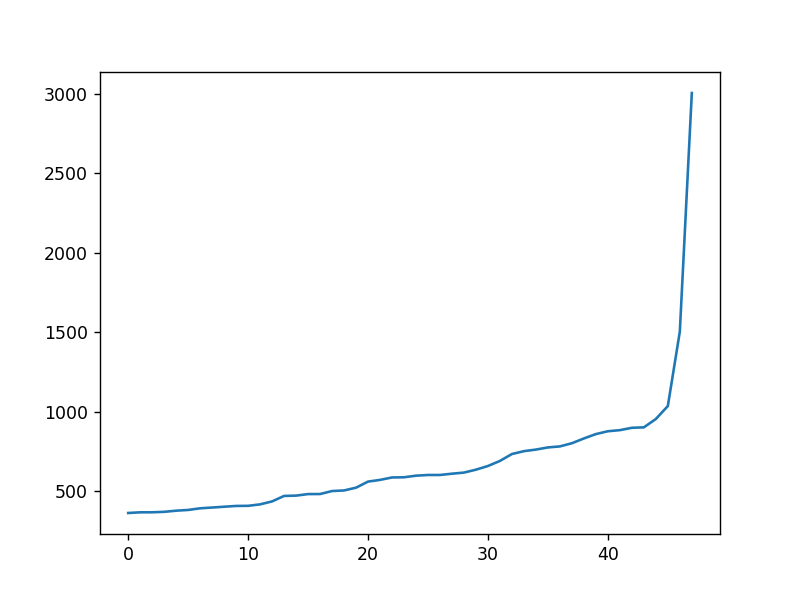

In [45]:
#now looking at values not including the last two points we again find a drastic increase at around 1000 fare value
# we plot last 50 values excluding last two values
plt.plot(var[-50:-2])
plt.show()

## Remove all outliers/erronous points.

In [17]:
#removing all outliers based on our univariate analysis above
def remove_outliers(new_frame):

    
    a = new_frame.shape[0]
    print ("Number of pickup records = ",a)
    temp_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    b = temp_frame.shape[0]
    print ("Number of outlier coordinates lying outside NY boundaries:",(a-b))

    
    temp_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    c = temp_frame.shape[0]
    print ("Number of outliers from trip times analysis:",(a-c))
    
    
    temp_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    d = temp_frame.shape[0]
    print ("Number of outliers from trip distance analysis:",(a-d))
    
    temp_frame = new_frame[(new_frame.Speed <= 65) & (new_frame.Speed >= 0)]
    e = temp_frame.shape[0]
    print ("Number of outliers from speed analysis:",(a-e))
    
    temp_frame = new_frame[(new_frame.total_amount <1000) & (new_frame.total_amount >0)]
    f = temp_frame.shape[0]
    print ("Number of outliers from fare analysis:",(a-f))
    
    
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    new_frame = new_frame[(new_frame.Speed < 45.31) & (new_frame.Speed > 0)]
    new_frame = new_frame[(new_frame.total_amount <1000) & (new_frame.total_amount >0)]
    
    print ("Total outliers removed",a - new_frame.shape[0])
    print ("---")
    return new_frame

In [18]:
print("Removing outliers in the month of Jan-2015")
print("----")
frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
print("fraction of data points that remain after removing outliers", float(
    len(frame_with_durations_outliers_removed))/len(frame_with_durations))

Removing outliers in the month of Jan-2015
----
Number of pickup records =  12748986
Number of outlier coordinates lying outside NY boundaries: 293919
Number of outliers from trip times analysis: 23889
Number of outliers from trip distance analysis: 92597
Number of outliers from speed analysis: 24473
Number of outliers from fare analysis: 5275
Total outliers removed 377910
---
fraction of data points that remain after removing outliers 0.9703576425607495


# Data-preparation
## Clustering/Segmentation

In [19]:
# trying different cluster sizes to choose the right K in K-means
coords = frame_with_durations_outliers_removed[[
    'pickup_latitude', 'pickup_longitude']].values
neighbours = []

In [19]:
def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    less2 = []
    more2 = []
    min_dist = 1000
    for i in range(0, cluster_len):
        nice_points = 0
        wrong_points = 0
        for j in range(0, cluster_len):
            if j != i:
                distance = gpxpy.geo.haversine_distance(
                    cluster_centers[i][0], cluster_centers[i][1], cluster_centers[j][0], cluster_centers[j][1])
                min_dist = min(min_dist, distance/(1.60934*1000))
                if (distance/(1.60934*1000)) <= 2:
                    nice_points += 1
                else:
                    wrong_points += 1
        less2.append(nice_points)
        more2.append(wrong_points)
    neighbours.append(less2)
    print("On choosing a cluster size of ", cluster_len, "\nAvg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2):", np.ceil(sum(less2)/len(less2)),
          "\nAvg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2):", np.ceil(sum(more2)/len(more2)), "\nMin inter-cluster distance = ", min_dist, "\n---")


def find_clusters(increment):
    kmeans = MiniBatchKMeans(n_clusters=increment,
                             batch_size=10000, random_state=42).fit(coords)
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(
        frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    cluster_centers = kmeans.cluster_centers_
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len


# we need to choose number of clusters so that, there are more number of cluster regions
# that are close to any cluster center
# and make sure that the minimum inter cluster should not be very less
for increment in range(10, 100, 10):
    cluster_centers, cluster_len = find_clusters(increment)
    find_min_distance(cluster_centers, cluster_len)

On choosing a cluster size of  10 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 2.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 8.0 
Min inter-cluster distance =  1.0945442325142543 
---
On choosing a cluster size of  20 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 4.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 16.0 
Min inter-cluster distance =  0.7131298007387813 
---
On choosing a cluster size of  30 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 8.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 22.0 
Min inter-cluster distance =  0.5185088176172206 
---
On choosing a cluster size of  40 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 8.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 32.0 
Min inter-cluster distance 

### Inference:
- The main objective was to find a optimal min. distance(Which roughly estimates to the radius of a cluster) between the clusters which we got was 40

In [20]:
# if check for the 50 clusters you can observe that there are two clusters with only 0.3 miles apart from each other
# so we choose 40 clusters for solve the further problem

# Getting 40 clusters using the kmeans
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000,
                         random_state=0).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(
    frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

### Plotting the cluster centers:

In [21]:
# Plotting the cluster centers on OSM
cluster_centers = kmeans.cluster_centers_
cluster_len = len(cluster_centers)
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')
for i in range(cluster_len):
    folium.Marker(list((cluster_centers[i][0], cluster_centers[i][1])), popup=(
        str(cluster_centers[i][0])+str(cluster_centers[i][1]))).add_to(map_osm)
map_osm

### Plotting the clusters:

<IPython.core.display.Javascript object>


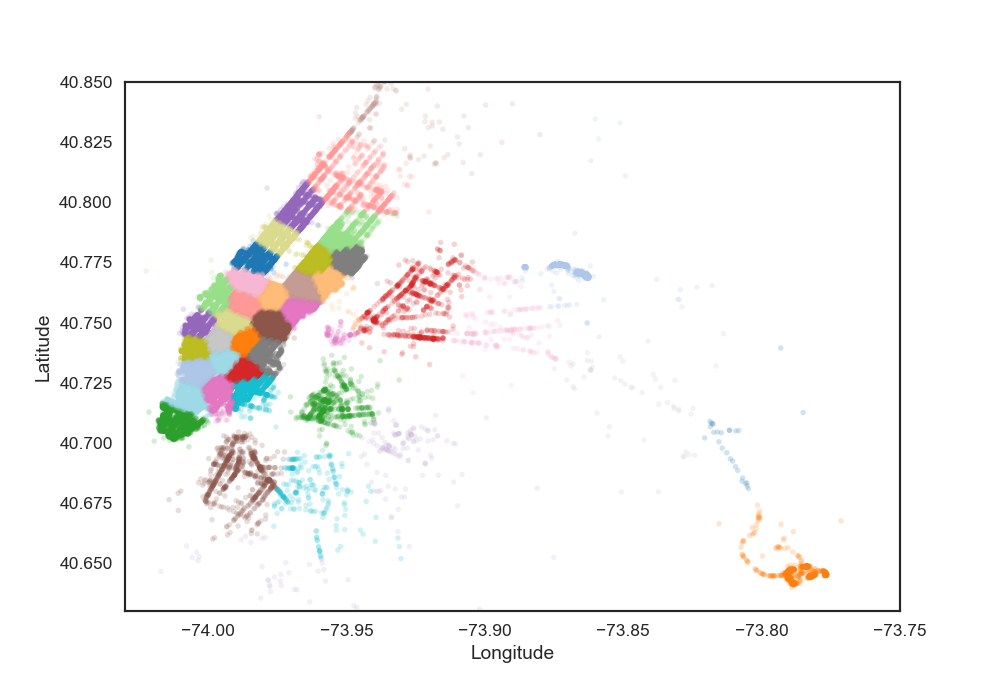

In [22]:
#Visualising the clusters on a map
def plot_clusters(frame):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)
    fig, ax = plt.subplots(ncols=1, nrows=1)
    ax.scatter(frame.pickup_longitude.values[:100000], frame.pickup_latitude.values[:100000], s=10, lw=0,
               c=frame.pickup_cluster.values[:100000], cmap='tab20', alpha=0.2)
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()

plot_clusters(frame_with_durations_outliers_removed)

## Time-binning

In [23]:
#Refer:https://www.unixtimestamp.com/
# 1420070400 : 2015-01-01 00:00:00 
# 1422748800 : 2015-02-01 00:00:00 
# 1425168000 : 2015-03-01 00:00:00
# 1427846400 : 2015-04-01 00:00:00 
# 1430438400 : 2015-05-01 00:00:00 
# 1433116800 : 2015-06-01 00:00:00

# 1451606400 : 2016-01-01 00:00:00 
# 1454284800 : 2016-02-01 00:00:00 
# 1456790400 : 2016-03-01 00:00:00
# 1459468800 : 2016-04-01 00:00:00 
# 1462060800 : 2016-05-01 00:00:00 
# 1464739200 : 2016-06-01 00:00:00

def add_pickup_bins(frame,month,year):
    unix_pickup_times=[i for i in frame['pickup_times'].values]
    unix_times = [[1420070400,1422748800,1425168000,1427846400,1430438400,1433116800],\
                    [1451606400,1454284800,1456790400,1459468800,1462060800,1464739200]]
    
    start_pickup_unix=unix_times[year-2015][month-1]
    # https://www.timeanddate.com/time/zones/est
    # (int((i-start_pickup_unix)/600)+33) : our unix time is in gmt to we are converting it to est
    tenminutewise_binned_unix_pickup_times=[(int((i-start_pickup_unix)/600)+33) for i in unix_pickup_times]
    frame['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
    return frame

In [24]:
# clustering, making pickup bins and grouping by pickup cluster and pickup bins
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(
    frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
jan_2015_frame = add_pickup_bins(
    frame_with_durations_outliers_removed, 1, 2015)
jan_2015_groupby = jan_2015_frame[['pickup_cluster', 'pickup_bins', 'trip_distance']].groupby(
    ['pickup_cluster', 'pickup_bins']).count()

In [25]:
# we add two more columns 'pickup_cluster'(to which cluster it belogns to) 
# and 'pickup_bins' (to which 10min intravel the trip belongs to)
jan_2015_frame.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed,pickup_cluster,pickup_bins
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421329e+09,5.285319,34,2130
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420902e+09,9.983193,2,1419
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420902e+09,10.746269,16,1419
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420902e+09,16.071429,38,1419
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420902e+09,9.318378,22,1419


In [26]:
# hear the trip_distance represents the number of pickups that are happend in that particular 10min intravel
# this data frame has two indices
# primary index: pickup_cluster (cluster number)
# secondary index : pickup_bins (we devid whole months time into 10min intravels 24*31*60/10 =4464bins)
jan_2015_groupby.head()

trip_distance
pickup_cluster pickup_bins               
0              1                      105
               2                      199
               3                      208
               4                      141
               5                      155

In [27]:
# upto now we cleaned data and prepared data for the month 2015,

# now do the same operations for months Jan, Feb, March of 2016
# 1. get the dataframe which inlcudes only required colums
# 2. adding trip times, speed, unix time stamp of pickup_time
# 4. remove the outliers based on trip_times, speed, trip_duration, total_amount
# 5. add pickup_cluster to each data point
# 6. add pickup_bin (index of 10min intravel to which that trip belongs to)
# 7. group by data, based on 'pickup_cluster' and 'pickuo_bin'

# Data Preparation for the months of Jan,Feb and March 2016


def datapreparation(month, kmeans, month_no, year_no):

    print("Return with trip times..")

    frame_with_durations = return_with_trip_times(month)

    print("Remove outliers..")
    frame_with_durations_outliers_removed = remove_outliers(
        frame_with_durations)

    print("Estimating clusters..")
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(
        frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    #frame_with_durations_outliers_removed_2016['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed_2016[['pickup_latitude', 'pickup_longitude']])

    print("Final groupbying..")
    final_updated_frame = add_pickup_bins(
        frame_with_durations_outliers_removed, month_no, year_no)
    final_groupby_frame = final_updated_frame[['pickup_cluster', 'pickup_bins', 'trip_distance']].groupby(
        ['pickup_cluster', 'pickup_bins']).count()

    return final_updated_frame, final_groupby_frame


month_jan_2016 = dd.read_csv('yellow_tripdata_2016-01.csv')
# month_feb_2016 = dd.read_csv('yellow_tripdata_2016-02.csv')
# month_mar_2016 = dd.read_csv('yellow_tripdata_2016-03.csv')

jan_2016_frame, jan_2016_groupby = datapreparation(
    month_jan_2016, kmeans, 1, 2016)
# feb_2016_frame, feb_2016_groupby = datapreparation(
#     month_feb_2016, kmeans, 2, 2016)
# mar_2016_frame, mar_2016_groupby = datapreparation(
#     month_mar_2016, kmeans, 3, 2016)

Return with trip times..
Remove outliers..
Number of pickup records =  10906858
Number of outlier coordinates lying outside NY boundaries: 214677
Number of outliers from trip times analysis: 27190
Number of outliers from trip distance analysis: 79742
Number of outliers from speed analysis: 21047
Number of outliers from fare analysis: 4991
Total outliers removed 297784
---
Estimating clusters..
Final groupbying..


## Smoothing

In [28]:
# Gets the unique bins where pickup values are present for each each reigion

# for each cluster region we will collect all the indices of 10min intravels in which the pickups are happened
# we got an observation that there are some pickpbins that doesnt have any pickups
def return_unq_pickup_bins(frame):
    values = []
    for i in range(0,40):
        new = frame[frame['pickup_cluster'] == i]
        list_unq = list(set(new['pickup_bins']))
        list_unq.sort()
        values.append(list_unq)
    return values

In [29]:
# for every month we get all indices of 10min intravels in which atleast one pickup got happened

#jan
jan_2015_unique = return_unq_pickup_bins(jan_2015_frame)
jan_2016_unique = return_unq_pickup_bins(jan_2016_frame)

#feb
# feb_2016_unique = return_unq_pickup_bins(feb_2016_frame)

#march
# mar_2016_unique = return_unq_pickup_bins(mar_2016_frame)

In [30]:
# for each cluster number of 10min intravels with 0 pickups
for i in range(40):
    print("For the ",i,"th cluster, number of 10min intervals with zero pickups: ",4464 - len(set(jan_2015_unique[i])))
    print('-'*60)

For the  0 th cluster, number of 10min intervals with zero pickups:  41
------------------------------------------------------------
For the  1 th cluster, number of 10min intervals with zero pickups:  1986
------------------------------------------------------------
For the  2 th cluster, number of 10min intervals with zero pickups:  30
------------------------------------------------------------
For the  3 th cluster, number of 10min intervals with zero pickups:  355
------------------------------------------------------------
For the  4 th cluster, number of 10min intervals with zero pickups:  38
------------------------------------------------------------
For the  5 th cluster, number of 10min intervals with zero pickups:  154
------------------------------------------------------------
For the  6 th cluster, number of 10min intervals with zero pickups:  35
------------------------------------------------------------
For the  7 th cluster, number of 10min intervals with zero pickup

there are two ways to fill up these values
<ul>
<li> Fill the missing value with 0's</li>
<li> Fill the missing values with the avg values
<ul>
<li> Case 1:(values missing at the start)  <br>Ex1: \_ \_ \_ x =>ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4) <br> Ex2: \_ \_ x => ceil(x/3), ceil(x/3), ceil(x/3) </li>
<li> Case 2:(values missing in middle) <br>Ex1: x \_ \_ y => ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4) <br> Ex2: x \_ \_ \_ y => ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5) </li>
<li> Case 3:(values missing at the end)  <br>Ex1: x \_ \_ \_  => ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4) <br> Ex2: x \_  => ceil(x/2), ceil(x/2) </li>
</ul>
</li>
</ul>

In [31]:
# Fills a value of zero for every bin where no pickup data is present 
# the count_values: number pickps that are happened in each region for each 10min interval
# there wont be any value if there are no picksups.
# values: number of unique bins

# for every 10min interval(pickup_bin) we will check it is there in our unique bin,
# if it is there we will add the count_values[index] to smoothed data
# if not we add 0 to the smoothed data
# we finally return smoothed data
def fill_missing(count_values,values):
    smoothed_regions=[]
    ind=0
    for r in range(0,40):
        smoothed_bins=[]
        for i in range(4464):
            if i in values[r]:
                smoothed_bins.append(count_values[ind])
                ind+=1
            else:
                smoothed_bins.append(0)
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions

In [32]:
# Fills a value of zero for every bin where no pickup data is present 
# the count_values: number pickps that are happened in each region for each 10min interval
# there wont be any value if there are no picksups.
# values: number of unique bins

# for every 10min interval(pickup_bin) we will check it is there in our unique bin,
# if it is there we will add the count_values[index] to smoothed data
# if not we add smoothed data (which is calculated based on the methods that are discussed in the above markdown cell)
# we finally return smoothed data
def smoothing(count_values,values):
    smoothed_regions=[] # stores list of final smoothed values of each reigion
    ind=0
    repeat=0 
    smoothed_value=0
    for r in range(0,40):
        smoothed_bins=[] #stores the final smoothed values
        repeat=0
        for i in range(4464):
            if repeat!=0: # prevents iteration for a value which is already visited/resolved
                repeat-=1
                continue
            if i in values[r]: #checks if the pickup-bin exists 
                smoothed_bins.append(count_values[ind]) # appends the value of the pickup bin if it exists
            else:
                if i!=0:
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]: #searches for the left-limit or the pickup-bin value which has a pickup value
                            continue
                        else:
                            right_hand_limit=j
                            break
                    if right_hand_limit==0:
                    #Case 1: When we have the last/last few values are found to be missing,hence we have no right-limit here
                        smoothed_value=count_values[ind-1]*1.0/((4463-i)+2)*1.0                               
                        for j in range(i,4464):                              
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(4463-i)
                        ind-=1
                    else:
                    #Case 2: When we have the missing values between two known values
                        smoothed_value=(count_values[ind-1]+count_values[ind])*1.0/((right_hand_limit-i)+2)*1.0             
                        for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(right_hand_limit-i)
                else:
                    #Case 3: When we have the first/first few values are found to be missing,hence we have no left-limit here
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]:
                            continue
                        else:
                            right_hand_limit=j
                            break
                    smoothed_value=count_values[ind]*1.0/((right_hand_limit-i)+1)*1.0
                    for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                    repeat=(right_hand_limit-i)
            ind+=1
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions


In [33]:
#Filling Missing values of Jan-2015 with 0
# here in jan_2015_groupby dataframe the trip_distance represents the number of pickups that are happened
jan_2015_fill = fill_missing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)

#Smoothing Missing values of Jan-2015
jan_2015_smooth = smoothing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)

In [34]:
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*30*60/10 = 4320
# for each cluster we will have 4464 values, therefore 40*4464 = 178560 (length of the jan_2015_fill)
print("Number of 10min intervals among all the clusters ",len(jan_2015_fill))

Number of 10min intervals among all the clusters  178560


<IPython.core.display.Javascript object>


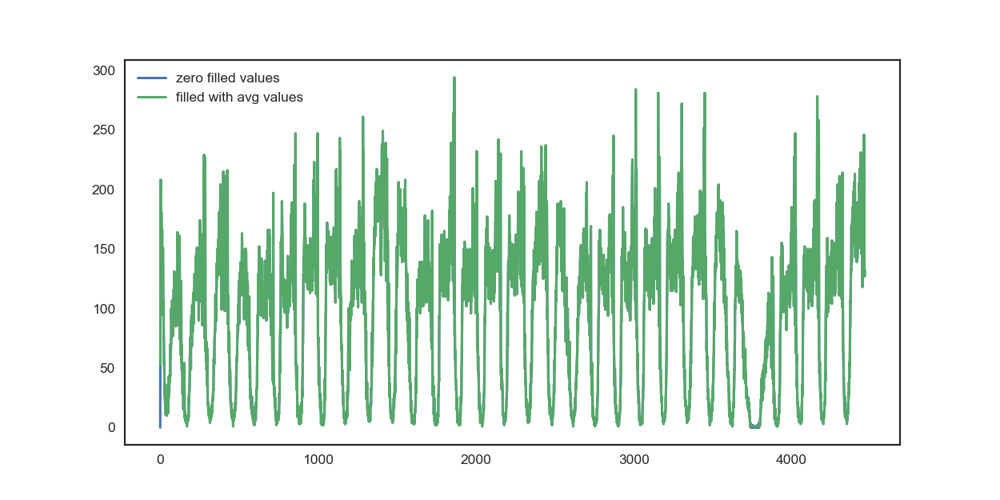

In [35]:
# Smoothing vs Filling
# sample plot that shows two variations of filling missing values
# we have taken the number of pickups for cluster region 2
plt.figure(figsize=(10,5))
plt.plot(jan_2015_fill[0:4464], label="zero filled values")
plt.plot(jan_2015_smooth[0:4464], label="filled with avg values")
plt.legend()
plt.show()

In [ ]:
# why we choose, these methods and which method is used for which data?

# Ans: consider we have data of some month in 2015 jan 1st, 10 _ _ _ 20, i.e there are 10 pickups that are happened in 1st 
# 10st 10min intravel, 0 pickups happened in 2nd 10mins intravel, 0 pickups happened in 3rd 10min intravel 
# and 20 pickups happened in 4th 10min intravel.
# in fill_missing method we replace these values like 10, 0, 0, 20
# where as in smoothing method we replace these values as 6,6,6,6,6, if you can check the number of pickups 
# that are happened in the first 40min are same in both cases, but if you can observe that we looking at the future values 
# wheen you are using smoothing we are looking at the future number of pickups which might cause a data leakage.

# so we use smoothing for jan 2015th data since it acts as our training data
# and we use simple fill_misssing method for 2016th data.

In [36]:
# Jan-2015 data is smoothed, Jan,Feb & March 2016 data missing values are filled with zero
jan_2015_smooth = smoothing(
    jan_2015_groupby['trip_distance'].values, jan_2015_unique)
jan_2016_smooth = fill_missing(
    jan_2016_groupby['trip_distance'].values, jan_2016_unique)
# feb_2016_smooth = fill_missing(
#     feb_2016_groupby['trip_distance'].values, feb_2016_unique)
# mar_2016_smooth = fill_missing(
#     mar_2016_groupby['trip_distance'].values, mar_2016_unique)

# Making list of all the values of pickup data in every bin in Jan 2016 and storing them region-wise
regionwise_jan2016_pickups = []

# a =[1,2,3]
# b = [2,3,4]
# a+b = [1, 2, 3, 2, 3, 4]

# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regions_cum: it will contain 40 lists, each list will contain 4464+4176+4464 values which represents the number of pickups
# that are happened for three months in 2016 data

for i in range(0, 40):
    regionwise_jan2016_pickups.append(jan_2016_smooth[4464*i:4464*(i+1)])

In [43]:
with open('regionwise_jan2016_pickups.pkl', 'wb') as f:
    pickle.dump(regionwise_jan2016_pickups, f)
with open('jan_2016_smooth.pkl', 'wb') as f:
    pickle.dump(jan_2016_smooth, f)

In [7]:
with open('regionwise_jan2016_pickups.pkl', 'rb') as f:
    regionwise_jan2016_pickups = pickle.load(f)
with open('jan_2016_smooth.pkl', 'rb') as f:
    jan_2016_smooth = pickle.load(f)

EOFError: Ran out of input

In [44]:
len(jan_2016_smooth) == (len(regionwise_jan2016_pickups))*(len(regionwise_jan2016_pickups[0])) == 40*4464

True

## Modelling: Baseline Models

Now we get into modelling in order to forecast the pickup densities for the months of Jan, Feb and March of 2016 for which we are using multiple models with two variations 
1. Using Ratios of the 2016 data to the 2015 data i.e $\begin{align} R_{t} = P^{2016}_{t} / P^{2015}_{t} \end{align}$
2. Using Previous known values of the 2016 data itself to predict the future values

In [38]:
#Preparing the Dataframe only with x(i) values as jan-2015 data and y(i) values as jan-2016
ratios_jan = pd.DataFrame()
ratios_jan['Given']=jan_2015_smooth
ratios_jan['Prediction']=jan_2016_smooth
ratios_jan['Ratios']=ratios_jan['Prediction']*1.0/ratios_jan['Given']*1.0

### Simple Moving Averages
The First Model used is the Moving Averages Model which uses the previous n values in order to predict the next value <br> 

Using Ratio Values - $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3} .... R_{t-n} )/n \end{align}$

In [45]:
def MA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    error=[]
    predicted_values=[]
    window_size=3
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            predicted_ratio=sum((ratios['Ratios'].values)[(i+1)-window_size:(i+1)])/window_size
        else:
            predicted_ratio=sum((ratios['Ratios'].values)[0:(i+1)])/(i+1)
            
    
    ratios['MA_R_Predicted'] = predicted_values
    ratios['MA_R_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 3 is optimal for getting the best results using Moving Averages using previous Ratio values therefore we get $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3})/3 \end{align}$

Next we use the Moving averages of the 2016  values itself to predict the future value using $\begin{align}P_{t} = ( P_{t-1} + P_{t-2} + P_{t-3} .... P_{t-n} )/n \end{align}$

In [46]:
def MA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=1
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            predicted_value=int(sum((ratios['Prediction'].values)[(i+1)-window_size:(i+1)])/window_size)
        else:
            predicted_value=int(sum((ratios['Prediction'].values)[0:(i+1)])/(i+1))
            
    ratios['MA_P_Predicted'] = predicted_values
    ratios['MA_P_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 1 is optimal for getting the best results using Moving Averages using previous 2016 values therefore we get $\begin{align}P_{t} = P_{t-1} \end{align}$

### Weighted Moving Averages
The Moving Avergaes Model used gave equal importance to all the values in the window used, but we know intuitively that the future is more likely to be similar to the latest values and less similar to the older values. Weighted Averages converts this analogy into a mathematical relationship giving the highest weight while computing the averages to the latest previous value and decreasing weights to the subsequent older ones<br>

Weighted Moving Averages using Ratio Values - $\begin{align}R_{t} = ( N*R_{t-1} + (N-1)*R_{t-2} + (N-2)*R_{t-3} .... 1*R_{t-n} )/(N*(N+1)/2) \end{align}$

In [47]:
def WA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.5
    error=[]
    predicted_values=[]
    window_size=5
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Ratios'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
        else:
            sum_values=0
            sum_of_coeff=0
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Ratios'].values)[j-1]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
            
    ratios['WA_R_Predicted'] = predicted_values
    ratios['WA_R_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 5 is optimal for getting the best results using Weighted Moving Averages using previous Ratio values therefore we get $\begin{align} R_{t} = ( 5*R_{t-1} + 4*R_{t-2} + 3*R_{t-3} + 2*R_{t-4} + R_{t-5} )/15 \end{align}$

Weighted Moving Averages using Previous 2016 Values - $\begin{align}P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2) \end{align}$

In [48]:
def WA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=2
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Prediction'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)

        else:
            sum_values=0
            sum_of_coeff=0
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Prediction'].values)[j-1]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)
    
    ratios['WA_P_Predicted'] = predicted_values
    ratios['WA_P_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 2 is optimal for getting the best results using Weighted Moving Averages using previous 2016 values therefore we get $\begin{align} P_{t} = ( 2*P_{t-1} + P_{t-2} )/3 \end{align}$

### Exponential  Weighted Moving Averages
 https://en.wikipedia.org/wiki/Moving_average#Exponential_moving_average
Through weighted averaged we have satisfied the analogy of giving higher weights to the latest value and decreasing weights to the subsequent ones but we still do not know which is the correct weighting scheme as there are infinetly many possibilities in which we can assign weights in a non-increasing order and tune the the hyperparameter window-size. To simplify this process we use Exponential Moving Averages which is a more logical way towards assigning weights and at the same time also using an optimal window-size.

In exponential moving averages we use a single hyperparameter alpha $\begin{align}(\alpha)\end{align}$ which is a value between 0 & 1 and based on the value of the hyperparameter alpha the weights and the window sizes are configured.<br>
For eg. If $\begin{align}\alpha=0.9\end{align}$ then the number of days on which the value of the current iteration is based is~$\begin{align}1/(1-\alpha)=10\end{align}$ i.e. we consider values 10 days prior before we predict the value for the current iteration. Also the weights are assigned using $\begin{align}2/(N+1)=0.18\end{align}$ ,where N = number of prior values being considered, hence from this it is implied that the first or latest value is assigned a weight of 0.18 which keeps exponentially decreasing for the subsequent values.

$\begin{align}R^{'}_{t} = \alpha*R_{t-1} + (1-\alpha)*R^{'}_{t-1}  \end{align}$

In [49]:
def EA_R1_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.6
    error=[]
    predicted_values=[]
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        predicted_ratio = (alpha*predicted_ratio) + (1-alpha)*((ratios['Ratios'].values)[i])
    
    ratios['EA_R1_Predicted'] = predicted_values
    ratios['EA_R1_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$

In [50]:
def EA_P1_Predictions(ratios,month):
    predicted_value= (ratios['Prediction'].values)[0]
    alpha=0.3
    error=[]
    predicted_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        predicted_value =int((alpha*predicted_value) + (1-alpha)*((ratios['Prediction'].values)[i]))
    
    ratios['EA_P1_Predicted'] = predicted_values
    ratios['EA_P1_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

In [51]:
mean_err=[0]*10
median_err=[0]*10
ratios_jan,mean_err[0],median_err[0]=MA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[1],median_err[1]=MA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[2],median_err[2]=WA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[3],median_err[3]=WA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[4],median_err[4]=EA_R1_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[5],median_err[5]=EA_P1_Predictions(ratios_jan,'jan')

## Comparison between baseline models
We have chosen our error metric for comparison between models as <b>MAPE (Mean Absolute Percentage Error)</b> so that we can know that on an average how good is our model with predictions and <b>MSE (Mean Squared Error)</b> is also used so that we have a clearer understanding as to how well our forecasting model performs with outliers so that we make sure that there is not much of a error margin between our prediction and the actual value

In [52]:
print ("Error Metric Matrix (Forecasting Methods) - MAPE & MSE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Moving Averages (Ratios) -                             MAPE: ",mean_err[0],"      MSE: ",median_err[0])
print ("Moving Averages (2016 Values) -                        MAPE: ",mean_err[1],"       MSE: ",median_err[1])
print ("--------------------------------------------------------------------------------------------------------")
print ("Weighted Moving Averages (Ratios) -                    MAPE: ",mean_err[2],"      MSE: ",median_err[2])
print ("Weighted Moving Averages (2016 Values) -               MAPE: ",mean_err[3],"      MSE: ",median_err[3])
print ("--------------------------------------------------------------------------------------------------------")
print ("Exponential Moving Averages (Ratios) -              MAPE: ",mean_err[4],"      MSE: ",median_err[4])
print ("Exponential Moving Averages (2016 Values) -         MAPE: ",mean_err[5],"      MSE: ",median_err[5])

Error Metric Matrix (Forecasting Methods) - MAPE & MSE
--------------------------------------------------------------------------------------------------------
Moving Averages (Ratios) -                             MAPE:  0.1821155173392136       MSE:  400.0625504032258
Moving Averages (2016 Values) -                        MAPE:  0.14292849686975506        MSE:  174.84901993727598
--------------------------------------------------------------------------------------------------------
Weighted Moving Averages (Ratios) -                    MAPE:  0.1784869254376018       MSE:  384.01578741039424
Weighted Moving Averages (2016 Values) -               MAPE:  0.13551088436182082       MSE:  162.46707549283155
--------------------------------------------------------------------------------------------------------
Exponential Moving Averages (Ratios) -              MAPE:  0.17783550194861494       MSE:  378.34610215053766
Exponential Moving Averages (2016 Values) -         MAPE:  0.135091526

<b>Plese Note:-</b> The above comparisons are made using Jan 2015 and Jan 2016 only

From the above matrix it is inferred that the best forecasting model for our prediction would be:-
$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$ i.e Exponential Moving Averages using 2016 Values

## Regression Models

In [53]:
# Preparing data to be split into train and test, The below prepares data in cumulative form which will be later split into test and train
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regionwise_jan2016_pickups: it will contain 40 lists, each list will contain 4464 values which represents the number of 
# pickups that are happened in Jan 2016 data

# print(len(regionwise_jan2016_pickups))
# 40
# print(len(regionwise_jan2016_pickups[0]))
# 4464

# we take number of pickups that are happened in last 5 10min intervals
number_of_time_stamps = 5

# output varaible
# it is list of lists
# it will contain number of pickups 4459 for each cluster
output_pickups = []


# feat_lat will contain 4464-5=4459 times lattitude of cluster center for every cluster
# Ex: [[cent_lat 4459times],[cent_lat 4459times], [cent_lat 4459times].... 40 lists]
# it is list of lists
feat_lat = []


# feat_lon will contain 4464-5=4459 times logitude of cluster center for every cluster
# Ex: [[cent_long 4459times],[cent_long 4459times], [cent_long 4459times].... 40 lists]
# it is list of lists
feat_lon = []

# we will code each day
# sunday = 0, monday=1, tue = 2, wed=3, thur=4, fri=5,sat=6
# for every cluster we will be adding 13099 values, each value represent to which day of the week that pickup bin belongs to
# it is list of lists
feat_weekday = []

# its an numpy array, of shape (4459*40 = 178360, 5)
# each row corresponds to an entry in out data
# for the first row we will have [f0,f1,f2,f3,f4] fi=number of pickups happened in i+1th 10min interval(bin)
# the second row will have [f1,f2,f3,f4,f5]
# the third row will have [f2,f3,f4,f5,f6]
# and so on...
feat_n_pickups = []

# from pdb import set_trace
feat_n_pickups = [0]*number_of_time_stamps
for i in range(0, 40):
    feat_lat.append([kmeans.cluster_centers_[i][0]]*4459)
    feat_lon.append([kmeans.cluster_centers_[i][1]]*4459)
    # jan 1st 2016 is thursday, so we start our day from 4: "(int(k/144))%7+4"
    # our prediction start from 5th 10min interval since we need to have number of pickups that are happened in last 5 pickup bins
    feat_weekday.append([int(((int(k/144)) % 7+4) % 7)
                         for k in range(5, 4464)])
#     set_trace()
    # regionwise_jan2016_pickups is a list of lists [[x1,x2,x3..x4464], [x1,x2,x3..x4464], [x1,x2,x3..x4464], [x1,x2,x3..x4464], [x1,x2,x3..x4464], .. 40 lists]
    feat_n_pickups = np.vstack((feat_n_pickups, [regionwise_jan2016_pickups[i][r:r+number_of_time_stamps]
                                             for r in range(0, len(regionwise_jan2016_pickups[i])-number_of_time_stamps)]))
    output_pickups.append(regionwise_jan2016_pickups[i][5:])

feat_n_pickups = feat_n_pickups[1:]

In [54]:
# Ensuring all dimensions are as required
len(feat_lat[0])*len(feat_lat) == feat_n_pickups.shape[0] == len(feat_weekday) * \
    len(feat_weekday[0]) == 40 * \
    4459 == len(output_pickups)*len(output_pickups[0])

True

In [55]:
# Getting the predictions of exponential moving averages to be used as a feature in cumulative form

# upto now we computed 8 features for every data point that starts from 50th min of the day
# 1. cluster center lattitude
# 2. cluster center longitude
# 3. day of the week 
# 4. f_t_1: number of pickups that are happened previous t-1th 10min intravel
# 5. f_t_2: number of pickups that are happened previous t-2th 10min intravel
# 6. f_t_3: number of pickups that are happened previous t-3th 10min intravel
# 7. f_t_4: number of pickups that are happened previous t-4th 10min intravel
# 8. f_t_5: number of pickups that are happened previous t-5th 10min intravel

# from the baseline models we said the exponential weighted moving avarage gives us the best error
# we will try to add the same exponential weighted moving avarage at t as a feature to our data
# exponential weighted moving avarage => p'(t) = alpha*p'(t-1) + (1-alpha)*P(t-1) 
alpha=0.3

# it is a temporary array that store exponential weighted moving avarage for each 10min intravel, 
# for each cluster it will get reset
# for every cluster it contains 4464 values
predicted_values=[]

# it is similar like feat_lat
# it is list of lists
# predict_list is a list of lists [[x5,x6,x7..x4464], [x5,x6,x7..x4464], [x5,x6,x7..x4464], [x5,x6,x7..x4464], [x5,x6,x7..x4464], .. 40 lists]
predict_list = []
feat_flat_exp_avg = []
for r in range(0,40):
    for i in range(0,4464):
        if i==0:
            predicted_value= regionwise_jan2016_pickups[r][0]
            predicted_values.append(0)
            continue
        predicted_values.append(predicted_value)
        predicted_value =int((alpha*predicted_value) + (1-alpha)*(regionwise_jan2016_pickups[r][i]))
    predict_list.append(predicted_values[5:])
    predicted_values=[]

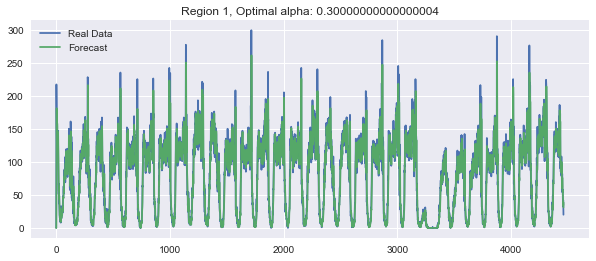

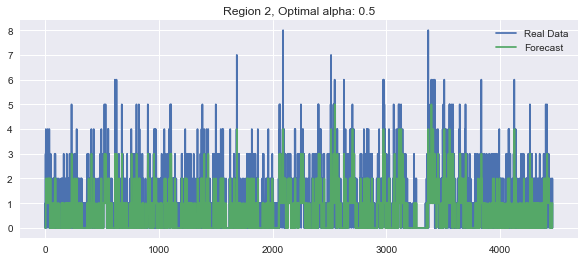

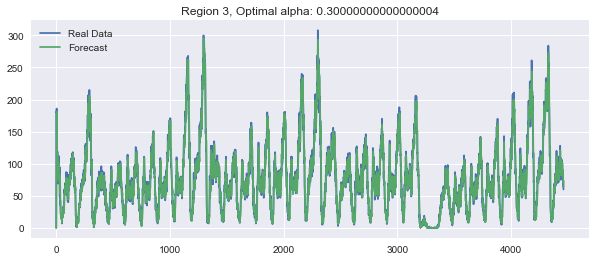

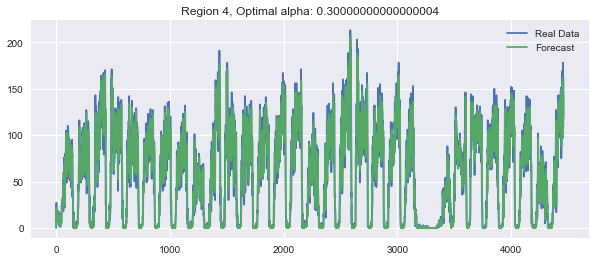

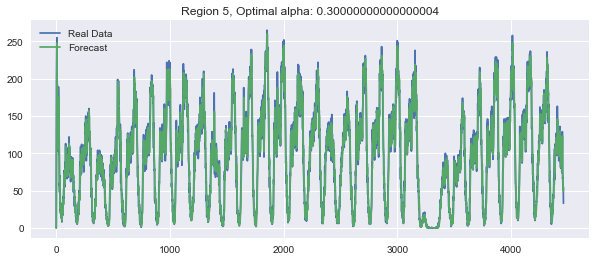

...

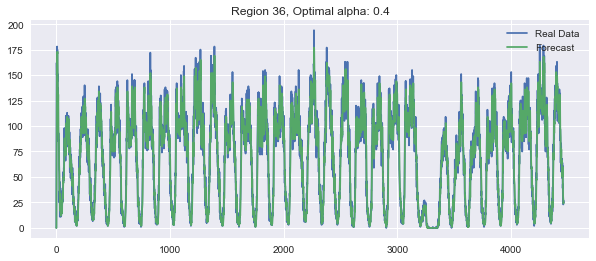

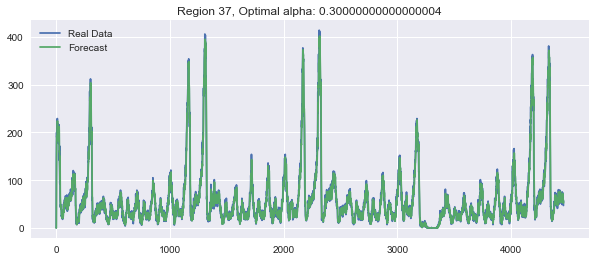

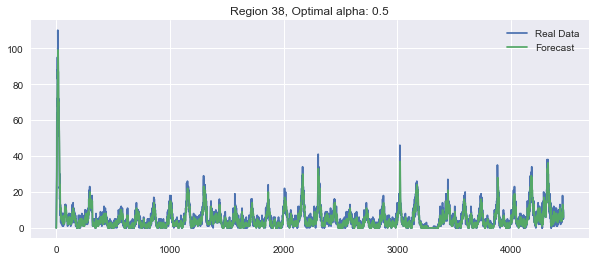

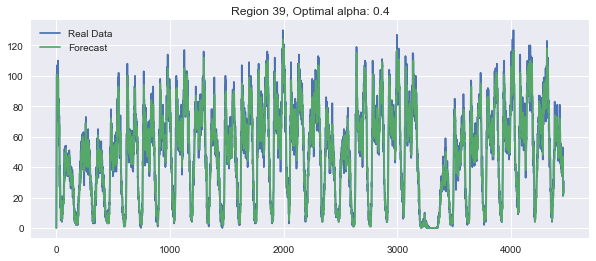

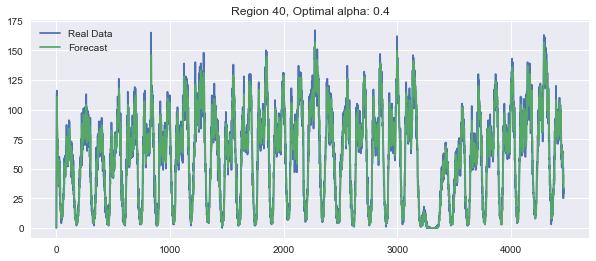

In [35]:
%matplotlib inline
#from pdb import set_trace


def ExpSmoothing(r):
    mse_array = [0]*10
    mape_array = [0]*10

    for j in range(0, 10):
        alpha = (1 + j)*0.1
        predicted_values = []
        for i in range(0, 4464):
            if i == 0:
                predicted_value = regionwise_jan2016_pickups[r][0]
                predicted_values.append(0)
                continue
            predicted_values.append(predicted_value)
            predicted_value = int((alpha*predicted_value) + (1-alpha)*(regionwise_jan2016_pickups[r][i]))
#             set_trace()
#             mse_array[i_gamma][j_alpha] = mean_squared_error(regionwise_jan2016_pickups[r], pt_list)
        mape_array[j] = mean_absolute_error(regionwise_jan2016_pickups[r], predicted_values)/(
            sum(regionwise_jan2016_pickups[r])/len(regionwise_jan2016_pickups[r]))
    optimal_alpha = (1 + np.argmin(mape_array))*0.1   
    return optimal_alpha


predict_list = []

for r in range(40):
    
    alpha = ExpSmoothing(r)
#     print("Optimal alpha: %s" %alpha)
    predicted_values = []
    for i in range(0, 4464):
        if i == 0:
            predicted_value = regionwise_jan2016_pickups[r][0]
            predicted_values.append(0)
            continue
        predicted_values.append(predicted_value)
        predicted_value = int((alpha*predicted_value) + (1-alpha)*(regionwise_jan2016_pickups[r][i]))
    predict_list.append(predicted_values[5:])
    plt.figure(figsize=(10, 4))
    plt.plot(regionwise_jan2016_pickups[r], label='Real Data')
    plt.plot(predicted_values, label='Forecast')
    plt.title('Region %s, Optimal alpha: %s'%(r+1, alpha))
    plt.legend()
    plt.show()

In [36]:
# Checking dimensions of EWMA list
len(predict_list[0]) * len(predict_list) == 4459*40

True

### Train-Test Split
Before we start predictions using the tree based regression models we take Jan 2016 pickup data and split it such that for every region we have 70% data in train and 30% in test, ordered date-wise for every region

In [43]:
# train, test split : 70% 30% split
# Before we start predictions using the tree based regression models we take Jan 2016 pickup data 
# and split it such that for every region we have 70% data in train and 30% in test,
# ordered date-wise for every region
print("Size of train data for each cluster region:", int(4459*0.7))
print("Size of test data for each cluster region:", int(np.ceil(4459*0.3)))

Size of train data for each cluster region: 3121
Size of test data for each cluster region: 1338


In [276]:
# extracting first 93639 timestamp values i.e 70% of 133770 (total timestamps) for our training data
train_features =  [feat_n_pickups[i*4459:(4459*i+3121)] for i in range(0,40)]
test_features = [feat_n_pickups[(4459*(i))+3121:4459*(i+1)] for i in range(0,40)]

In [37]:
# # extracting first 9169 timestamp values i.e 70% of 13099 (total timestamps) for our training data
# feat_train_flat_lat = [i[:3121] for i in feat_lat]
# feat_train_flat_lon = [i[:3121] for i in feat_lon]
# feat_train_flat_weekday = [i[:3121] for i in feat_weekday]
# feat_train_flat_output = [i[:3121] for i in output_pickups]
feat_train_flat_exp_avg = [i[:3121] for i in predict_list]
# feat_train_flat_amplitudes = [i[:3121] for i in amp_list]
# feat_train_flat_frequencies = [i[:3121] for i in freq_list]

In [38]:
# extracting the rest of the timestamp values i.e 30% of 12956 (total timestamps) for our test data
# feat_test_flat_lat = [i[3121:] for i in feat_lat]
# feat_test_flat_lon = [i[3121:] for i in feat_lon]
# feat_test_flat_weekday = [i[3121:] for i in feat_weekday]
# feat_test_flat_output = [i[3121:] for i in output_pickups]
feat_test_flat_exp_avg = [i[3121:] for i in predict_list]
# feat_test_flat_amplitudes = [i[3121:] for i in amp_list]
# feat_test_flat_frequencies = [i[3121:] for i in freq_list]

In [39]:
# converting lists of lists into single list i.e flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

# feat_train_lat = sum(feat_train_flat_lat, [])
# feat_train_lon = sum(feat_train_flat_lon, [])
# feat_train_weekday = sum(feat_train_flat_weekday, [])
# train_output = sum(feat_train_flat_output, [])
feat_train_exp_avg = sum(feat_train_flat_exp_avg,[])
# feat_train_amplitudes = sum(feat_train_flat_amplitudes, [])
# feat_train_frequencies = sum(feat_train_flat_frequencies, [])

In [40]:
len(feat_train_lat)

NameError: name 'feat_train_lat' is not defined

In [41]:
# converting lists of lists into single list i.e flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

# feat_test_lat = sum(feat_test_flat_lat, [])
# feat_test_lon = sum(feat_test_flat_lon, [])
# feat_test_weekday = sum(feat_test_flat_weekday, [])
# test_output = sum(feat_test_flat_output, [])
feat_test_exp_avg = sum(feat_test_flat_exp_avg,[])
# feat_test_amplitudes = sum(feat_test_flat_amplitudes, [])
# feat_test_frequencies = sum(feat_test_flat_frequencies, [])

In [282]:
len(feat_test_lat)

53520

In [283]:
# the above contains values in the form of list of lists (i.e. list of values of each region), 
# here we make all of them in one list
train_new_features = []
for i in range(0,40):
    train_new_features.extend(train_features[i])
test_new_features = []
for i in range(0,40):
    test_new_features.extend(test_features[i])

In [42]:
# Preparing the data frame for our train data
# columns = ['ft_5','ft_4','ft_3','ft_2','ft_1']
# df_train = pd.DataFrame(data=train_new_features, columns=columns)
           
# df_train['lat'] = feat_train_lat
# df_train['lon'] = feat_train_lon
# df_train['weekday'] = feat_train_weekday
df_train['exp_avg'] = feat_train_exp_avg
# df_train.to_csv('df_train.csv')
# print(df_train.shape)
df_train.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,DoubleExpForecast,6hrMeans,...,Kurtosis_24hr,Skew_24hr,IQR_24hr,amp1,amp2,amp3,freq1,freq2,freq3,exp_avg
0,0,63,217,189,137,40.776228,-73.982119,4,298,0,...,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,150
1,63,217,189,137,135,40.776228,-73.982119,4,318,0,...,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,139
2,217,189,137,135,129,40.776228,-73.982119,4,321,0,...,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,132
3,189,137,135,129,150,40.776228,-73.982119,4,309,0,...,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,144
4,137,135,129,150,164,40.776228,-73.982119,4,284,0,...,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,158


In [43]:
# Preparing the data frame for our train data
# df_test = pd.DataFrame(data=test_new_features, columns=columns)
# df_test['lat'] = feat_test_lat
# df_test['lon'] = feat_test_lon
# df_test['weekday'] = feat_test_weekday
df_test['exp_avg'] = feat_test_exp_avg
# df_test.to_csv('df_test.csv')
# print(df_test.shape)
df_test.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,DoubleExpForecast,6hrMeans,...,Kurtosis_24hr,Skew_24hr,IQR_24hr,amp1,amp2,amp3,freq1,freq2,freq3,exp_avg
0,119,121,126,115,104,40.776228,-73.982119,4,105,129,...,-0.779888,-0.444793,101.75,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,107
1,121,126,115,104,142,40.776228,-73.982119,4,103,130,...,-0.785690,-0.448206,102.50,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,131
2,126,115,104,142,141,40.776228,-73.982119,4,104,130,...,-0.791142,-0.451833,102.50,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,138
3,115,104,142,141,135,40.776228,-73.982119,4,109,131,...,-0.794268,-0.454530,102.50,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,135
4,104,142,141,135,146,40.776228,-73.982119,4,119,131,...,-0.792662,-0.454573,102.50,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007,142


### Using Linear Regression

In [44]:
# find more about LinearRegression function here http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html
# -------------------------
# default paramters
# sklearn.linear_model.LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=1)

# some of methods of LinearRegression()
# fit(X, y[, sample_weight])	Fit linear model.
# get_params([deep])	Get parameters for this estimator.
# predict(X)	Predict using the linear model
# score(X, y[, sample_weight])	Returns the coefficient of determination R^2 of the prediction.
# set_params(**params)	Set the parameters of this estimator.
# -----------------------
# video link: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/geometric-intuition-1-2-copy-8/
# -----------------------
def linear_reg(X_train, Y_train, X_test, Y_test):
    X_train = StandardScaler().fit_transform(X_train)
    X_test = StandardScaler().fit_transform(X_test)
    
    params = {'alpha': np.logspace(-4, 4, 9)}
    lr_reg = GridSearchCV(SGDRegressor(loss='squared_loss', penalty='l2'), 
                          param_grid=params, scoring='neg_mean_absolute_error', cv=3, n_jobs=-1)
    lr_reg.fit(X_train, Y_train)
    
    print(lr_reg.best_estimator_)
    print(lr_reg.best_params_)
    y_pred = lr_reg.best_estimator_.predict(X_test)
    lr_test_predictions = [round(value) for value in y_pred]
    y_pred = lr_reg.best_estimator_.predict(X_train)
    lr_train_predictions = [round(value) for value in y_pred]
    
    train_MAPE = mean_absolute_error(Y_train, lr_train_predictions)/(sum(Y_train)/len(Y_train))
    train_MSE = mean_squared_error(Y_train, lr_train_predictions)
    test_MAPE = mean_absolute_error(Y_test, lr_test_predictions)/(sum(Y_test)/len(Y_test))
    test_MSE = mean_squared_error(Y_test, lr_test_predictions)
    return train_MAPE, train_MSE, test_MAPE, test_MSE

### Using Random Forest Regressor

In [26]:
# Training a hyper-parameter tuned random forest regressor on our train data
# find more about LinearRegression function here http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
# -------------------------
# default paramters
# sklearn.ensemble.RandomForestRegressor(n_estimators=10, criterion=’mse’, max_depth=None, min_samples_split=2, 
# min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=’auto’, max_leaf_nodes=None, min_impurity_decrease=0.0, 
# min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=1, random_state=None, verbose=0, warm_start=False)

# some of methods of RandomForestRegressor()
# apply(X)	Apply trees in the forest to X, return leaf indices.
# decision_path(X)	Return the decision path in the forest
# fit(X, y[, sample_weight])	Build a forest of trees from the training set (X, y).
# get_params([deep])	Get parameters for this estimator.
# predict(X)	Predict regression target for X.
# score(X, y[, sample_weight])	Returns the coefficient of determination R^2 of the prediction.
# -----------------------
# video link1: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/regression-using-decision-trees-2/
# video link2: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/what-are-ensembles/
# -----------------------
from scipy import stats
def randomForest_reg(X_train, Y_train, X_test, Y_test):
    params = {'n_estimators': [50, 80, 100, 300, 500], 'max_depth': stats.randint(100, 1000)}
    
    rf_reg = RandomizedSearchCV(RandomForestRegressor(n_jobs=-1), param_distributions=params, 
                                scoring='neg_mean_absolute_error', verbose=10, random_state=0, n_jobs=-1)
    rf_reg.fit(X_train, Y_train)
    
    print(rf_reg.best_estimator_)
    print(rf_reg.best_params_)
    y_pred = rf_reg.best_estimator_.predict(X_test)
    rf_test_predictions = [round(value) for value in y_pred]
    y_pred = rf_reg.best_estimator_.predict(X_train)
    rf_train_predictions = [round(value) for value in y_pred]
    
    train_MAPE = mean_absolute_error(Y_train, rf_train_predictions)/(sum(Y_train)/len(Y_train))
    train_MSE = mean_squared_error(Y_train, rf_train_predictions)
    test_MAPE = mean_absolute_error(Y_test, rf_test_predictions)/(sum(Y_test)/len(Y_test))
    test_MSE = mean_squared_error(Y_test, rf_test_predictions)
    
    return train_MAPE, train_MSE, test_MAPE, test_MSE

### Using XgBoost Regressor

In [62]:
# Training a hyper-parameter tuned Xg-Boost regressor on our train data

# find more about XGBRegressor function here http://xgboost.readthedocs.io/en/latest/python/python_api.html?#module-xgboost.sklearn
# -------------------------
# default paramters
# xgboost.XGBRegressor(max_depth=3, learning_rate=0.1, n_estimators=100, silent=True, objective='reg:linear',
# booster='gbtree', n_jobs=1, nthread=None, gamma=0, min_child_weight=1, max_delta_step=0, subsample=1, colsample_bytree=1,
# colsample_bylevel=1, reg_alpha=0, reg_lambda=1, scale_pos_weight=1, base_score=0.5, random_state=0, seed=None,
# missing=None, **kwargs)

# some of methods of RandomForestRegressor()
# fit(X, y, sample_weight=None, eval_set=None, eval_metric=None, early_stopping_rounds=None, verbose=True, xgb_model=None)
# get_params([deep])	Get parameters for this estimator.
# predict(data, output_margin=False, ntree_limit=0) : Predict with data. NOTE: This function is not thread safe.
# get_score(importance_type='weight') -> get the feature importance
# -----------------------
# video link1: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/regression-using-decision-trees-2/
# video link2: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/what-are-ensembles/
# -----------------------


def xgb_reg(X_train, Y_train, X_test, Y_test):
    params = {
        'n_estimators': stats.randint(300, 5500),
        'max_depth': stats.randint(3, 10),
#         'learning_rate': [0.01, 0.03, 0.05, 0.1, 0.2],
#         'subsample': stats.uniform(0, 1),
#         'colsample_bytree': [0.1, 0.3, 0.5, 0.75, 1],
#         'gamma': [0, 0.25, 0.5, 1.0],
#         'reg_lambda': [0.1, 1, 10]
    }

    x_model = RandomizedSearchCV(xgb.XGBRegressor(verbose=10, random_state=0), 
                                 param_distributions=params, random_state=0, n_jobs=-1, n_iter=20,
                                 scoring='neg_mean_absolute_error', verbose=10)

    x_model.fit(X_train, Y_train)

    print(x_model.best_estimator_)
    print(x_model.best_params_)
    y_pred = x_model.best_estimator_.predict(X_test)
    xgb_test_predictions = [round(value) for value in y_pred]
    y_pred = x_model.best_estimator_.predict(X_train)
    xgb_train_predictions = [round(value) for value in y_pred]

    train_MAPE = mean_absolute_error(
        Y_train, xgb_train_predictions)/(sum(Y_train)/len(Y_train))
    train_MSE = mean_squared_error(Y_train, xgb_train_predictions)
    test_MAPE = mean_absolute_error(
        Y_test, xgb_test_predictions)/(sum(Y_test)/len(Y_test))
    test_MSE = mean_squared_error(Y_test, xgb_test_predictions)

    return train_MAPE, train_MSE, test_MAPE, test_MSE

### Calculating the error metric values for various models

In [105]:
lr_train_MAPE, lr_train_MSE, lr_test_MAPE, lr_test_MSE = linear_reg(df_train, train_output, df_test, test_output)
print(lr_train_MSE, lr_test_MSE, lr_train_MAPE*100, lr_test_MAPE*100)

SGDRegressor(alpha=0.001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False)
{'alpha': 0.001}
166.98276193527715 195.62197309417041 13.522102612944423 19.270004653571668


In [106]:
rf_train_MAPE, rf_train_MSE, rf_test_MAPE, rf_test_MSE = randomForest_reg(df_train, train_output, df_test, test_output)
print(rf_train_MSE, rf_test_MSE, rf_train_MAPE*100, rf_test_MAPE*100)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:  4.2min remaining:  2.4min
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:  5.2min remaining:  1.6min
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:  5.5min remaining:   36.6s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  5.7min finished


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=700,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
                      oob_score=False, random_state=None, verbose=0,
                      warm_start=False)
{'max_depth': 700, 'n_estimators': 500}
22.206239987183594 130.8127989536622 4.914168927600138 13.63880262840366


In [107]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
146.91197532842037 124.91638639760838 12.896026924747433 13.28504820560904


In [108]:
train_mape_basic=[]
test_mape_basic=[]

train_mape_basic.append((mean_absolute_error(train_output,df_train['ft_1'].values))/(sum(train_output)/len(train_output)))
train_mape_basic.append((mean_absolute_error(train_output,df_train['exp_avg'].values))/(sum(train_output)/len(train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output,rndf_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output, xgb_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output, lr_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape_basic.append(rf_train_MAPE)
train_mape_basic.append(lr_train_MAPE)
train_mape_basic.append(xgb_train_MAPE)

test_mape_basic.append((mean_absolute_error(test_output, df_test['ft_1'].values))/(sum(test_output)/len(test_output)))
test_mape_basic.append((mean_absolute_error(test_output, df_test['exp_avg'].values))/(sum(test_output)/len(test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, rndf_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, xgb_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, lr_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape_basic.append(rf_test_MAPE)
test_mape_basic.append(lr_test_MAPE)
test_mape_basic.append(xgb_test_MAPE)

### Error Metric Matrix

In [109]:
print ("Error Metric Matrix (Tree Based Regression Methods with basic features) -  MAPE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Baseline Model -                             Train: ",train_mape_basic[0],"      Test: ",test_mape_basic[0])
print ("Exponential Averages Forecasting -           Train: ",train_mape_basic[1],"      Test: ",test_mape_basic[1])
print ("Linear Regression -                          Train: ",train_mape_basic[3],"       Test: ",test_mape_basic[3])
print ("Random Forest Regression -                   Train: ",train_mape_basic[2],"       Test: ",test_mape_basic[2])
print ("XGBoost Regression -                         Train: ",train_mape_basic[4],"      Test: ", test_mape_basic[4])

Error Metric Matrix (Tree Based Regression Methods with basic features) -  MAPE
--------------------------------------------------------------------------------------------------------
Baseline Model -                             Train:  0.14279568887218214       Test:  0.14173375623443768
Exponential Averages Forecasting -           Train:  0.13461451814687206       Test:  0.1330157426249878
Linear Regression -                          Train:  0.13522102612944423        Test:  0.19270004653571668
Random Forest Regression -                   Train:  0.049141689276001384        Test:  0.1363880262840366
XGBoost Regression -                         Train:  0.12896026924747434       Test:  0.1328504820560904


## Time series and Fourier Transforms

<IPython.core.display.Javascript object>


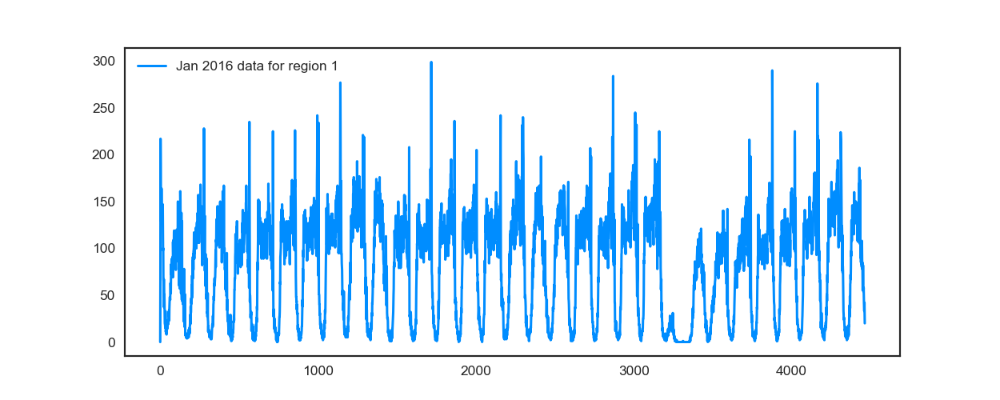

<IPython.core.display.Javascript object>


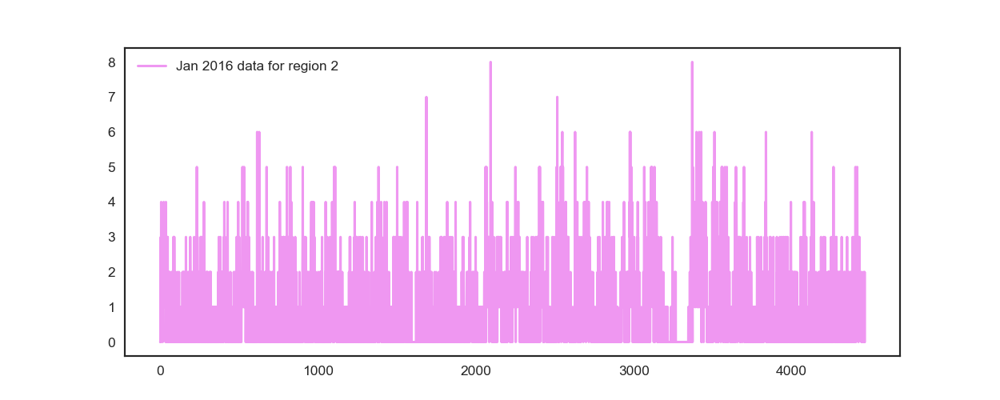

<IPython.core.display.Javascript object>


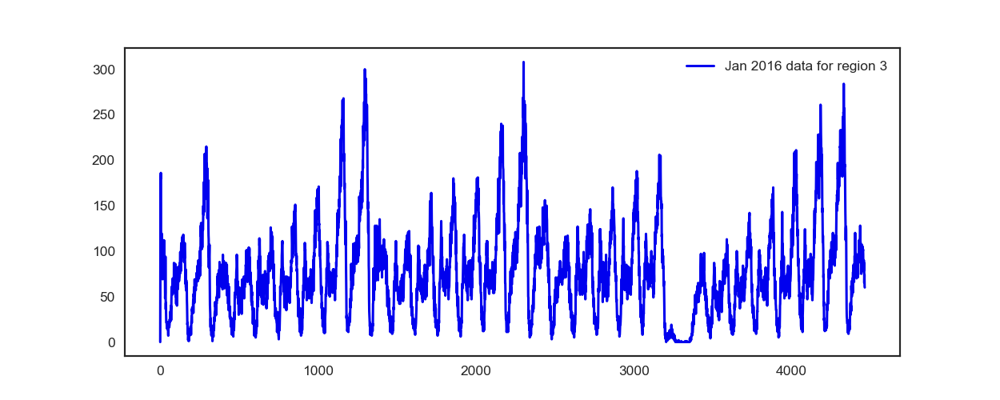

<IPython.core.display.Javascript object>


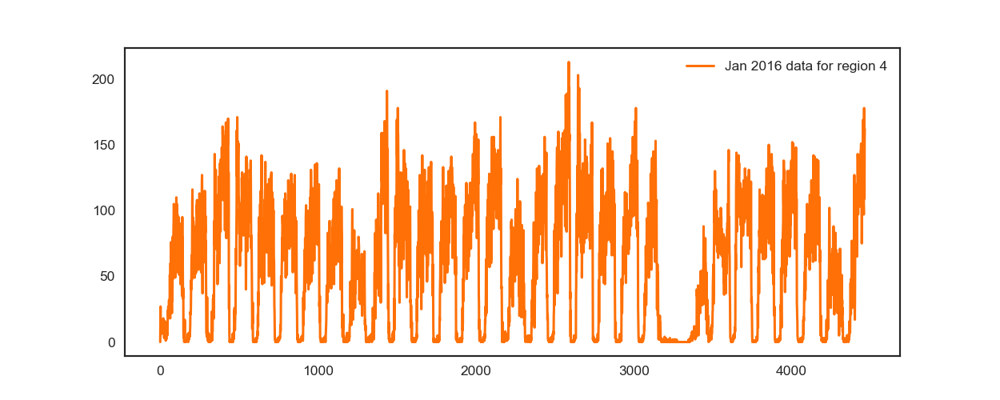

<IPython.core.display.Javascript object>


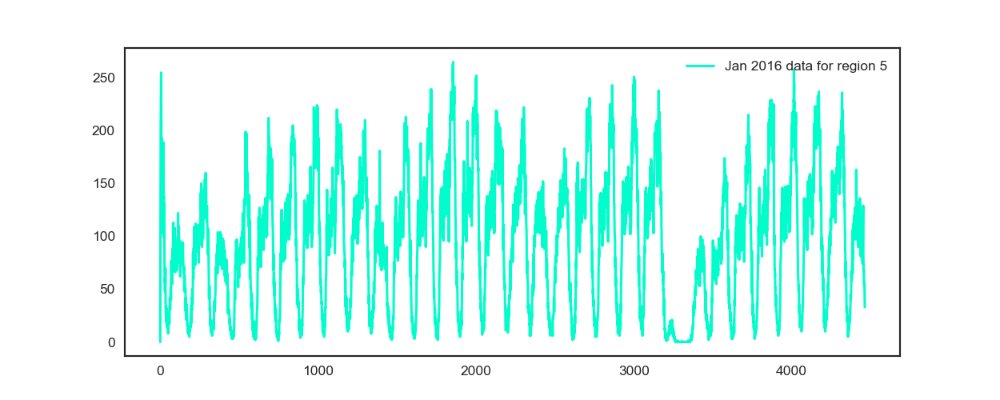

<IPython.core.display.Javascript object>


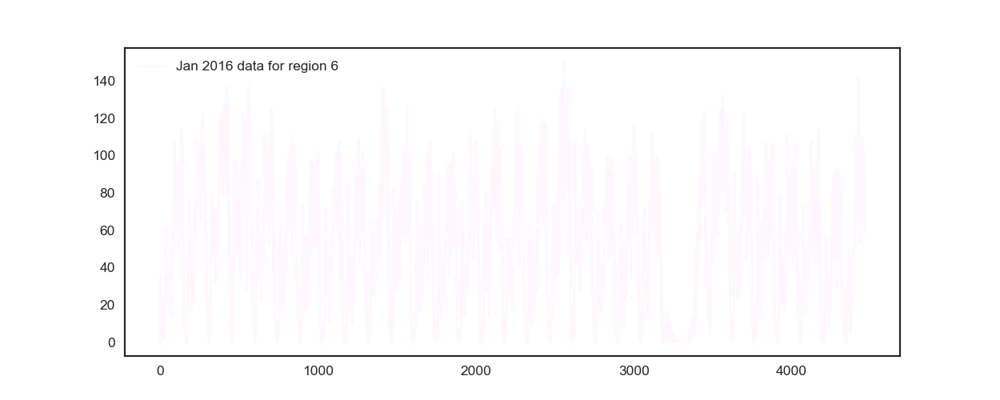

<IPython.core.display.Javascript object>


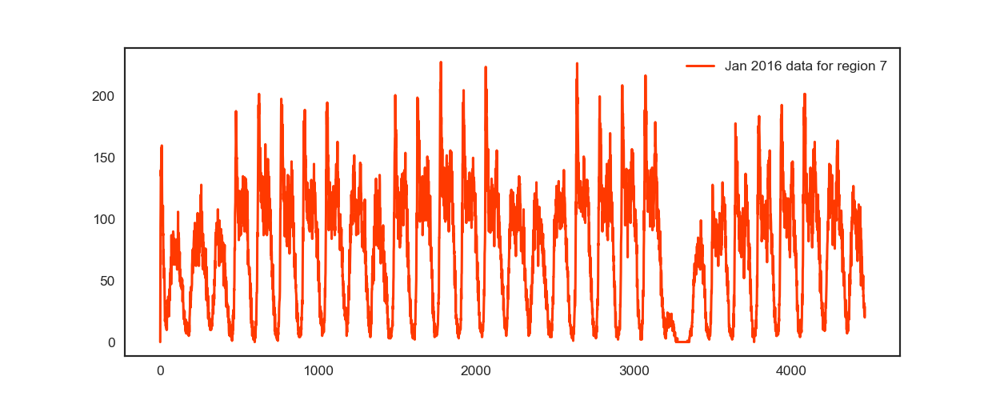

<IPython.core.display.Javascript object>


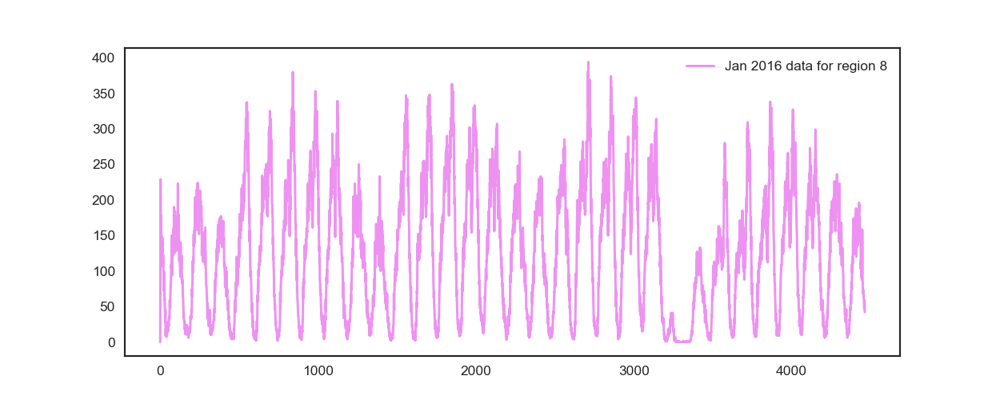

<IPython.core.display.Javascript object>


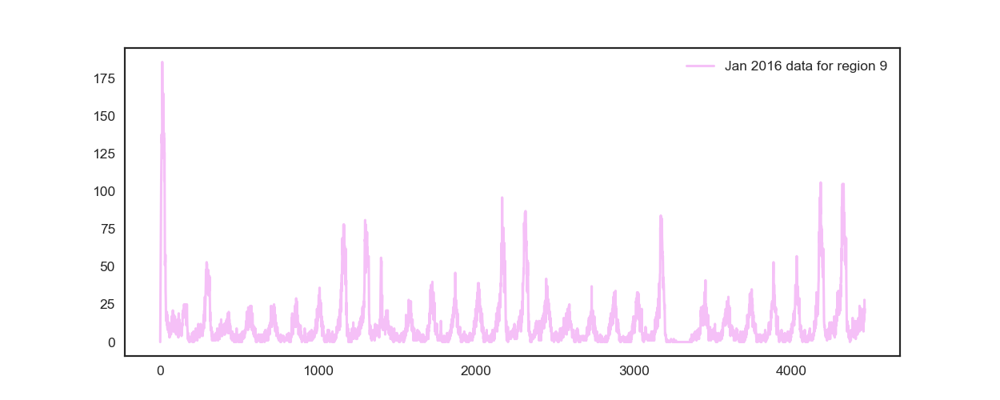

<IPython.core.display.Javascript object>


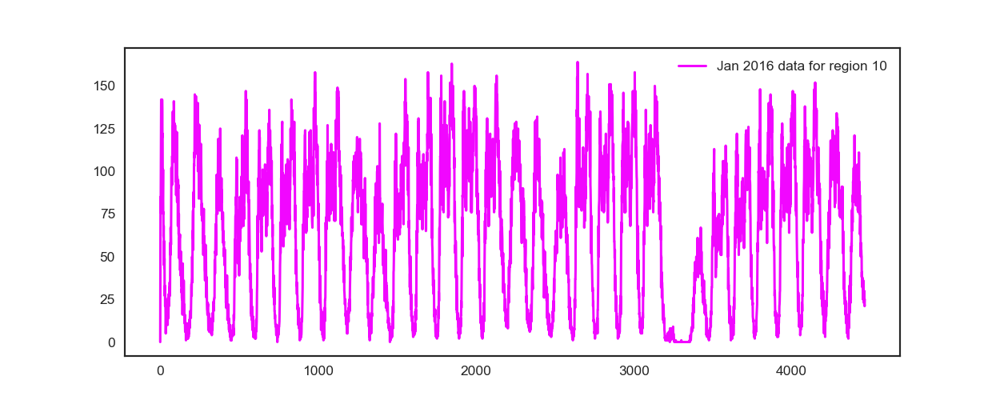

<IPython.core.display.Javascript object>


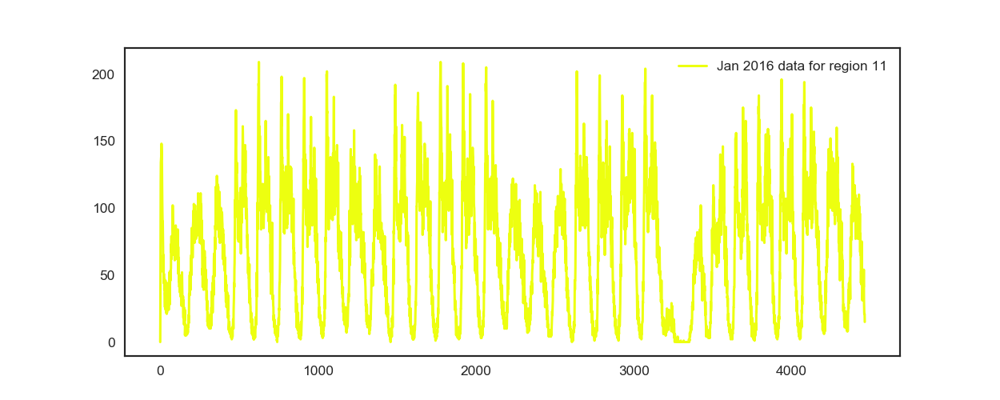

<IPython.core.display.Javascript object>


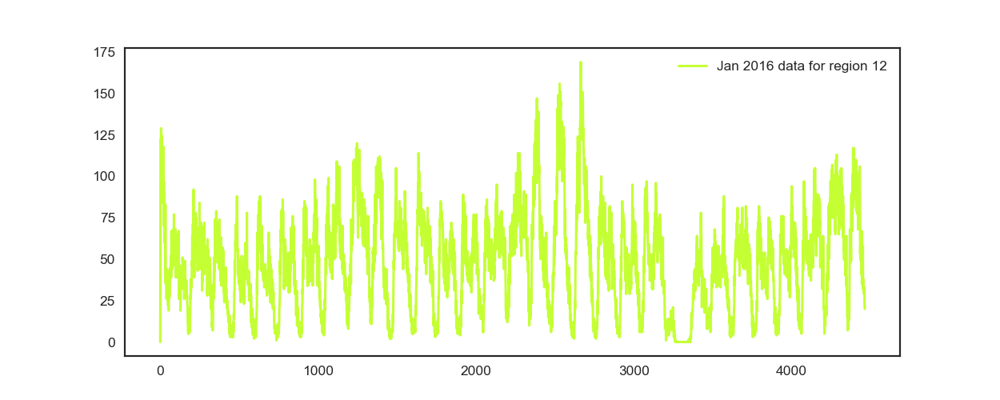

<IPython.core.display.Javascript object>


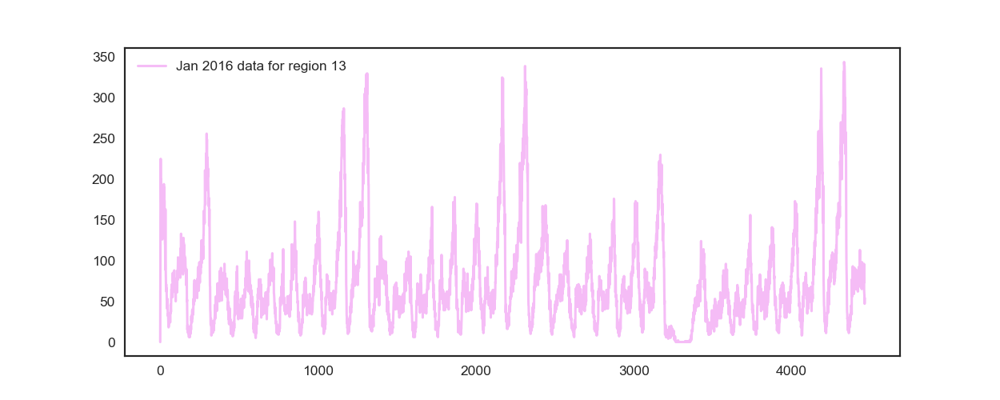

<IPython.core.display.Javascript object>


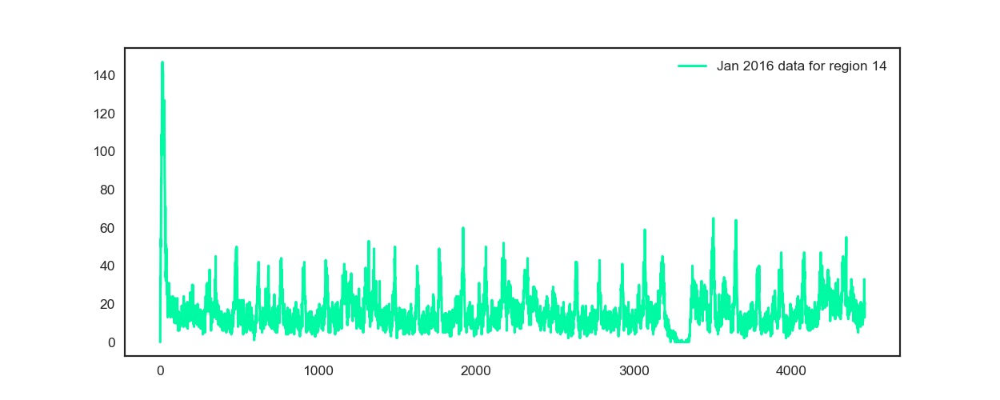

<IPython.core.display.Javascript object>


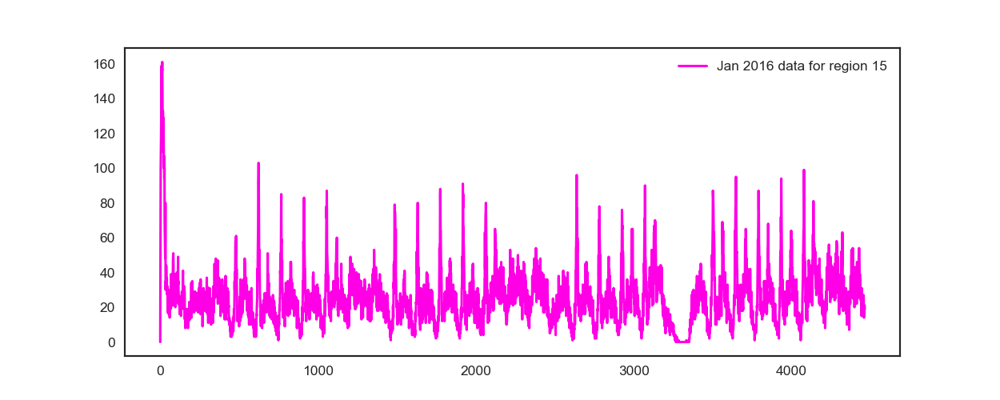

<IPython.core.display.Javascript object>


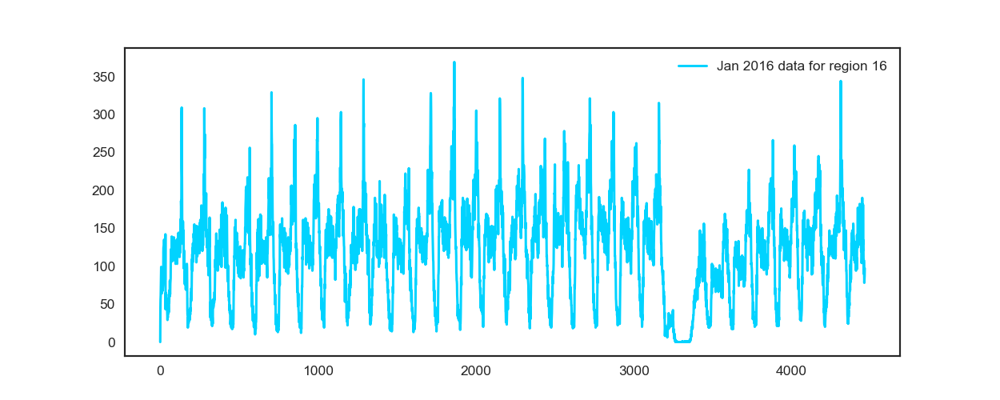

<IPython.core.display.Javascript object>


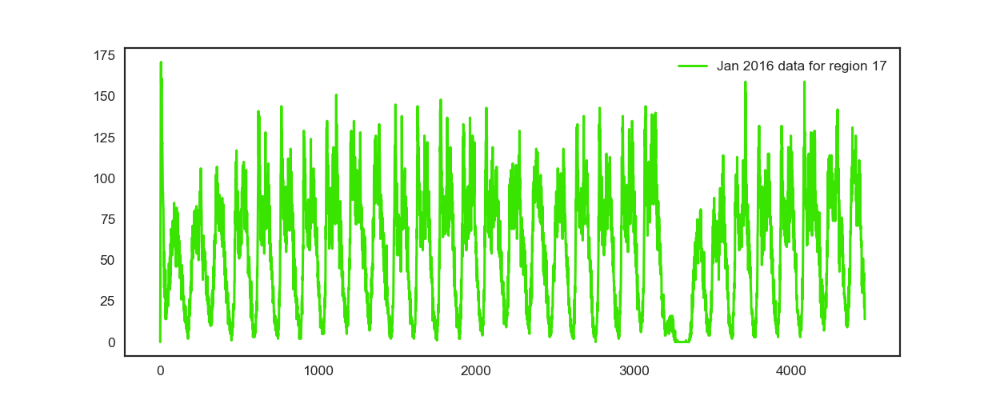

<IPython.core.display.Javascript object>


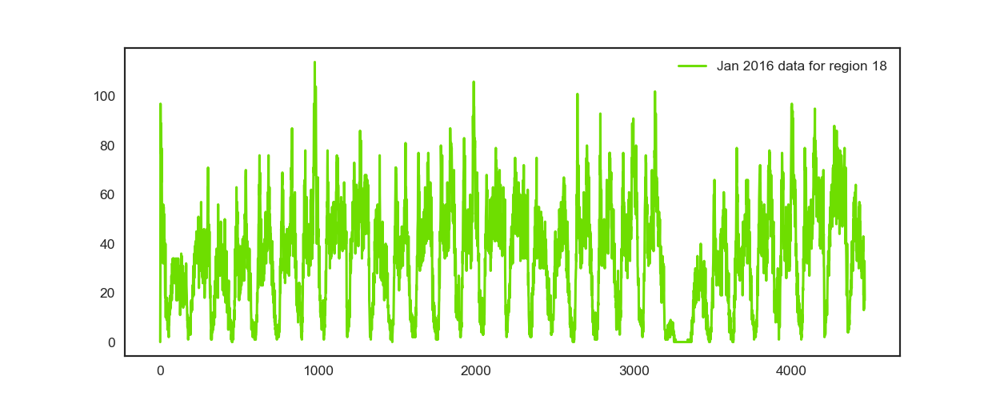

<IPython.core.display.Javascript object>


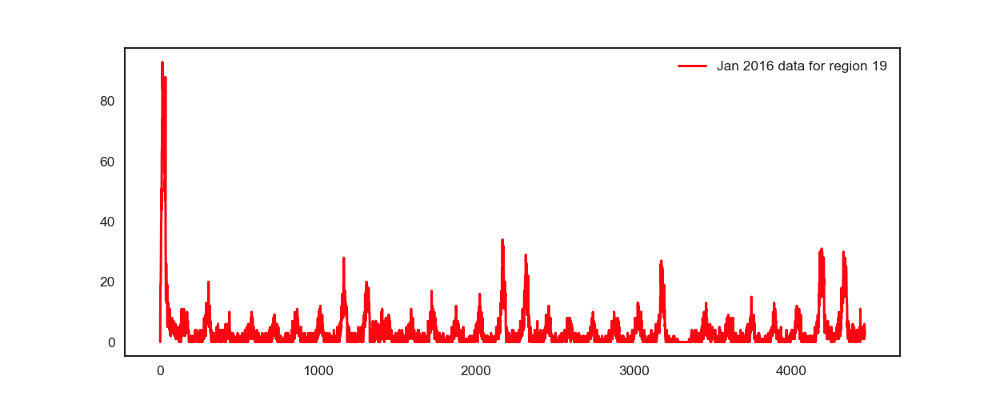

<IPython.core.display.Javascript object>


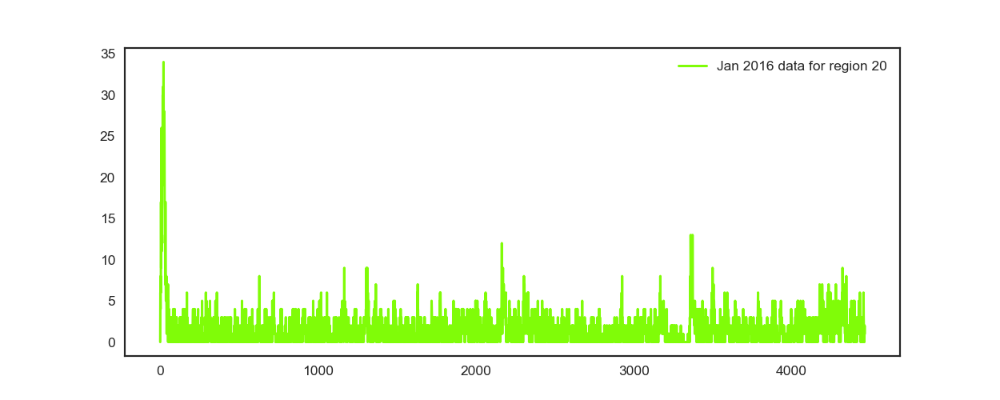

<IPython.core.display.Javascript object>


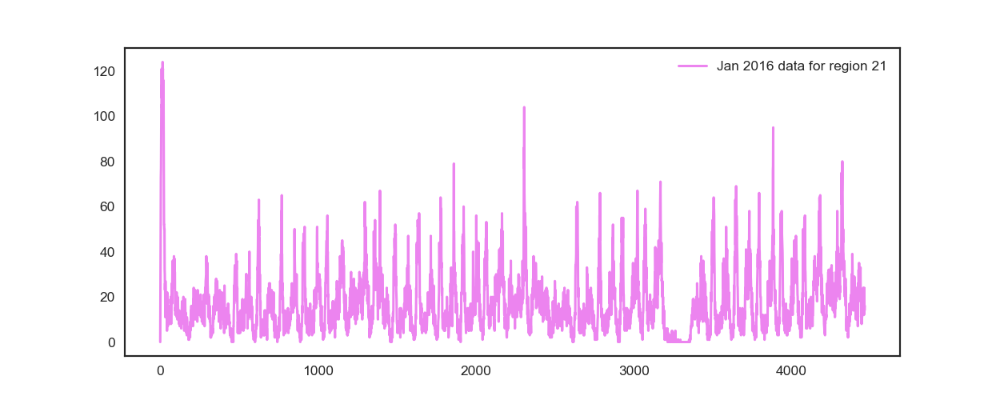

<IPython.core.display.Javascript object>


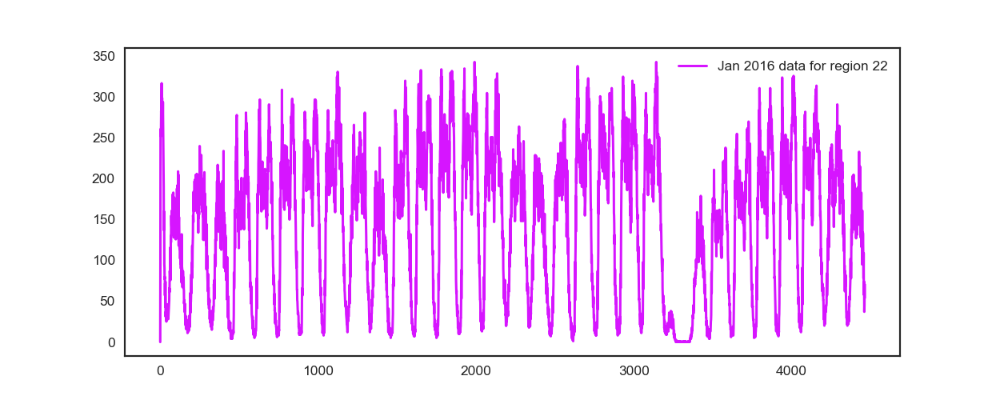

<IPython.core.display.Javascript object>


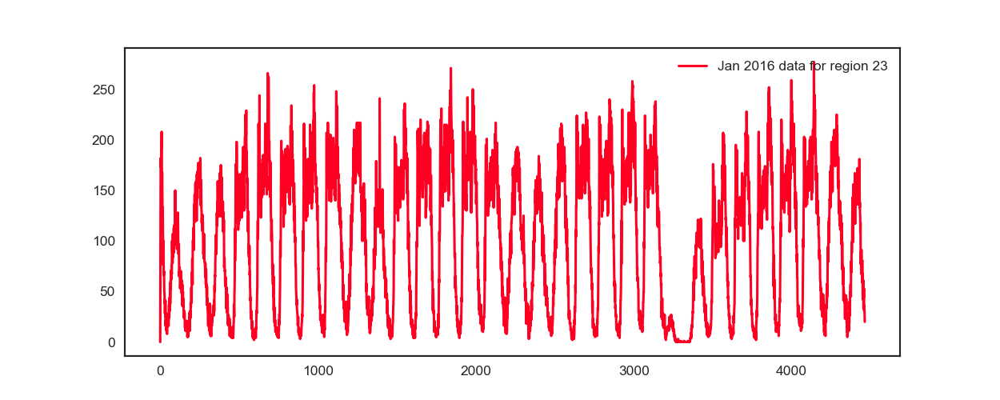

<IPython.core.display.Javascript object>


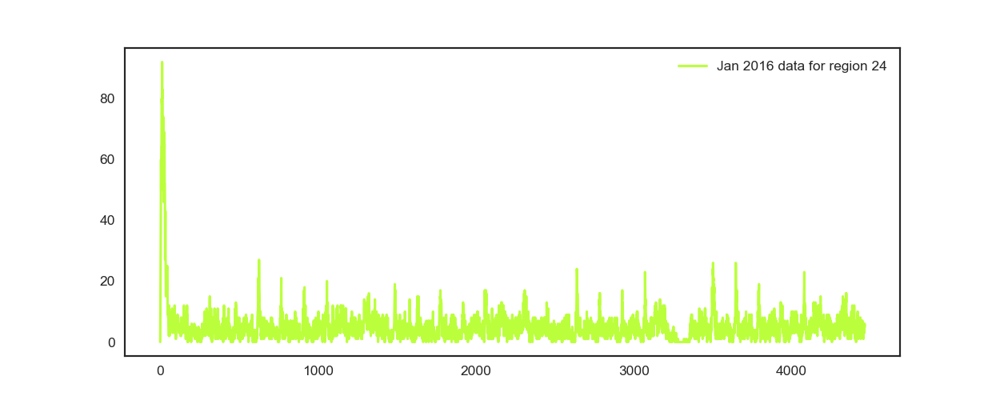

<IPython.core.display.Javascript object>


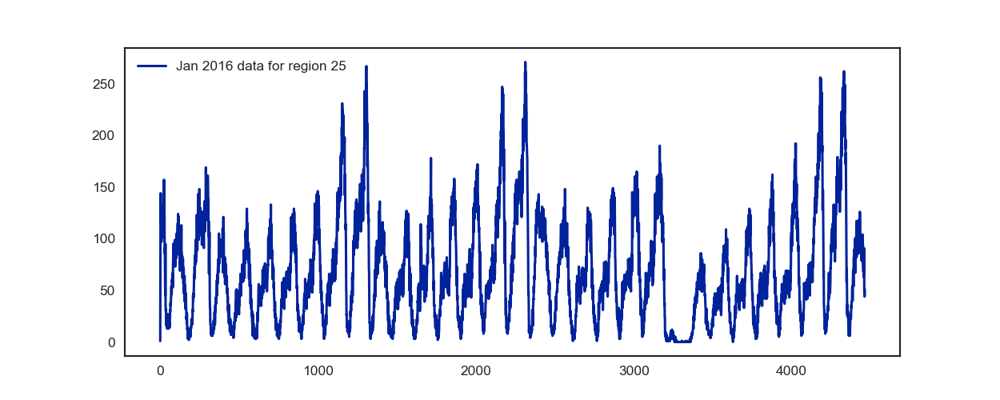

<IPython.core.display.Javascript object>


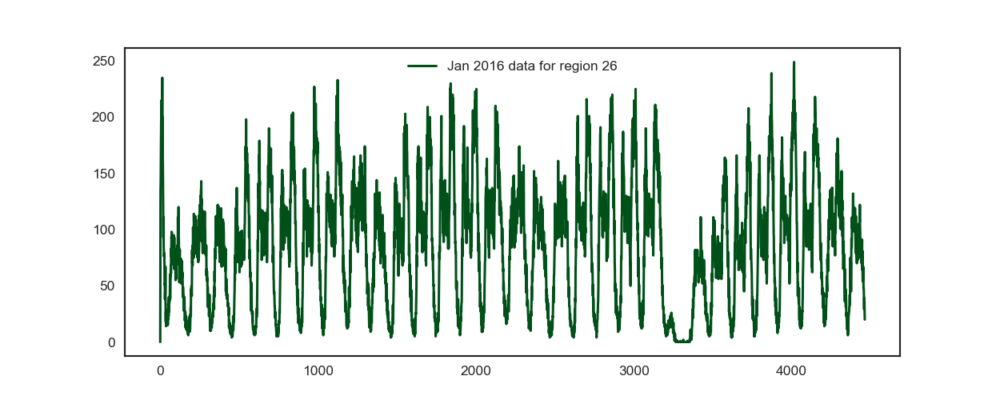

<IPython.core.display.Javascript object>


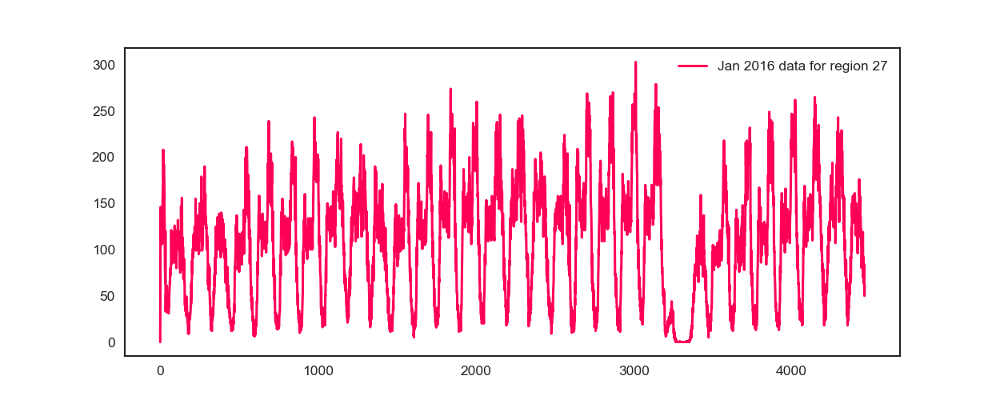

<IPython.core.display.Javascript object>


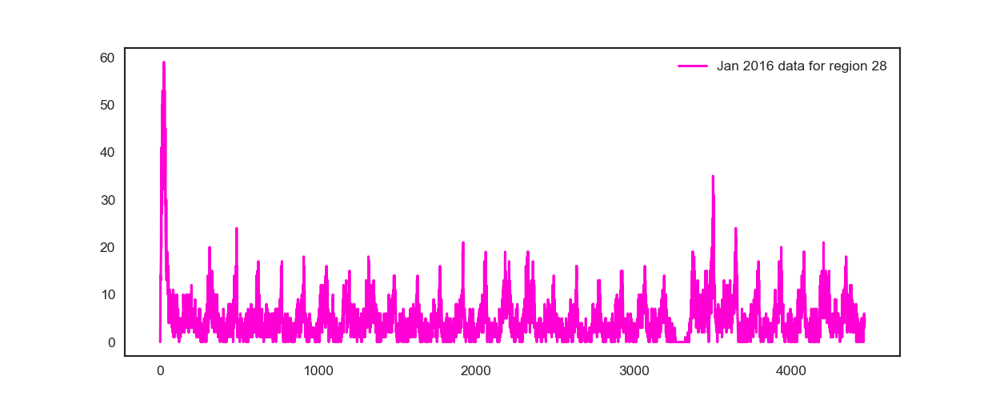

<IPython.core.display.Javascript object>


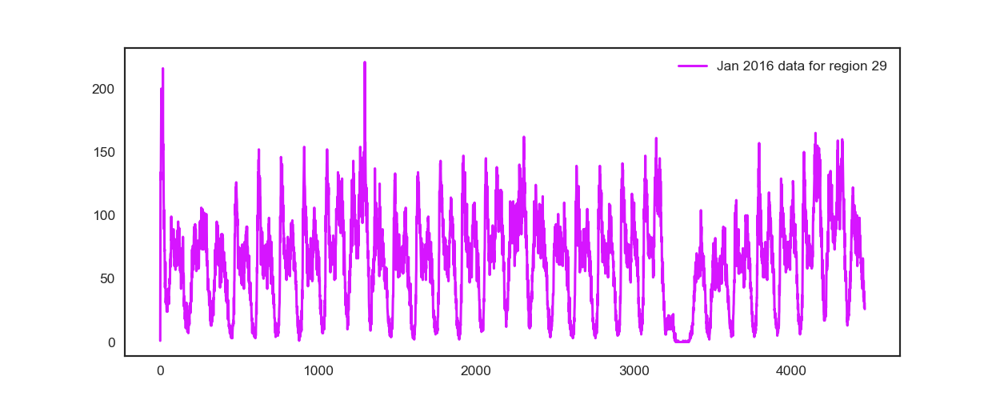

<IPython.core.display.Javascript object>


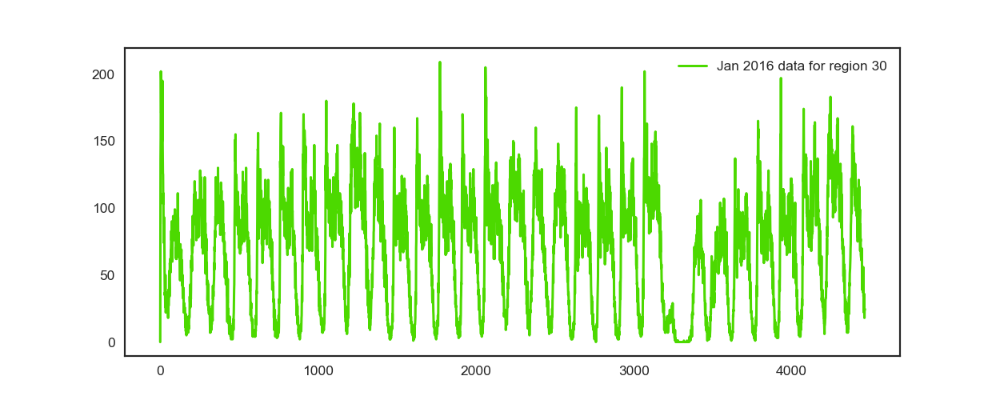

<IPython.core.display.Javascript object>


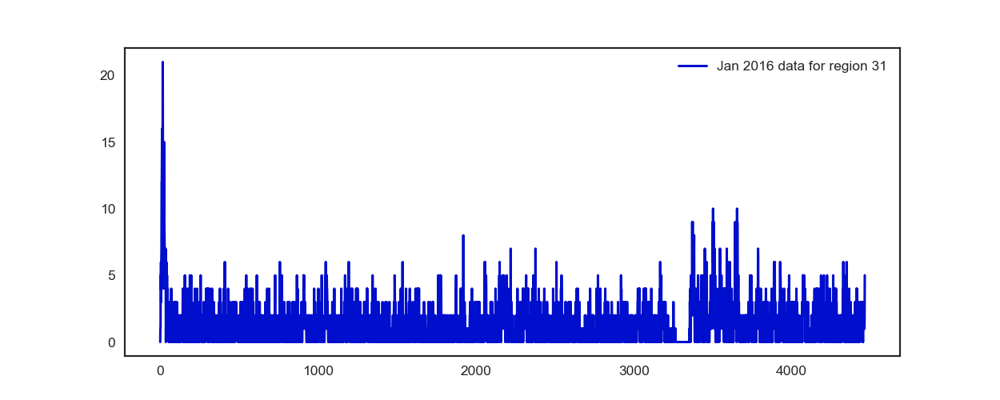

<IPython.core.display.Javascript object>


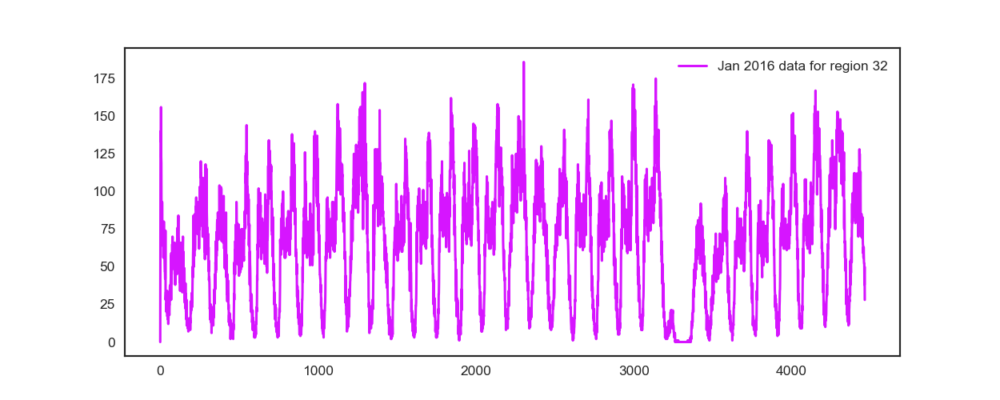

<IPython.core.display.Javascript object>


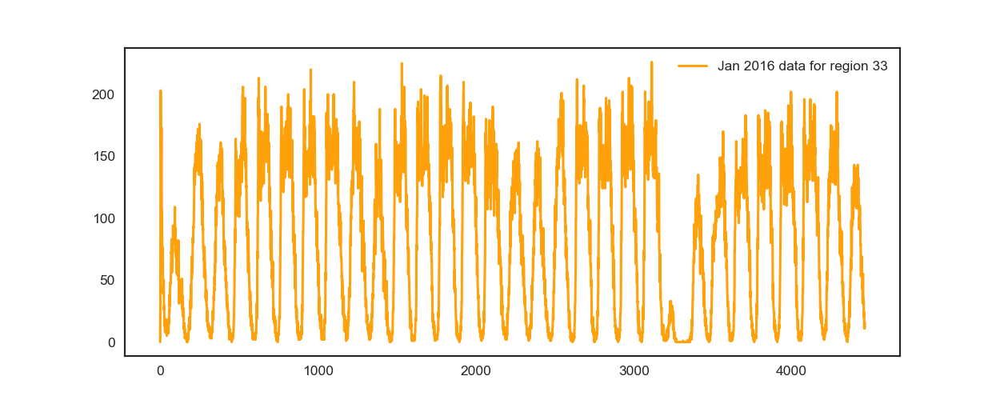

<IPython.core.display.Javascript object>


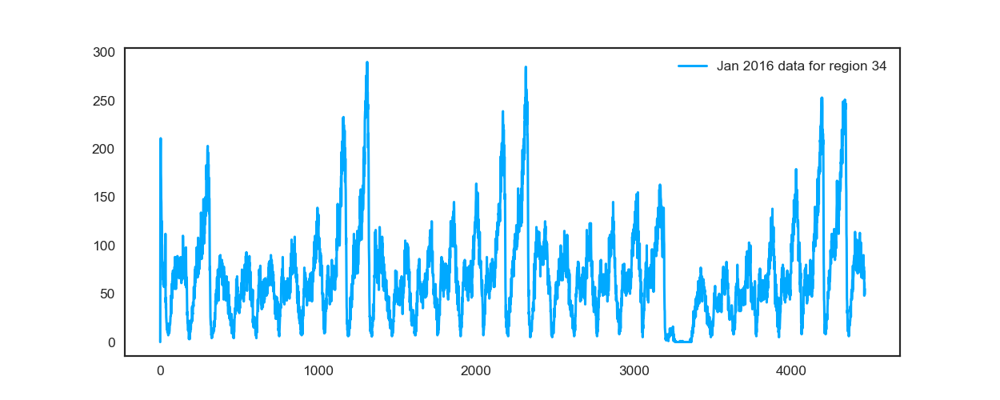

<IPython.core.display.Javascript object>


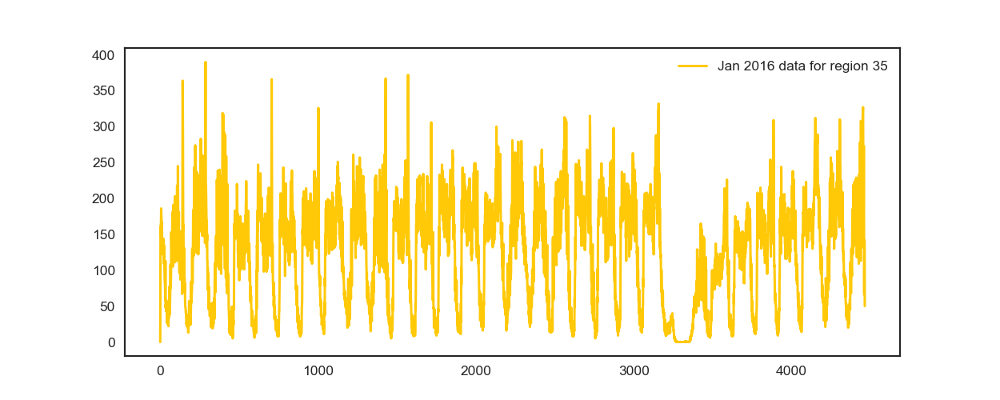

<IPython.core.display.Javascript object>


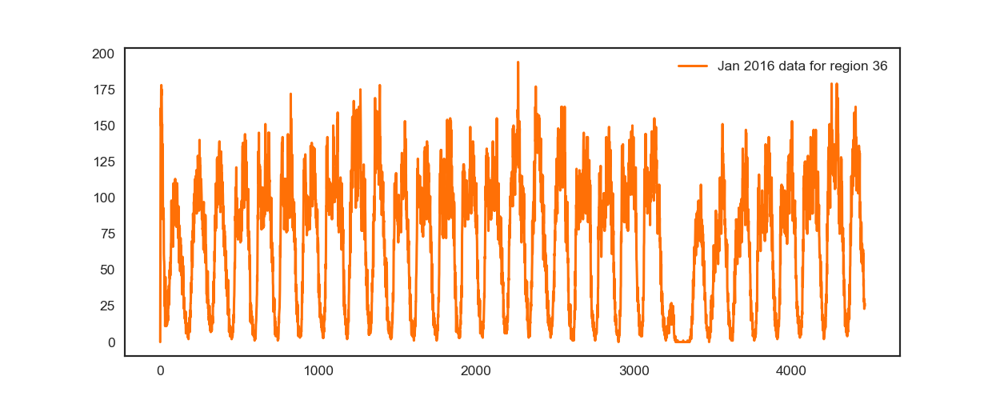

<IPython.core.display.Javascript object>


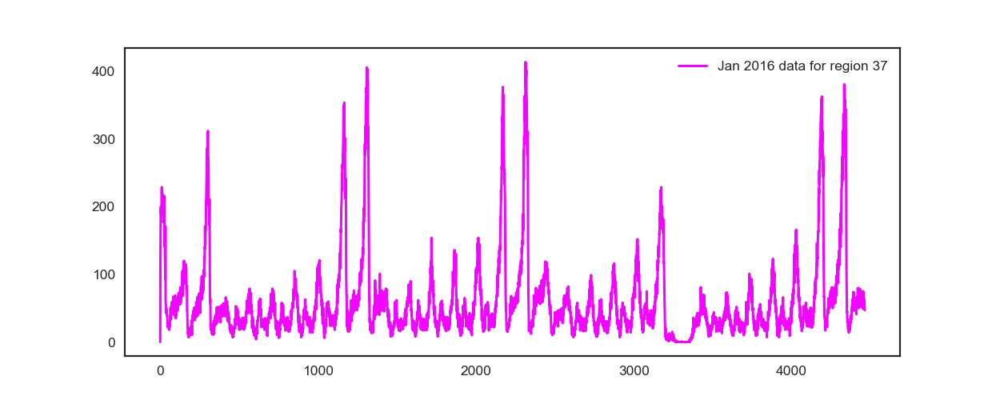

<IPython.core.display.Javascript object>


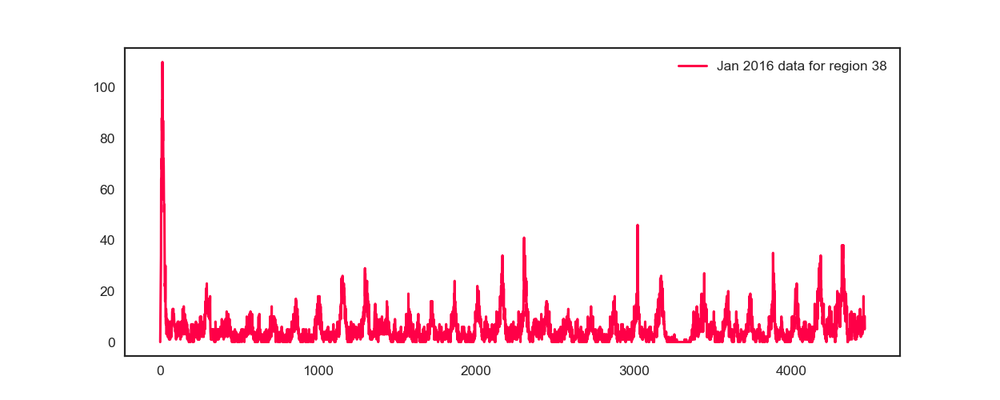

<IPython.core.display.Javascript object>


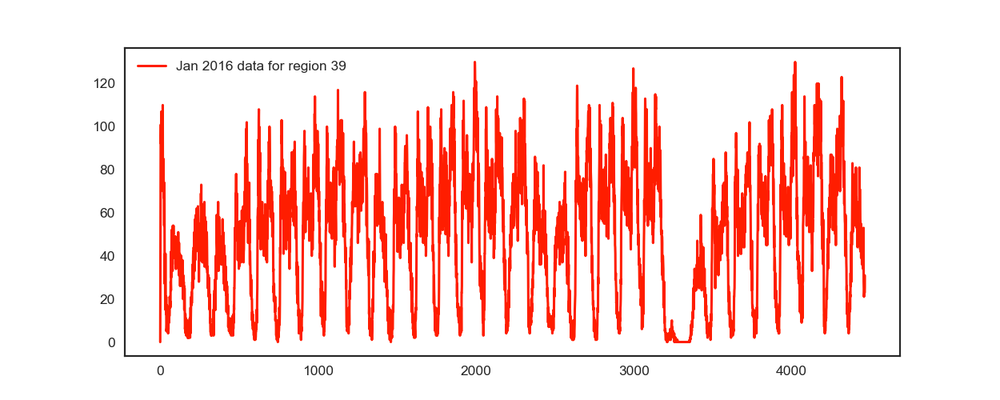

<IPython.core.display.Javascript object>


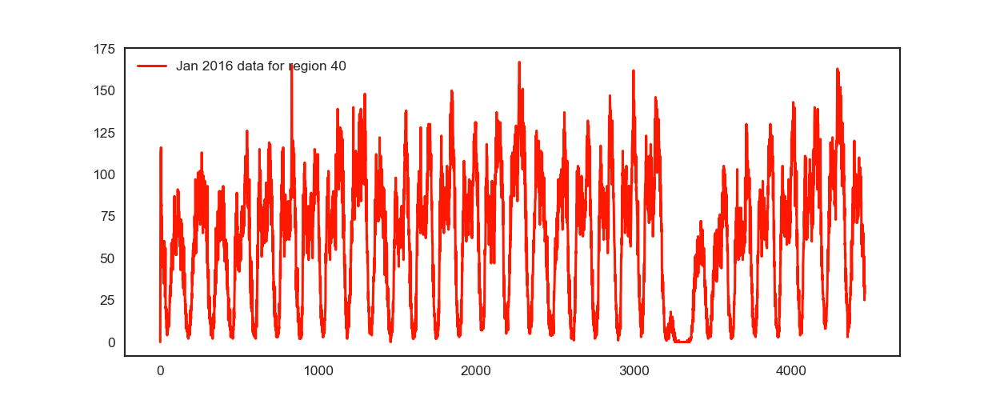

In [71]:
# %matplotlib inline
sns.set_style('white')
def uniqueish_color():
    # Generating Random Unique colors
    return plt.cm.gist_ncar(np.random.random())
first_x = list(range(0,4464))
# second_x = list(range(4464,8640))
# third_x = list(range(8640,13104))
for i in range(40):
    plt.figure(figsize=(10,4))
    plt.plot(first_x,regionwise_jan2016_pickups[i][:4464], color=uniqueish_color(), 
             label='Jan 2016 data for region '+str(i+1))
#     plt.plot(second_x,regions_cum[i][4464:8640], color=uniqueish_color(), label='2016 feb month data')
#     plt.plot(third_x,regions_cum[i][8640:], color=uniqueish_color(), label='2016 march month data')
    plt.legend()
    plt.show()

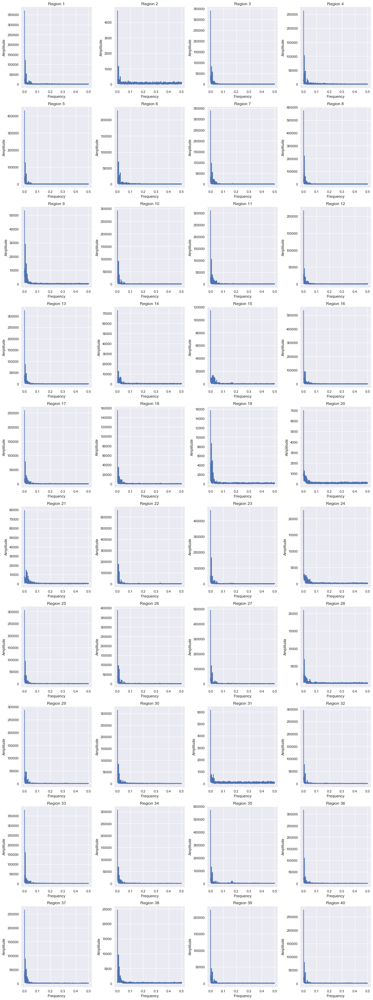

In [28]:
# getting peaks: https://blog.ytotech.com/2015/11/01/findpeaks-in-python/
# read more about fft function : https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fft.html
# https://github.com/gauravtheP/Taxi-Demand-Prediction-New-York-City/blob/master/Taxi-Demand-Prediction-NYC.ipynb

%matplotlib inline
# matplotlib.use('nbagg')
amp_list = []; freq_list = []
plt.figure(figsize=(15, 40))
for i in range(40):
    Y    = np.abs(np.fft.fft(regionwise_jan2016_pickups[i][0:4459]))
    # read more about the fftfreq: https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fftfreq.html  
    freq = np.abs(np.fft.fftfreq(4459, 1))
    n = len(freq)
    plt.subplot(10, 4, i+1)
    plt.plot(freq, Y)
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude")
    plt.title("Region "+str(i+1))
    top_amps = []; top_freqs = []
    # Sorting amplitudes in descending order and skipping 0th index as it represents DC component
    top_amp_indices = np.argsort(-Y)[1:]
    
    # Taking top 3 amplitudes and the respective frequencies
    # Skipping every alternate index as abs value of frequencies are same for every 2 adjacent indices
    for j in range(0, 5, 2):
        top_amps.append(Y[top_amp_indices[j]])
        top_freqs.append(freq[top_amp_indices[j]])
    
    # Adding same top 5 freqs and aplitudes for all but 5 time bins in each cluster
    for k in range(4459):
        amp_list.append(top_amps)
        freq_list.append(top_freqs)
plt.tight_layout()
plt.show()

In [29]:
len(freq_list) == len(amp_list) == 40*4459

True

In [30]:
len(freq_list[0]), len(amp_list[0])

(3, 3)

In [31]:
amp_features_train = [amp_list[i*4459:i*4459+3121] for i in range(40)]
amp_features_test = [amp_list[i*4459+3121:(i+1)*4459] for i in range(40)]

freq_features_train = [freq_list[i*4459:i*4459+3121] for i in range(40)]
freq_features_test = [freq_list[i*4459+3121:(i+1)*4459] for i in range(40)]

In [23]:
print("Number of data clusters: ",len(train_features), ";Number of data points in trian data: ", len(train_features[0]), 
      ";Each data point contains", len(train_features[0][0]),"features")
print("Number of data clusters: ",len(train_features), ";Number of data points in test data: ", len(test_features[0]), 
      ";Each data point contains", len(test_features[0][0]),"features")

NameError: name 'train_features' is not defined

In [32]:
# the above contains values in the form of list of lists (i.e. list of values of each region), 
# here we make all of them in one list
train_amp_new_features = []
train_freq_new_features = []
for i in range(0,40):
    train_amp_new_features.extend(amp_features_train[i])
    train_freq_new_features.extend(freq_features_train[i])

test_amp_new_features = []
test_freq_new_features = []
for i in range(0,40):
    test_amp_new_features.extend(amp_features_test[i])
    test_freq_new_features.extend(freq_features_test[i])

In [25]:
print(len(train_new_features) ==  len(train_amp_new_features) == len(train_freq_new_features) == 3121*40)
print(len(test_new_features) == len(test_amp_new_features)== len(test_freq_new_features) == 1338*40)

NameError: name 'train_new_features' is not defined

In [33]:
# Preparing the data frame for our train data
columns_amp = ['amp1', 'amp2', 'amp3']
columns_freq = ['freq1', 'freq2', 'freq3']
df_train = pd.concat([df_train,
                      pd.DataFrame(data=train_amp_new_features, columns=columns_amp),
                      pd.DataFrame(data=train_freq_new_features, columns=columns_freq)], axis=1)
df_train.to_csv('df_train_fourier.csv')
print(df_train.shape)
df_train.head()

(124840, 34)


,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,DoubleExpForecast,6hrMeans,...,Std_24hr,Kurtosis_24hr,Skew_24hr,IQR_24hr,amp1,amp2,amp3,freq1,freq2,freq3
0,0,63,217,189,137,40.776228,-73.982119,4,298,0,...,0.0,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007
1,63,217,189,137,135,40.776228,-73.982119,4,318,0,...,0.0,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007
2,217,189,137,135,129,40.776228,-73.982119,4,321,0,...,0.0,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007
3,189,137,135,129,150,40.776228,-73.982119,4,309,0,...,0.0,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007
4,137,135,129,150,164,40.776228,-73.982119,4,284,0,...,0.0,0.0,0.0,0.0,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007


In [34]:
# Preparing the data frame for our train data
df_test = pd.concat([df_test, 
                     pd.DataFrame(data=test_amp_new_features, columns=columns_amp), 
                     pd.DataFrame(data=test_freq_new_features, columns=columns_freq)], axis=1)
df_test.to_csv('df_test_fourier.csv')
print(df_test.shape)
df_test.head()

(53520, 34)


,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,DoubleExpForecast,6hrMeans,...,Std_24hr,Kurtosis_24hr,Skew_24hr,IQR_24hr,amp1,amp2,amp3,freq1,freq2,freq3
0,119,121,126,115,104,40.776228,-73.982119,4,105,129,...,56.948398,-0.779888,-0.444793,101.75,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007
1,121,126,115,104,142,40.776228,-73.982119,4,103,130,...,57.023577,-0.785690,-0.448206,102.50,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007
2,126,115,104,142,141,40.776228,-73.982119,4,104,130,...,57.095868,-0.791142,-0.451833,102.50,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007
3,115,104,142,141,135,40.776228,-73.982119,4,109,131,...,57.138649,-0.794268,-0.454530,102.50,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007
4,104,142,141,135,146,40.776228,-73.982119,4,119,131,...,57.115955,-0.792662,-0.454573,102.50,121349.296301,52702.45119,27905.80522,0.006952,0.013904,0.013007


In [295]:
# df_test = pd.read_csv("df_test.csv")
# if df_test.columns.contains("Unnamed: 0"):
#     df_test.drop(["Unnamed: 0"], axis=1, inplace=True)
# df_test.columns

### Calculating the error metric values for various models after adding FFT features

In [119]:
lr_train_MAPE, lr_train_MSE, lr_test_MAPE, lr_test_MSE = linear_reg(df_train, train_output, df_test, test_output)
print(lr_train_MSE, lr_test_MSE, lr_train_MAPE*100, lr_test_MAPE*100)

SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False)
{'alpha': 0.0001}
166.70796219160525 190.3493086696562 13.553239545982487 19.140873225782585


In [121]:
rf_train_MAPE, rf_train_MSE, rf_test_MAPE, rf_test_MSE = randomForest_reg(df_train, train_output, df_test, test_output)
print(rf_train_MSE, rf_test_MSE, rf_train_MAPE*100, rf_test_MAPE*100)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   29.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:  5.8min remaining:  3.4min
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:  7.5min remaining:  2.3min
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:  8.1min remaining:   54.1s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  8.4min finished


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=700,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
                      oob_score=False, random_state=None, verbose=0,
                      warm_start=False)
{'max_depth': 700, 'n_estimators': 500}
21.957081063761613 129.82574738415545 4.888965930508027 13.635518161030175


In [122]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
145.5937199615508 124.52767189835575 12.851710681019782 13.296595701427394


In [123]:
train_mape_fourier=[]
test_mape_fourier=[]

train_mape_fourier.append((mean_absolute_error(train_output,df_train['ft_1'].values))/(sum(train_output)/len(train_output)))
train_mape_fourier.append((mean_absolute_error(train_output,df_train['exp_avg'].values))/(sum(train_output)/len(train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output,rndf_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output, xgb_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output, lr_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape_fourier.append(rf_train_MAPE)
train_mape_fourier.append(lr_train_MAPE)
train_mape_fourier.append(xgb_train_MAPE)

test_mape_fourier.append((mean_absolute_error(test_output, df_test['ft_1'].values))/(sum(test_output)/len(test_output)))
test_mape_fourier.append((mean_absolute_error(test_output, df_test['exp_avg'].values))/(sum(test_output)/len(test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, rndf_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, xgb_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, lr_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape_fourier.append(rf_test_MAPE)
test_mape_fourier.append(lr_test_MAPE)
test_mape_fourier.append(xgb_test_MAPE)

### Error Metric Matrix

In [124]:
print ("--------------------------------------------------------------------------------------------------------")
print ("Error Metric Matrix (Regression Methods with basic features) -  MAPE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Baseline Model -                             Train: ",train_mape_basic[0],"      Test: ",test_mape_basic[0])
print ("Exponential Averages Forecasting -           Train: ",train_mape_basic[1],"      Test: ",test_mape_basic[1])
print ("Linear Regression -                          Train: ",train_mape_basic[3],"       Test: ",test_mape_basic[3])
print ("Random Forest Regression -                   Train: ",train_mape_basic[2],"       Test: ",test_mape_basic[2])
print ("XGBoost Regression -                         Train: ",train_mape_basic[4],"      Test: ", test_mape_basic[4])
print ("--------------------------------------------------------------------------------------------------------")
print ("Error Metric Matrix (Regression Methods with basic + FFT features) -  MAPE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Baseline Model -                             Train: ",train_mape_fourier[0],"      Test: ",test_mape_fourier[0])
print ("Exponential Averages Forecasting -           Train: ",train_mape_fourier[1],"      Test: ",test_mape_fourier[1])
print ("Linear Regression -                          Train: ",train_mape_fourier[3],"      Test: ",test_mape_fourier[3])
print ("Random Forest Regression -                   Train: ",train_mape_fourier[2],"     Test: ",test_mape_fourier[2])
print ("XGBoost Regression -                         Train: ",train_mape_fourier[4],"      Test: ", test_mape_fourier[4])

--------------------------------------------------------------------------------------------------------
Error Metric Matrix (Regression Methods with basic features) -  MAPE
--------------------------------------------------------------------------------------------------------
Baseline Model -                             Train:  0.14279568887218214       Test:  0.14173375623443768
Exponential Averages Forecasting -           Train:  0.13461451814687206       Test:  0.1330157426249878
Linear Regression -                          Train:  0.13522102612944423        Test:  0.19270004653571668
Random Forest Regression -                   Train:  0.049141689276001384        Test:  0.1363880262840366
XGBoost Regression -                         Train:  0.12896026924747434       Test:  0.1328504820560904
--------------------------------------------------------------------------------------------------------
Error Metric Matrix (Regression Methods with basic + FFT features) -  MAPE
-----------

## TsFresh

In [376]:
from tsfresh import extract_relevant_features
from tsfresh import extract_features

In [369]:
# cluster_id = [j for j in range(4459) for i in range(40)]
# len(cluster_id)
cluster_id = []
for i in range(40):
    for j in range(4459):
        cluster_id.append(str(i))
# len(cluster_id)
# cluster_id_train = sum([cluster_id[i*4459:i*4459+3121] for i in range(40)], [])
# cluster_id_test = sum([cluster_id[i*4459+3121:(i+1)*4459] for i in range(40)], [])
# print(len(cluster_id_train) == 40*3121)
# print(len(cluster_id_test) == 40*1338)
len(cluster_id)

178360

In [370]:
type(cluster_id[4459])

str

In [371]:
# timebins = sum([list(range(4464)) for i in range(40)], [])
# len(regionwise_jan2016_pickups[0])
pickups = sum([regionwise_jan2016_pickups[i][5:] for i in range(40)], [])
len(pickups) == len(cluster_id)
# len(regionwise_jan2016_pickups[0])

True

In [372]:
start = datetime.datetime(2016, 1, 1, 0, 50)
timebin_times = [start + datetime.timedelta(minutes = 10*i) for i in range(4459)]*40

In [381]:
print(timebin_times[0] == timebin_times[4459] == timebin_times[-4459])
print(timebin_times[-1] == timebin_times[4458])
print(len(timebin_times))

True
True
178360


In [374]:
df_pickups = pd.DataFrame({"ClusterID": cluster_id, "timebin": timebin_times, "Pickups": pickups})
# df_pickups.index = pd.DatetimeIndex(df_pickups["timebin_times"])
df_pickups.head()

,ClusterID,timebin,Pickups
0,0,2016-01-01 00:50:00,135
1,0,2016-01-01 01:00:00,129
2,0,2016-01-01 01:10:00,150
3,0,2016-01-01 01:20:00,164
4,0,2016-01-01 01:30:00,152


In [377]:
df_new = extract_features(df_pickups, column_id="ClusterID", column_value="Pickups")

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 20/20 [10:15<00:00, 26.97s/it]


In [382]:
# df_pickups = pd.DataFrame({"ClusterID": cluster_id, "timebin": timebins, "Pickups": pickups})
# df_pickups.tail()
from tsfresh.feature_extraction import extract_features
# TimeBasedFCParameters contains all functions that use the Datetime index of the timeseries container
# from tsfresh.feature_extraction.settings import TimeBasedFCParameters
import datetime
#settings_time = TimeBasedFCParameters()
#settings_time
start = datetime.datetime(2016, 1, 1, 0, 50)
timebin_times = [start + datetime.timedelta(minutes = 10*i) for i in range(4459)]

# len(x)
for i in range(1):
    df = pd.DataFrame({"ClusterID": cluster_id[i*4459:(i+1)*4459], "Pickups": pickups[i*4459:(i+1)*4459]}, 
                      index = pd.DatetimeIndex(timebin_times))
    #df.index = df["timebin_start"]
    df_new = extract_features(df, column_id="ClusterID")#, default_fc_parameters=settings_time)
# df.head(50)
df_new.head()

Feature Extraction: 100%|████████████████████████████████████████████████████████████████| 1/1 [00:47<00:00, 47.92s/it]


variable,Pickups__abs_energy,Pickups__absolute_sum_of_changes,"Pickups__agg_autocorrelation__f_agg_""mean""__maxlag_40","Pickups__agg_autocorrelation__f_agg_""median""__maxlag_40","Pickups__agg_autocorrelation__f_agg_""var""__maxlag_40","Pickups__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""intercept""","Pickups__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""rvalue""","Pickups__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""slope""","Pickups__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""stderr""","Pickups__agg_linear_trend__f_agg_""max""__chunk_len_50__attr_""intercept""",...,Pickups__symmetry_looking__r_0.9,Pickups__symmetry_looking__r_0.9500000000000001,Pickups__time_reversal_asymmetry_statistic__lag_1,Pickups__time_reversal_asymmetry_statistic__lag_2,Pickups__time_reversal_asymmetry_statistic__lag_3,Pickups__value_count__value_-1,Pickups__value_count__value_0,Pickups__value_count__value_1,Pickups__variance,Pickups__variance_larger_than_standard_deviation
id,,,,,,,,,,,,,,,,,,,,,
0,43601110.0,54363.0,0.40348,0.430072,0.109471,112.699792,-0.022575,-0.011358,0.023871,168.901587,...,1.0,1.0,-1597.9733,-150.611448,2573.49068,0.0,86.0,33.0,2923.767537,1.0


In [414]:
from tsfresh.feature_extraction import extract_features
# TimeBasedFCParameters contains all functions that use the Datetime index of the timeseries container
# from tsfresh.feature_extraction.settings import TimeBasedFCParameters
import datetime
#settings_time = TimeBasedFCParameters()
#settings_time
start = datetime.datetime(2016, 1, 1, 0, 50)
timebin_times = [start + datetime.timedelta(minutes = 10*i) for i in range(4459)]

df_all_train = None; df_all_test = None
for i in range(40):
    df = pd.DataFrame({"StartTime": timebin_times, "Pickups": pickups[i*4459:(i+1)*4459]}, columns=["StartTime", "Pickups"])
    df.index = df['StartTime']
    #print(df.index)
#                       index = pd.DatetimeIndex(timebin_times))
    #df.index = df["timebin_start"]
    df_new = extract_features(df, column_id="StartTime", column_value="Pickups")#, default_fc_parameters=settings_time)
    if i==0:
        df_all_train = df_new.iloc[:-1338]
        df_all_test = df_new.iloc[-1338:]
    else:
        df_all_train = pd.concat([df_all_train, df_new.iloc[:-1338]], axis=0)
        df_all_test = pd.concat([df_all_test, df_new.iloc[-1338:]], axis=0)
# df.head(50)
#df_new.head()

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 20/20 [01:15<00:00,  2.35s/it]


In [467]:
print(df_all_train.iloc[-1, 0])
#pickups[3121]
print(df_new.iloc[-1339, 0])
print(pickups[(i+1)*4459 - 1339])

5776.0
5776.0
76


In [473]:
# energy_train = [pickups[]]
# len(pickups)
sum([pickups[i*4459:i*4459+3121] for i in range(40)], []) == train_output
# len(train_output)

True

In [428]:
# df_all_train.dropna(axis=1, how='all', inplace=True)
print(df_all_train.shape)
# df_all_test.dropna(axis=1, how='all', inplace=True)
print(df_all_test.shape)

(124840, 246)
(53520, 246)


In [441]:
# df_all_train.iloc[:, :1].head()
df_all_train.reset_index(inplace=True, drop=True)
df_all_test.reset_index(inplace=True, drop=True)

In [443]:
df_train = pd.concat([df_train, df_all_train.iloc[:, 0]], axis=1)
df_test = pd.concat([df_test, df_all_test.iloc[:, 0]], axis=1)
# print(df_train.shape)
# print(df_test.shape)
# type(df_all_train)
# df_all_train.head()
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'Last5Means',
       '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'trend',
       'yhat_lower', 'yhat_upper', 'daily', 'weekly', 'yhat',
       'Pickups__abs_energy'],
      dtype='object')

In [444]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=1, gamma=1.0, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=777, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.3843817072926998, verbose=10)
{'colsample_bytree': 1, 'gamma': 1.0, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 777, 'subsample': 0.3843817072926998}
0.001081384171739827 9.342301943198804e-05 0.0004025208190909133 0.00017286670386758133


In [99]:
# timebins = sum([list(range(4459)) for i in range(40)], [])
# timebin_train = sum([timebins[i*4459:i*4459+3121] for i in range(40)], [])
# timebin_test = sum([timebins[i*4459+3121:(i+1)*4459] for i in range(40)], [])
# print(len(timebin_train) == 40*3121)
# print(len(timebin_test) == 40*1338)

## Double Exponential Smoothing

Optimal alpha: 0.1, Optimal Gamma: 0.9


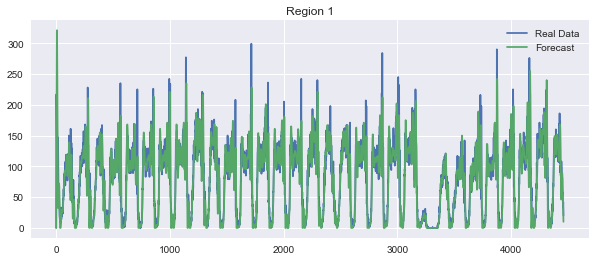

Optimal alpha: 0.1, Optimal Gamma: 0.9


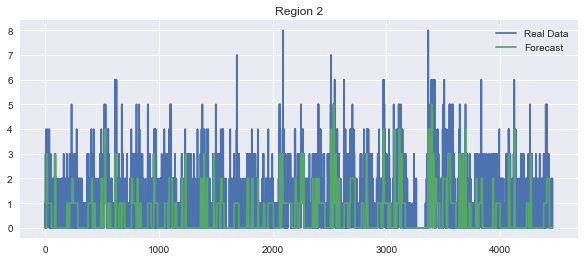

Optimal alpha: 0.1, Optimal Gamma: 0.9


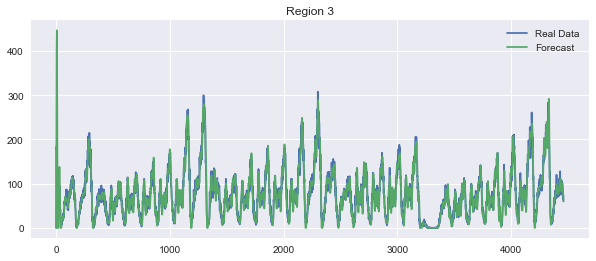

Optimal alpha: 0.1, Optimal Gamma: 0.9


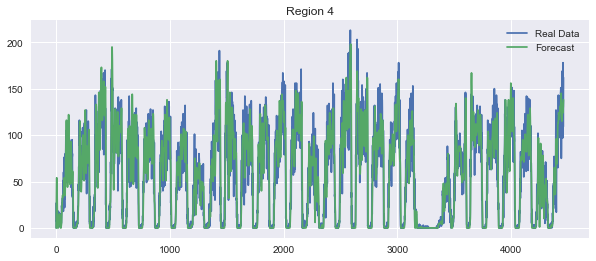

Optimal alpha: 0.1, Optimal Gamma: 0.9


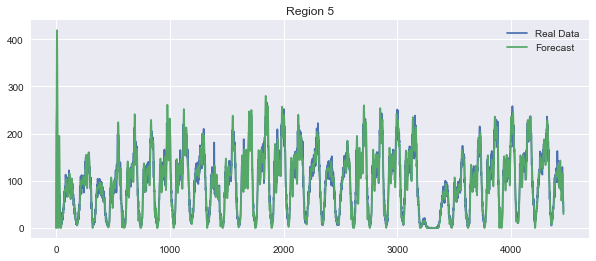

Optimal alpha: 0.1, Optimal Gamma: 0.9


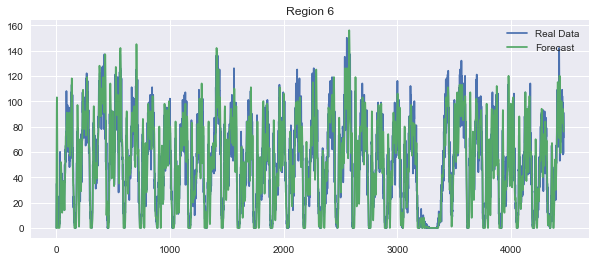

Optimal alpha: 0.1, Optimal Gamma: 0.9


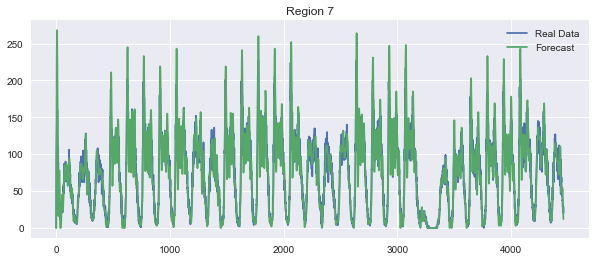

Optimal alpha: 0.1, Optimal Gamma: 0.9


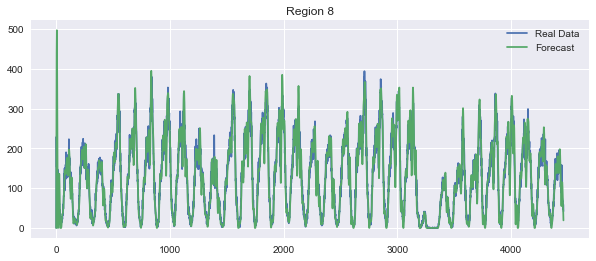

Optimal alpha: 0.1, Optimal Gamma: 0.9


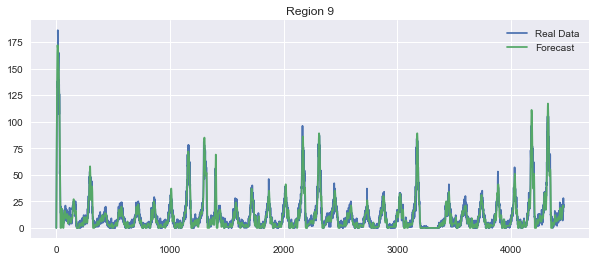

Optimal alpha: 0.1, Optimal Gamma: 0.9


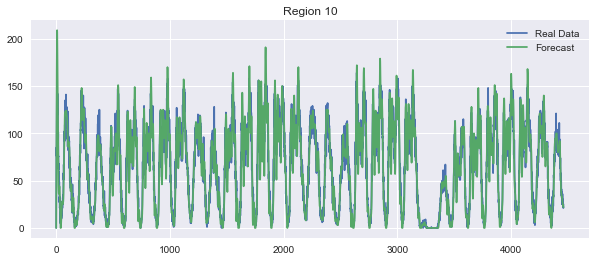

Optimal alpha: 0.1, Optimal Gamma: 0.9


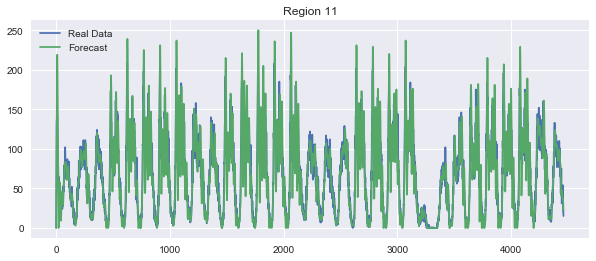

Optimal alpha: 0.1, Optimal Gamma: 0.9


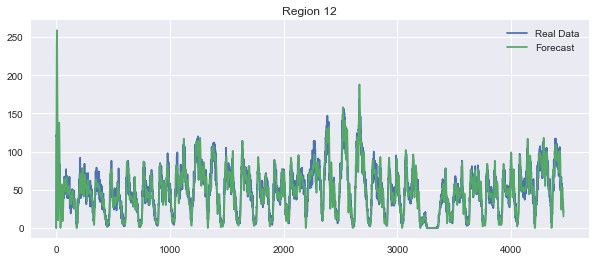

Optimal alpha: 0.1, Optimal Gamma: 0.9


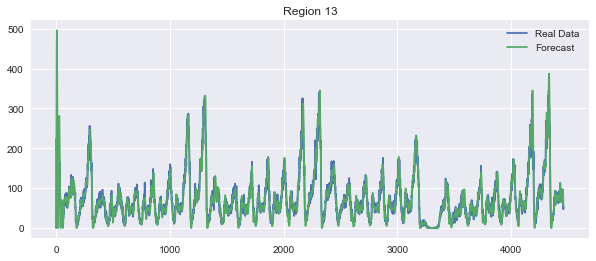

Optimal alpha: 0.1, Optimal Gamma: 0.9


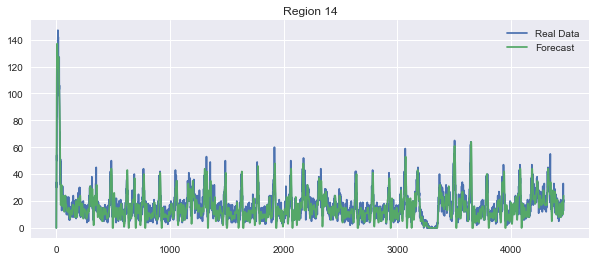

Optimal alpha: 0.1, Optimal Gamma: 0.9


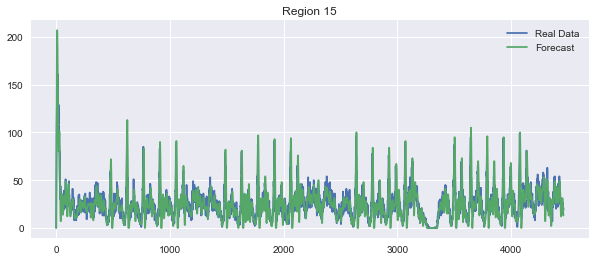

Optimal alpha: 0.1, Optimal Gamma: 0.9


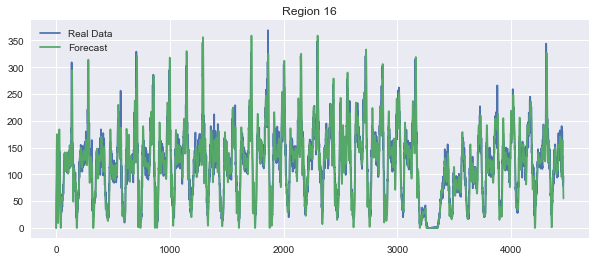

Optimal alpha: 0.1, Optimal Gamma: 0.9


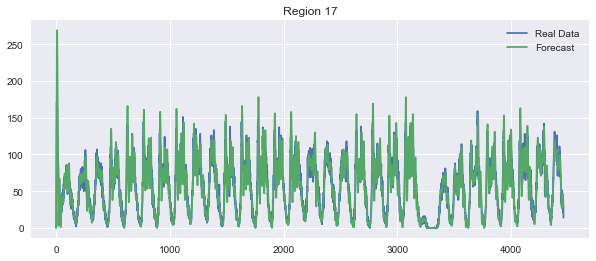

Optimal alpha: 0.1, Optimal Gamma: 0.9


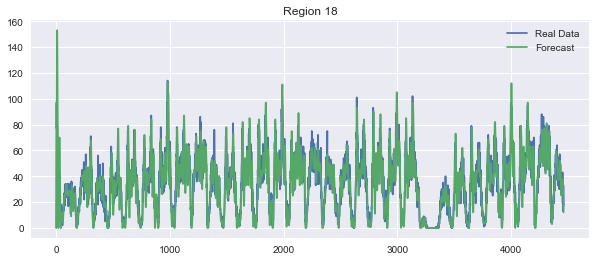

Optimal alpha: 0.1, Optimal Gamma: 0.9


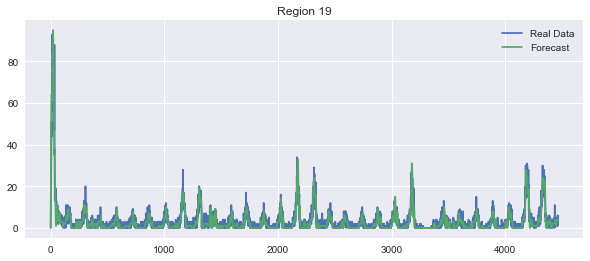

Optimal alpha: 0.1, Optimal Gamma: 0.9


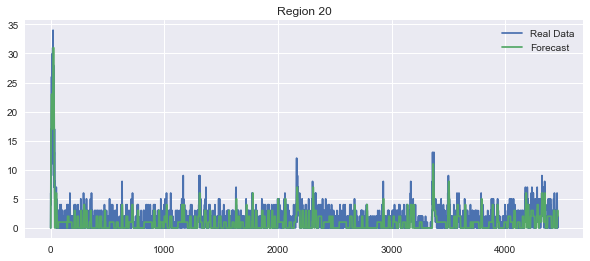

Optimal alpha: 0.1, Optimal Gamma: 0.9


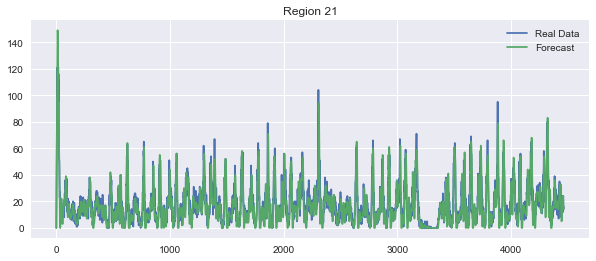

Optimal alpha: 0.1, Optimal Gamma: 0.9


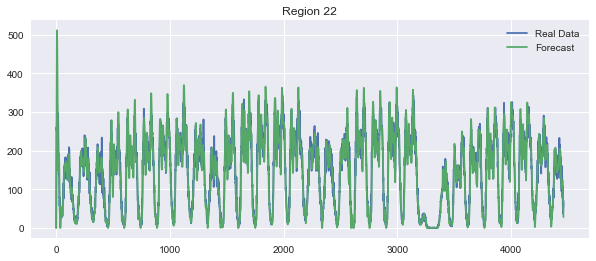

Optimal alpha: 0.1, Optimal Gamma: 0.9


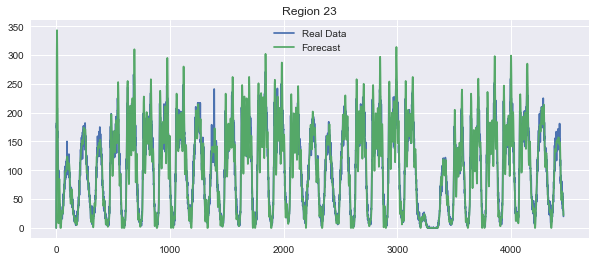

Optimal alpha: 0.1, Optimal Gamma: 0.9


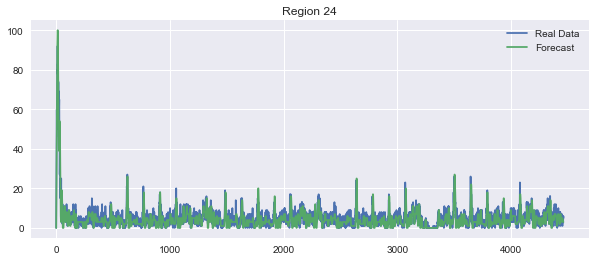

Optimal alpha: 0.1, Optimal Gamma: 0.9


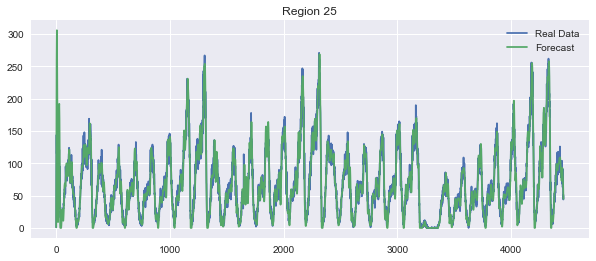

Optimal alpha: 0.1, Optimal Gamma: 0.9


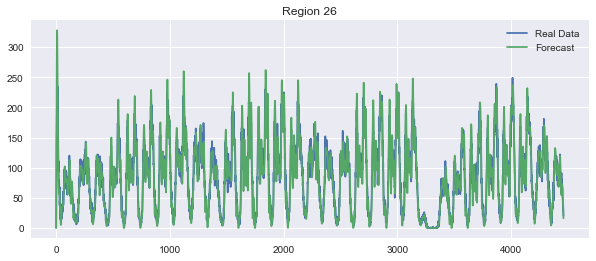

Optimal alpha: 0.1, Optimal Gamma: 0.9


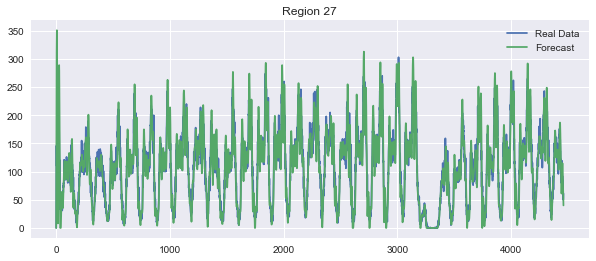

Optimal alpha: 0.1, Optimal Gamma: 0.9


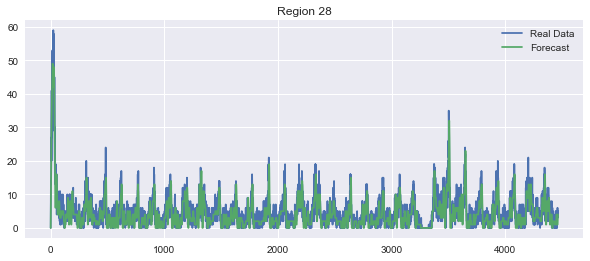

Optimal alpha: 0.1, Optimal Gamma: 0.9


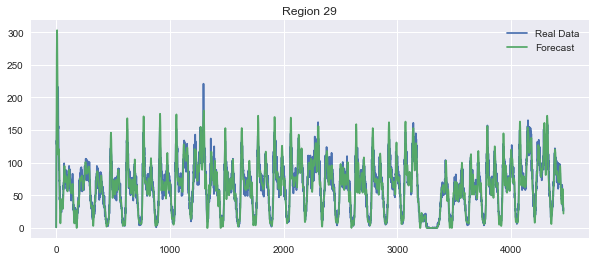

Optimal alpha: 0.1, Optimal Gamma: 0.9


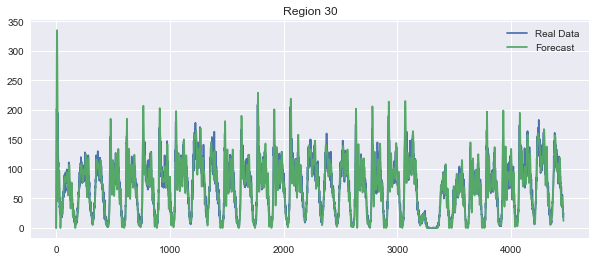

Optimal alpha: 0.1, Optimal Gamma: 0.9


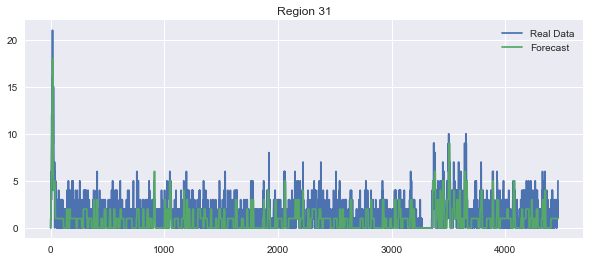

Optimal alpha: 0.1, Optimal Gamma: 0.9


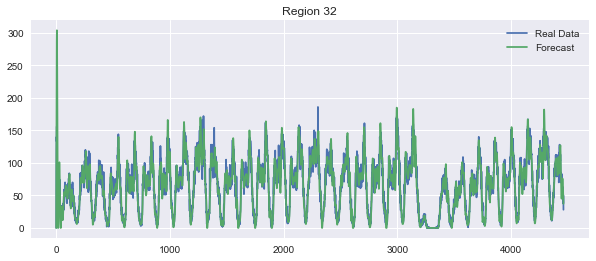

Optimal alpha: 0.1, Optimal Gamma: 0.9


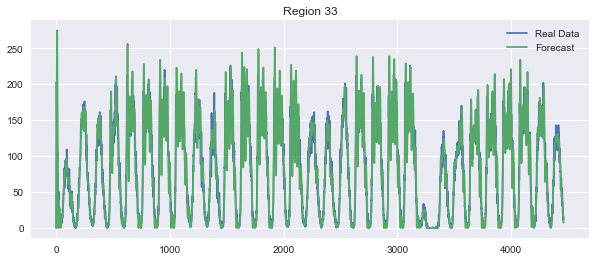

Optimal alpha: 0.1, Optimal Gamma: 0.9


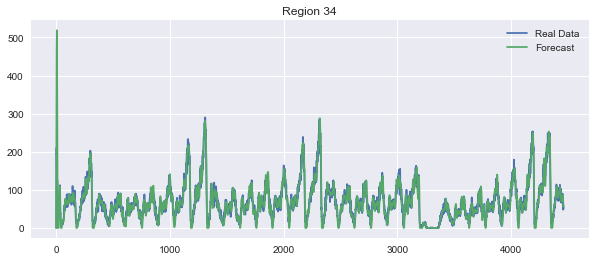

Optimal alpha: 0.1, Optimal Gamma: 0.9


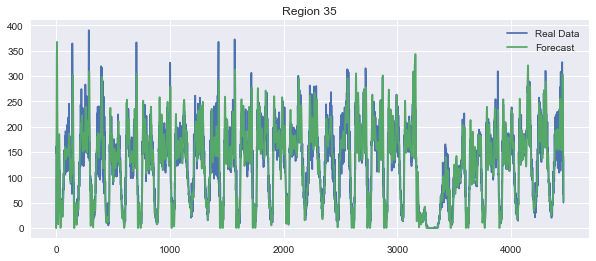

Optimal alpha: 0.1, Optimal Gamma: 0.9


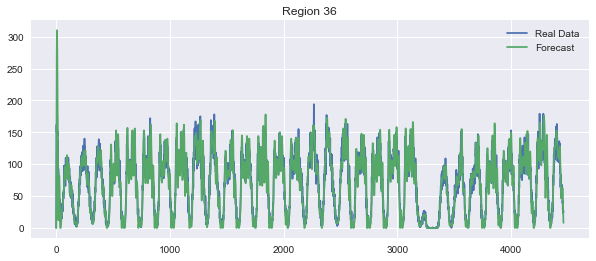

Optimal alpha: 0.1, Optimal Gamma: 0.9


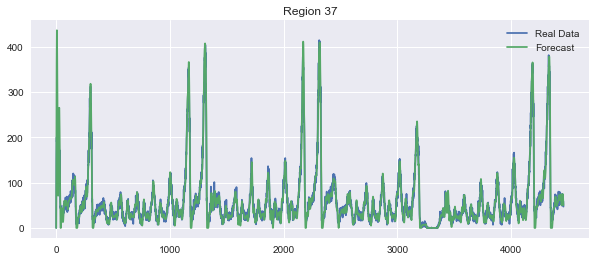

Optimal alpha: 0.1, Optimal Gamma: 0.9


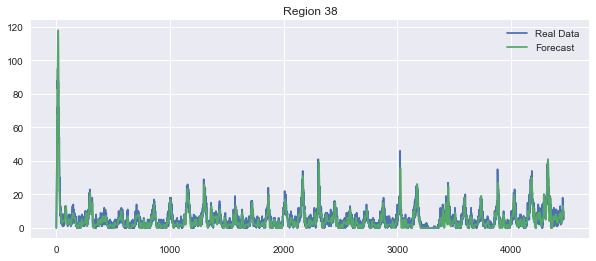

Optimal alpha: 0.1, Optimal Gamma: 0.9


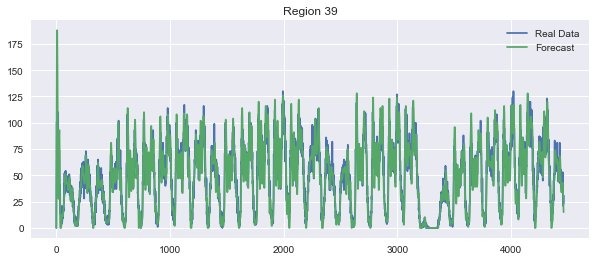

Optimal alpha: 0.1, Optimal Gamma: 0.9


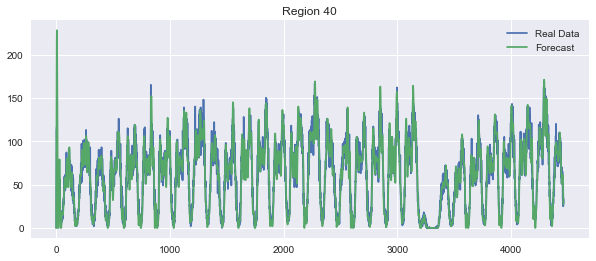

In [48]:
%matplotlib inline
#from pdb import set_trace
## https://www.kaggle.com/andreicosma/time-series-double-exponential-smoothing/notebook

def doubleExpSmoothing(r):
    predict_list = []
    gamma_range = np.linspace(0.1, 0.9, 9)
    alpha_range = np.linspace(0.1, 0.9, 9)
    mse_array = np.zeros((9, 9))
    mape_array = np.zeros((9, 9))
    for i_gamma in range(0, 9):
        for j_alpha in range(0, 9):
            alpha = (1 + j_alpha)*0.1
            gamma = (1 + i_gamma)*0.1
            n_timebins = len(regionwise_jan2016_pickups[r])
            pt_list = []
            pt = regionwise_jan2016_pickups[r][0]
            bt = regionwise_jan2016_pickups[r][1] - \
                regionwise_jan2016_pickups[r][0]
            pt_list.append(pt)
            for i in range(1, 4464):
                pt1 = alpha * \
                    regionwise_jan2016_pickups[r][i] + (1-alpha)*(pt + bt)
                bt = gamma*(pt1 - pt) + (1-gamma)*bt
                pt = pt1
                pt_list.append(pt)
#             set_trace()
#             mse_array[i_gamma][j_alpha] = mean_squared_error(regionwise_jan2016_pickups[r], pt_list)
            mape_array[i_gamma][j_alpha] = mean_absolute_error(regionwise_jan2016_pickups[r], pt_list)/(
                sum(regionwise_jan2016_pickups[r])/len(regionwise_jan2016_pickups[r]))

    optimal_alpha, optimal_gamma = np.unravel_index(
        np.argmin(mape_array), np.shape(mape_array))
    optimal_alpha = (1 + optimal_alpha)*0.1
    optimal_gamma = (1 + optimal_gamma)*0.1
    return optimal_alpha, optimal_gamma


forecast_all_regions = []
error = []
for r in range(40):
    forecast_list = []
    alpha, gamma = doubleExpSmoothing(r)
    print("Optimal alpha: %s, Optimal Gamma: %s" % (alpha, gamma))
    pt = regionwise_jan2016_pickups[r][0]
    bt = regionwise_jan2016_pickups[r][1] - regionwise_jan2016_pickups[r][0]
    forecast_list.append(pt)
    error.append(math.pow(abs(regionwise_jan2016_pickups[r][i] - pt), 1))

    for i in range(1, 4464):
        pt1 = alpha*regionwise_jan2016_pickups[r][i] + (1-alpha)*(pt + bt)
        bt = gamma*(pt1 - pt) + (1-gamma)*bt
        pt = max(int(pt1), 0)
        forecast_list.append(pt)
        error.append(math.pow(abs(regionwise_jan2016_pickups[r][i] - pt), 1))
    forecast_all_regions.extend(forecast_list)
    plt.figure(figsize=(10, 4))
    plt.plot(regionwise_jan2016_pickups[r], label='Real Data')
    plt.plot(forecast_list, label='Forecast')
    plt.title('Region '+str(r+1))
    plt.legend()
    plt.show()

# mse_array = doubleExpSmoothing(29)

In [49]:
len(jan_2016_smooth) == len(forecast_all_regions)

True

In [50]:
# jan2016_pickups = sum(regionwise_jan2016_pickups, [])
if len(error) == len(forecast_all_regions) == len(jan_2016_smooth):
    mape_err = (sum(error)/len(error))/(sum(jan_2016_smooth)/len(jan_2016_smooth))
    mse_err = sum([e**2 for e in error])/len(error)
    print(mape_err, mse_err)
    ## 0.19940103143245877 373.1578741039427

0.18872551930545492 346.7998263888889


In [51]:
forecast_truncated = sum([forecast_all_regions[i*4464 + 5: (i+1)*4464] for i in range(40)], [])
len(forecast_truncated) == 40*4459

True

In [52]:
train_forecast_double_exp = sum([forecast_truncated[i*4459:i*4459+3121] for i in range(40)], [])
print(len(train_forecast_double_exp))
test_forecast_double_exp = sum([forecast_truncated[i*4459+3121:(i+1)*4459] for i in range(40)], [])
print(len(test_forecast_double_exp))

124840
53520


In [53]:
df_train["DoubleExpForecast"] = train_forecast_double_exp
df_test["DoubleExpForecast"] = test_forecast_double_exp
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'DoubleExpAvg_Last5', 'ClusterID', 'DoubleExpForecast'],
      dtype='object')

In [302]:
lr_train_MAPE, lr_train_MSE, lr_test_MAPE, lr_test_MSE = linear_reg(df_train, train_output, df_test, test_output)
print(lr_train_MSE, lr_test_MSE, lr_train_MAPE*100, lr_test_MAPE*100)

SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False)
{'alpha': 0.0001}
162.09327939762898 189.07518684603886 13.413149316396296 19.23881950019396


In [133]:
rf_train_MAPE, rf_train_MSE, rf_test_MAPE, rf_test_MSE = randomForest_reg(df_train, train_output, df_test, test_output)
print(rf_train_MSE, rf_test_MSE, rf_train_MAPE*100, rf_test_MAPE*100)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:  5.9min remaining:  3.4min
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:  7.6min remaining:  2.3min
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:  8.3min remaining:   55.2s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  8.6min finished


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=700,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
                      oob_score=False, random_state=None, verbose=0,
                      warm_start=False)
{'max_depth': 700, 'n_estimators': 500}
20.449607497596926 122.52828849028401 4.685225473335268 13.389286828041191


In [134]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
137.52927747516821 118.37154334828102 12.47901535616925 12.991866275849622


## New Trial

In [41]:
df_train = pd.read_csv("df_train.csv")
df_train.drop(["Unnamed: 0"], axis=1, inplace=True)
# df_train.head()
df_test = pd.read_csv("df_test.csv")
df_test.drop(["Unnamed: 0"], axis=1, inplace=True)
df_test.head()
with open("train_output.pkl", "rb") as f:
    train_output = pickle.load(f)
with open("test_output.pkl", "rb") as f:
    test_output = pickle.load(f)
with open("regionwise_jan2016_pickups.pkl", "rb") as f:
    regionwise_jan2016_pickups = pickle.load(f)
with open("jan_2016_smooth.pkl", "rb") as f:
    jan_2016_smooth = pickle.load(f)

In [43]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53520 entries, 0 to 53519
Data columns (total 9 columns):
ft_5       53520 non-null int64
ft_4       53520 non-null int64
ft_3       53520 non-null int64
ft_2       53520 non-null int64
ft_1       53520 non-null int64
lat        53520 non-null float64
lon        53520 non-null float64
weekday    53520 non-null int64
exp_avg    53520 non-null int64
dtypes: float64(2), int64(7)
memory usage: 3.7 MB


In [15]:
def ExpSmoothingLast5(df):
    predict_list = []
    alpha = 0.3
    for i, row in df.iterrows():
        for j in range(5):
            if j==0:
                predicted_value = row[j]
                continue
            predicted_value = int(alpha*predicted_value + (1-alpha)*row[j])
        predict_list.append(predicted_value)
    if len(predict_list) == len(df):
        df["exp_avg_Last5"] = predict_list

predict_list_train = ExpSmoothingLast5(df_train)
predict_list_test = ExpSmoothingLast5(df_test)
print(df_train.columns)
print(df_test.columns)

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'exp_avg_Last5'],
      dtype='object')
Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'exp_avg_Last5'],
      dtype='object')


In [16]:
exp_avg_train = df_train["exp_avg"]
exp_avg_test = df_test["exp_avg"]
df_train.drop(['exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2', 'freq3', 'freq4', 'freq5', ], 
              axis=1, inplace=True)
df_test.drop(['exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2', 'freq3', 'freq4', 'freq5', ], 
              axis=1, inplace=True)
print(df_train.columns)
print(df_test.columns)

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', 'exp_avg_Last5'],
      dtype='object')
Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', 'exp_avg_Last5'],
      dtype='object')


In [8]:
df_train[:5]

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,exp_avg,amp1,amp2,amp3,amp4,amp5,freq1,freq2,freq3,freq4,freq5,DoubleExpForecast
0,0,63,217,189,137,40.776228,-73.982119,4,150,121349.296301,52702.45119,27905.80522,27361.688511,18504.3499,0.006952,0.013904,0.013007,0.000673,0.000897,298
1,63,217,189,137,135,40.776228,-73.982119,4,139,121349.296301,52702.45119,27905.80522,27361.688511,18504.3499,0.006952,0.013904,0.013007,0.000673,0.000897,318
2,217,189,137,135,129,40.776228,-73.982119,4,132,121349.296301,52702.45119,27905.80522,27361.688511,18504.3499,0.006952,0.013904,0.013007,0.000673,0.000897,321
3,189,137,135,129,150,40.776228,-73.982119,4,144,121349.296301,52702.45119,27905.80522,27361.688511,18504.3499,0.006952,0.013904,0.013007,0.000673,0.000897,309
4,137,135,129,150,164,40.776228,-73.982119,4,158,121349.296301,52702.45119,27905.80522,27361.688511,18504.3499,0.006952,0.013904,0.013007,0.000673,0.000897,284


In [7]:
# df_train.columns
df_train.drop(['Last5Means', '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'nPeaksLast5Bins',
               'nPeaksLast10Bins', 'nPeaksLast15Bins', 'nPeaksLast12Hrs',
               'nPeaksLastDay', 'Last5Medians', 'Last10Medians', 'Last15Medians',
               'Last12hrMedians', 'LastDayMedians', 'Last10PickupMeans',
               'Last15PickupMeans', 'Last30PickupMeans'], axis=1, inplace=True)
df_test.drop(['Last5Means', '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'nPeaksLast5Bins',
               'nPeaksLast10Bins', 'nPeaksLast15Bins', 'nPeaksLast12Hrs',
               'nPeaksLastDay', 'Last5Medians', 'Last10Medians', 'Last15Medians',
               'Last12hrMedians', 'LastDayMedians', 'Last10PickupMeans',
               'Last15PickupMeans', 'Last30PickupMeans'], axis=1, inplace=True)

In [44]:
# pt = regionwise_jan2016_pickups[r][0]
#     bt = regionwise_jan2016_pickups[r][1] - regionwise_jan2016_pickups[r][0]
#     forecast_list.append(pt)
#     error.append(math.pow(abs(regionwise_jan2016_pickups[r][i] - pt), 1))

#     for i in range(1, 4464):
#         pt1 = alpha*regionwise_jan2016_pickups[r][i] + (1-alpha)*(pt + bt)
#         bt = gamma*(pt1 - pt) + (1-gamma)*bt
#         pt = max(int(pt1), 0)
#         forecast_list.append(pt)

def DoubleExpSmoothingLast5(df):
    predict_list = []
    alpha = 0.33
    gamma = 0.33
    for i, row in df.iterrows():
        for j in range(5):
            if j==0:
                pt = row[j]
                bt = row[j+1] - row[j]
                #predict_list.append(pt)
                continue
            pt1 = int(alpha*row[j] + (1-alpha)*(pt + bt))
            bt = gamma*(pt1 - pt) + (1-gamma)*bt
            pt = max(int(pt1), 0)
        predict_list.append(pt)
    
    print(len(predict_list))
    if len(predict_list) == len(df):
        df["DoubleExpAvg_Last5"] = predict_list

predict_list_train = DoubleExpSmoothingLast5(df_train)
predict_list_test = DoubleExpSmoothingLast5(df_test)

print(df_train.columns)
print(df_test.columns)

124840
53520
Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'DoubleExpAvg_Last5'],
      dtype='object')
Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'DoubleExpAvg_Last5'],
      dtype='object')


In [45]:
clusterid_train = sum([[i]*3121 for i in range(40)], [])
print(len(clusterid_train), "\n", np.unique(clusterid_train))
clusterid_test = sum([[i]*1338 for i in range(40)], [])
print(len(clusterid_test), "\n", np.unique(clusterid_test))

124840 
 [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]
53520 
 [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]


In [46]:
df_train['ClusterID'] = clusterid_train
df_test['ClusterID'] = clusterid_test

In [54]:
double_exp_last5_train = df_train["DoubleExpAvg_Last5"]
double_exp_last5_test = df_test["DoubleExpAvg_Last5"]
df_train.drop(["DoubleExpAvg_Last5"], axis=1, inplace=True)
df_test.drop(["DoubleExpAvg_Last5"], axis=1, inplace=True)
print(df_train.columns)
print(df_test.columns)

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'ClusterID', 'DoubleExpForecast'],
      dtype='object')
Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'ClusterID', 'DoubleExpForecast'],
      dtype='object')


In [55]:
# df_train["DoubleExpForecast"] = double_exp_train
# df_test["DoubleExpForecast"] = double_exp_test
# df_train.drop(['exp_avg_Last5'], axis=1, inplace=True)
# df_test.drop(['exp_avg_Last5'], axis=1, inplace=True)
print(df_train.columns)
print(df_test.columns)

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'ClusterID', 'DoubleExpForecast'],
      dtype='object')
Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'ClusterID', 'DoubleExpForecast'],
      dtype='object')


In [56]:
from sklearn.preprocessing import OneHotEncoder
X_train = OneHotEncoder(categorical_features=[9]).fit_transform(df_train).toarray()
X_test = OneHotEncoder(categorical_features=[9]).fit_transform(df_test).toarray()
print(X_train.shape)
print(X_test.shape)

(124840, 50)
(53520, 50)


In [63]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 22.5min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 27.5min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 30.5min
[Parallel(n_jobs=-1)]: Done  52 out of  60 | elapsed: 32.4min remaining:  5.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 35.1min finished


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=1, gamma=0, importance_type='gain',
             learning_rate=0.1, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=None, n_estimators=399, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=1, verbose=10)
{'max_depth': 3, 'n_estimators': 399}
140.76727010573535 119.9190956651719 12.61793697692582 12.982635193863093


## Adding MAE for each of last 5 pickups

In [64]:
def add_ft_mae(df):
    ft_mean = df.groupby('ClusterID').mean()
    # type(ft_5_mean)
    ft_5_mae_list = []
    ft_4_mae_list = []
    ft_3_mae_list = []
    ft_2_mae_list = []
    ft_1_mae_list = []
    for i in range(40):
        df_sub = df[df["ClusterID"] == i]
        ft_5_mae = np.abs(df_sub["ft_5"] - ft_mean.loc[i, "ft_5"])
        ft_4_mae = np.abs(df_sub["ft_4"] - ft_mean.loc[i, "ft_4"])
        ft_3_mae = np.abs(df_sub["ft_3"] - ft_mean.loc[i, "ft_3"])
        ft_2_mae = np.abs(df_sub["ft_2"] - ft_mean.loc[i, "ft_2"])
        ft_1_mae = np.abs(df_sub["ft_1"] - ft_mean.loc[i, "ft_1"])

        ft_5_mae_list.extend(ft_5_mae)
        ft_4_mae_list.extend(ft_4_mae)
        ft_3_mae_list.extend(ft_3_mae)
        ft_2_mae_list.extend(ft_2_mae)
        ft_1_mae_list.extend(ft_1_mae)

    if (len(ft_5_mae_list) == len(ft_4_mae_list) == len(ft_3_mae_list) == len(ft_2_mae_list) == len(ft_1_mae_list) == len(df)):
        df["ft_5_mae"] = ft_5_mae_list
        df["ft_4_mae"] = ft_4_mae_list
        df["ft_3_mae"] = ft_3_mae_list
        df["ft_2_mae"] = ft_2_mae_list
        df["ft_1_mae"] = ft_1_mae_list


add_ft_mae(df_train)
add_ft_mae(df_test)
print(df_train.columns)
print(df_test.columns)

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'ClusterID', 'DoubleExpForecast', 'ft_5_mae', 'ft_4_mae',
       'ft_3_mae', 'ft_2_mae', 'ft_1_mae'],
      dtype='object')
Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'ClusterID', 'DoubleExpForecast', 'ft_5_mae', 'ft_4_mae',
       'ft_3_mae', 'ft_2_mae', 'ft_1_mae'],
      dtype='object')


In [34]:
df_test.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,DoubleExpAvg_Last5,ClusterID,DoubleExpForecast,ft_5_mae,ft_4_mae,ft_3_mae,ft_2_mae,ft_1_mae
0,119,121,126,115,104,40.776228,-73.982119,4,115,0,105,44.930493,46.992526,52.058296,41.121076,30.186099
1,121,126,115,104,142,40.776228,-73.982119,4,127,0,103,46.930493,51.992526,41.058296,30.121076,68.186099
2,126,115,104,142,141,40.776228,-73.982119,4,115,0,104,51.930493,40.992526,30.058296,68.121076,67.186099
3,115,104,142,141,135,40.776228,-73.982119,4,120,0,109,40.930493,29.992526,68.058296,67.121076,61.186099
4,104,142,141,135,146,40.776228,-73.982119,4,185,0,119,29.930493,67.992526,67.058296,61.121076,72.186099


In [35]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 16.0min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 22.9min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 40.7min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 49.7min
[Parallel(n_jobs=-1)]: Done  52 out of  60 | elapsed: 59.8min remaining:  9.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 67.4min finished


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=4,
             min_child_weight=1, missing=None, n_estimators=5300, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=10, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.6736596308357894, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 4, 'reg_lambda': 10, 'subsample': 0.6736596308357894}
128.00886735020828 118.78312780269059 12.186655396083733 12.981494273617567


## Mean no. of pickups in last 5 timebins

In [5]:
predict_list = []
for r in range(0,40):
    for i in range(5,4464):
        sum_pickups = 0
        for j in range(i-5,i):
            sum_pickups += regionwise_jan2016_pickups[r][j]
        predict_list.append(int(sum_pickups/5))
print(len(predict_list) == 40*4459)

True


In [304]:
mean_pickups_train = sum([predict_list[i*4459:i*4459+3121] for i in range(40)], [])
print(len(mean_pickups_train))
mean_pickups_test = sum([predict_list[i*4459+3121:(i+1)*4459] for i in range(40)], [])
print(len(mean_pickups_test))

124840
53520


In [305]:
df_train["Last5Means"] = mean_pickups_train
df_test["Last5Means"] = mean_pickups_test
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'Last5Means'],
      dtype='object')

In [143]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
137.13931432233258 118.20231689088192 12.463213167884293 12.935546303729565


In [484]:
len(mean_pickups_test)

53520

# Assignments

        

In [121]:
'''
Task 1: Incorporate Fourier features as features into Regression models and measure MAPE. <br>

Task 2: Perform hyper-parameter tuning for Regression models.
        2a. Linear Regression: Grid Search
        2b. Random Forest: Random Search 
        2c. Xgboost: Random Search
Task 3: Explore more time-series features using Google search/Quora/Stackoverflow
to reduce the MAPE to < 12%
'''

'\nTask 1: Incorporate Fourier features as features into Regression models and measure MAPE. <br>\n\nTask 2: Perform hyper-parameter tuning for Regression models.\n        2a. Linenar Regression: Grid Search\n        2b. Random Forest: Random Search \n        2c. Xgboost: Random Search\nTask 3: Explore more time-series features using Google search/Quora/Stackoverflow\nto reduce the MPAE to < 12%\n'

## Means Pickup values of Last 5, 10, 15 , etc. timebins

In [130]:
def meanPickupsLastn(n):
    predict_list = []
    for r in range(0,40):
        for i in range(n,4464):
            sum_pickups = 0
            if (i == n) and (n > 5):
                predict_list.extend([0]*(n-5))
            for j in range(i-n,i):
                sum_pickups += regionwise_jan2016_pickups[r][j]
            predict_list.append(int(sum_pickups/n))
    return predict_list

In [131]:
predict_list_5 = meanPickupsLastn(5)
predict_list_10 = meanPickupsLastn(10)
predict_list_15 = meanPickupsLastn(15)
predict_list_30 = meanPickupsLastn(30)
predict_list_36 = meanPickupsLastn(36)
predict_list_72 = meanPickupsLastn(72)
predict_list_144 = meanPickupsLastn(144)
len(predict_list_36) == len(predict_list_72) == len(predict_list_144)

True

In [132]:
mean_last5_pickups_train = sum([predict_list_5[i*4459:i*4459+3121] for i in range(40)], [])
mean_last5_pickups_test = sum([predict_list_5[i*4459+3121:(i+1)*4459] for i in range(40)], [])

mean_last10_pickups_train = sum([predict_list_10[i*4459:i*4459+3121] for i in range(40)], [])
mean_last10_pickups_test = sum([predict_list_10[i*4459+3121:(i+1)*4459] for i in range(40)], [])

mean_last15_pickups_train = sum([predict_list_15[i*4459:i*4459+3121] for i in range(40)], [])
mean_last15_pickups_test = sum([predict_list_15[i*4459+3121:(i+1)*4459] for i in range(40)], [])

mean_last30_pickups_train = sum([predict_list_30[i*4459:i*4459+3121] for i in range(40)], [])
mean_last30_pickups_test = sum([predict_list_30[i*4459+3121:(i+1)*4459] for i in range(40)], [])

mean_6hr_pickups_train = sum([predict_list_36[i*4459:i*4459+3121] for i in range(40)], [])
mean_6hr_pickups_test = sum([predict_list_36[i*4459+3121:(i+1)*4459] for i in range(40)], [])

mean_12hr_pickups_train = sum([predict_list_72[i*4459:i*4459+3121] for i in range(40)], [])
mean_12hr_pickups_test = sum([predict_list_72[i*4459+3121:(i+1)*4459] for i in range(40)], [])

mean_24hr_pickups_train = sum([predict_list_144[i*4459:i*4459+3121] for i in range(40)], [])
mean_24hr_pickups_test = sum([predict_list_144[i*4459+3121:(i+1)*4459] for i in range(40)], [])

print(len(mean_6hr_pickups_train) == len(mean_12hr_pickups_train) == len(mean_24hr_pickups_train) == 40*3121)
print(len(mean_6hr_pickups_test) == len(mean_12hr_pickups_test) == len(mean_12hr_pickups_test) == 40*1338)

True
True


In [133]:
df_train["Last5PickupMeans"] = mean_last5_pickups_train
df_test["Last5PickupMeans"] = mean_last5_pickups_test

df_train["Last10PickupMeans"] = mean_last10_pickups_train
df_test["Last10PickupMeans"] = mean_last10_pickups_test

df_train["Last15PickupMeans"] = mean_last15_pickups_train
df_test["Last15PickupMeans"] = mean_last15_pickups_test

df_train["Last30PickupMeans"] = mean_last30_pickups_train
df_test["Last30PickupMeans"] = mean_last30_pickups_test

df_train["6hrMeans"] = mean_6hr_pickups_train
df_test["6hrMeans"] = mean_6hr_pickups_test

df_train["12hrMeans"] = mean_12hr_pickups_train
df_test["12hrMeans"] = mean_12hr_pickups_test

df_train["24hrMeans"] = mean_24hr_pickups_train
df_test["24hrMeans"] = mean_24hr_pickups_test

In [3]:
# df_train.drop(['Last5Means'], axis=1, inplace=True)
# df_test.drop(['Last5Means'], axis=1, inplace=True)
df_test.columns

NameError: name 'df_test' is not defined

In [129]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
129.16285645626402 113.64103139013453 12.108774109860915 12.747536476603184


## Holt Winters' Exponential Smoothing Model

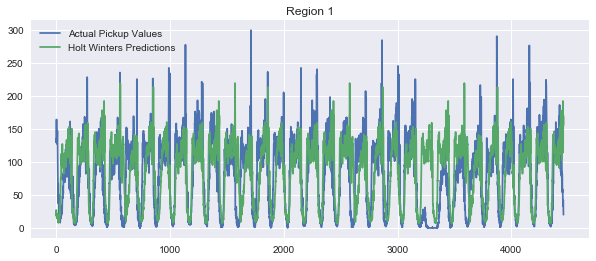

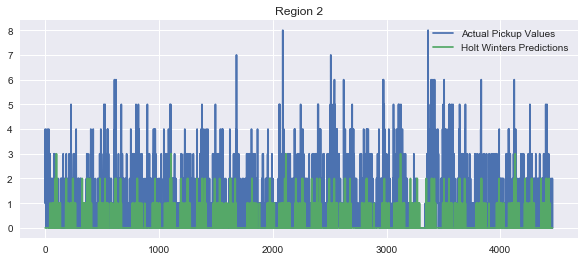

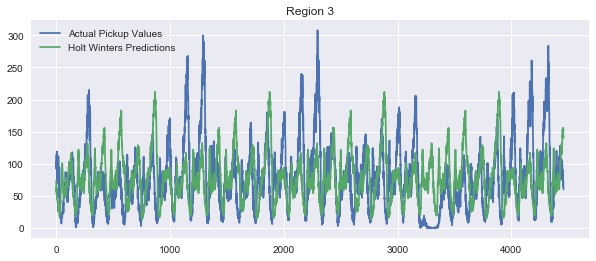

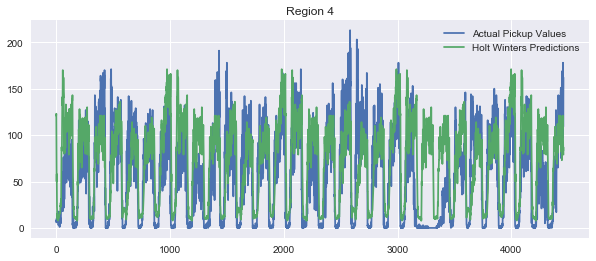

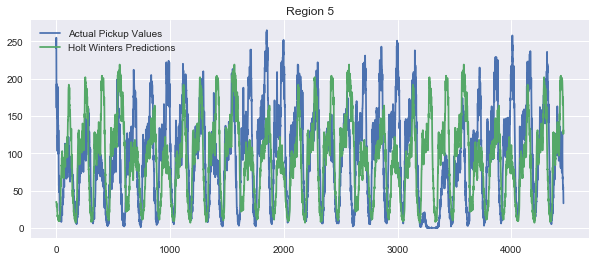

...

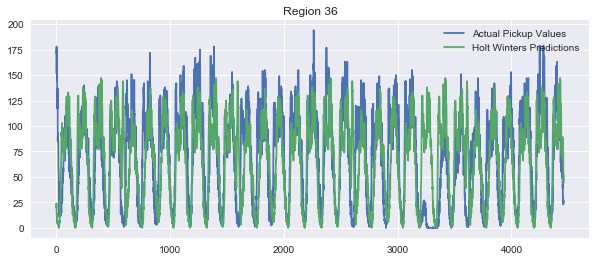

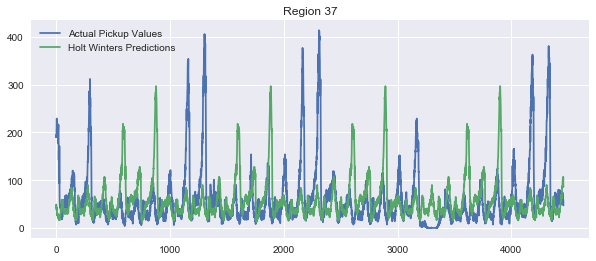

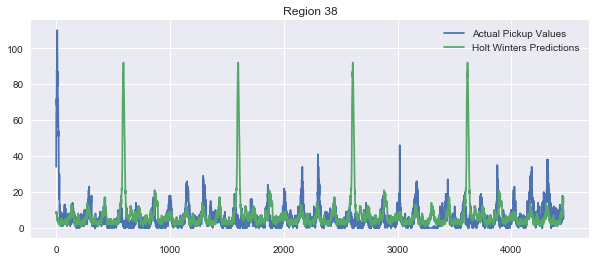

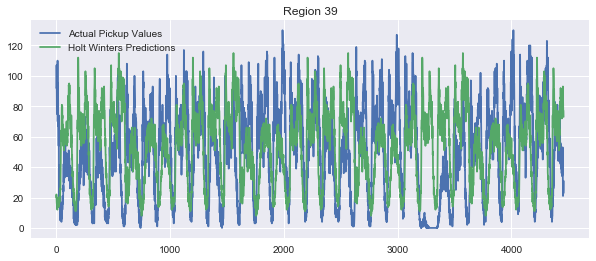

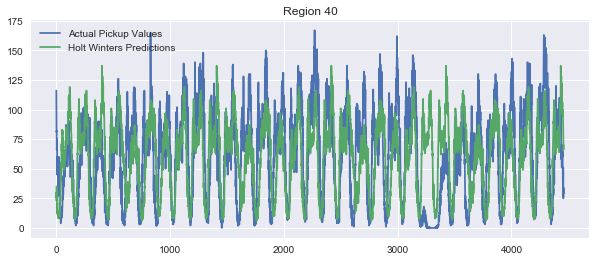

In [55]:
# https://www.analyticsvidhya.com/blog/2018/02/time-series-forecasting-methods/
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt, SARIMAX
forecast_list = []
for i in range(40):
    plt.figure(figsize=(10,4))
    
    train = regionwise_jan2016_pickups[i][5:]
#     test = regionwise_jan2016_pickups[i][3124:]
#     test_list.append(test)
    fit1 = ExponentialSmoothing(train, seasonal_periods=1008, seasonal='add').fit()

    forecast = fit1.forecast(len(train))
    forecast = [max(int(value), 0) for value in forecast]
    forecast_list.extend(forecast)
#     plt.plot(range(3121),regionwise_jan2016_pickups[i][:4464], color=uniqueish_color(), 
#              label='Jan 2016 data for region '+str(i+1))
    plt.plot(range(len(train)), train, label='Actual Pickup Values')
#     plt.plot(range(3124, 4464), test, label='Test')
    plt.plot(range(len(train)), forecast, label='Holt Winters Predictions')
    plt.title("Region "+str(i+1))
    plt.legend(loc='best')
    plt.show()

In [56]:
len(forecast_list)

178360

In [57]:
holt_winters_train = [forecast_list[i*4459:i*4459+3121] for i in range(40)]
holt_winters_test = [forecast_list[i*4459+3121:(i+1)*4459] for i in range(40)]

In [58]:
holt_winters_train_flat = sum(holt_winters_train, [])
holt_winters_test_flat = sum(holt_winters_test, [])
print(len(holt_winters_train_flat) == len(df_train))
print(len(holt_winters_test_flat) == len(df_test))

True
True


In [59]:
df_train['holt_winters'] = holt_winters_train_flat
df_test['holt_winters'] = holt_winters_test_flat
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', 'exp_avg', 'holt_winters'],
      dtype='object')

In [127]:
lr_train_MAPE, lr_train_MSE, lr_test_MAPE, lr_test_MSE = linear_reg(df_train, train_output, df_test, test_output)
print(lr_train_MSE, lr_test_MSE, lr_train_MAPE*100, lr_test_MAPE*100)

SGDRegressor(alpha=0.001, average=False, early_stopping=False, epsilon=0.1,
       eta0=0.01, fit_intercept=True, l1_ratio=0.15,
       learning_rate='invscaling', loss='squared_loss', max_iter=None,
       n_iter=None, n_iter_no_change=5, penalty='l2', power_t=0.25,
       random_state=None, shuffle=True, tol=None, validation_fraction=0.1,
       verbose=0, warm_start=False)
{'alpha': 0.001}
223.79234219801344 250.4562032884903 15.007157531461571 19.43302583232761


In [152]:
rf_train_MAPE, rf_train_MSE, rf_test_MAPE, rf_test_MSE = randomForest_reg(df_train, train_output, df_test, test_output)
print(rf_train_MSE, rf_test_MSE, rf_train_MAPE*100, rf_test_MAPE*100)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:  6.8min remaining:  3.9min
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:  8.6min remaining:  2.6min
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed: 10.0min remaining:  1.1min
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 10.1min finished


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=700,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
                      oob_score=False, random_state=None, verbose=0,
                      warm_start=False)
{'max_depth': 700, 'n_estimators': 500}
19.96324094841397 118.08492152466367 4.609421713920663 12.86097160768109


In [60]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=1, gamma=0, importance_type='gain',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=2255, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=1, verbose=10)
{'max_depth': 5, 'n_estimators': 2255}
71.43552547260494 119.8640134529148 9.478365479814556 13.320001853131064


In [345]:
train_mape_fourier_hw=[]
test_mape_fourier_hw=[]

train_mape_fourier_hw.append((mean_absolute_error(train_output,df_train['ft_1'].values))/(sum(train_output)/len(train_output)))
train_mape_fourier_hw.append((mean_absolute_error(train_output,df_train['exp_avg'].values))/(sum(train_output)/len(train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output,rndf_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output, xgb_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
# train_mape.append((mean_absolute_error(tsne_train_output, lr_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape_fourier_hw.append(rf_train_MAPE)
train_mape_fourier_hw.append(lr_train_MAPE)
train_mape_fourier_hw.append(xgb_train_MAPE)

test_mape_fourier_hw.append((mean_absolute_error(test_output, df_test['ft_1'].values))/(sum(test_output)/len(test_output)))
test_mape_fourier_hw.append((mean_absolute_error(test_output, df_test['exp_avg'].values))/(sum(test_output)/len(test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, rndf_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, xgb_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
# test_mape.append((mean_absolute_error(tsne_test_output, lr_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape_fourier_hw.append(rf_test_MAPE)
test_mape_fourier_hw.append(lr_test_MAPE)
test_mape_fourier_hw.append(xgb_test_MAPE)

In [104]:
df_train.to_csv("df_train_meanpickups_hw.csv")
df_test.to_csv("df_test_meanpickups_hw.csv")

In [2]:
df_train = pd.read_csv("df_train_meanpickups_hw.csv")
df_train.drop(["Unnamed: 0"], axis=1, inplace=True)
# df_train.head()
df_test = pd.read_csv("df_test_meanpickups_hw.csv")
df_test.drop(["Unnamed: 0"], axis=1, inplace=True)
df_test.head()
with open("train_output.pkl", "rb") as f:
    train_output = pickle.load(f)
with open("test_output.pkl", "rb") as f:
    test_output = pickle.load(f)
with open("regionwise_jan2016_pickups.pkl", "rb") as f:
    regionwise_jan2016_pickups = pickle.load(f)
with open("jan_2016_smooth.pkl", "rb") as f:
    jan_2016_smooth = pickle.load(f)

In [3]:
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'Last5Means',
       '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'nPeaksLast5Bins',
       'nPeaksLast10Bins', 'nPeaksLast15Bins', 'nPeaksLast12Hrs',
       'nPeaksLastDay', 'Last5Medians', 'Last10Medians', 'Last15Medians',
       'Last12hrMedians', 'LastDayMedians', 'Last10PickupMeans',
       'Last15PickupMeans', 'Last30PickupMeans'],
      dtype='object')

In [12]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 33.3min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 49.5min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 58.9min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 71.4min
[Parallel(n_jobs=-1)]: Done  52 out of  60 | elapsed: 81.0min remaining: 12.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 90.4min finished


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.5, gamma=0, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=4625, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.6120957227224214, verbose=10)
{'colsample_bytree': 0.5, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 4625, 'reg_lambda': 1, 'subsample': 0.6120957227224214}
109.81493111182313 113.47475710014947 11.436499419266335 12.67012676661128


In [90]:
df_train.drop(['yhat'], axis=1, inplace=True)
df_test.drop(['yhat'], axis=1, inplace=True)

## Peaks

In [59]:
## Counting the no. of timebins in the last n timebins where no. of pickups is greater than the 75 percentile value 
## for each cluster
def countPeaksLastn(n):
    peaks_list = []
    for r in range(0,40):
        thirdquartile_pickups = np.percentile(regionwise_jan2016_pickups[r], [75])
        for i in range(n, 4464):
            if (i == n) and (n > 5):
                peaks_list.extend([0]*(n-5))
#             for j in range(i-n,i):
            pickups = np.array(regionwise_jan2016_pickups[r][i-n:i])
            peaks = pickups[pickups > thirdquartile_pickups]
            peaks_list.append(len(peaks))
    return peaks_list

## Counting the no. of timebins in the last n timebins where no. of pickups is greater than the 90 percentile value 
## for each cluster
def countLastn90PercentilePeaks(n):
    peaks_list = []
    for r in range(0,40):
        thirdquartile_pickups = np.percentile(regionwise_jan2016_pickups[r], [90])
        for i in range(n, 4464):
            if (i == n) and (n > 5):
                peaks_list.extend([0]*(n-5))
#             for j in range(i-n,i):
            pickups = np.array(regionwise_jan2016_pickups[r][i-n:i])
            peaks = pickups[pickups > thirdquartile_pickups]
            peaks_list.append(len(peaks))
    return peaks_list

def countPickupsInIQR(n):
    pickup_list = []
    for r in range(0,40):
        thirdquartile_pickups = np.percentile(regionwise_jan2016_pickups[r], [75])
        firstquartile_pickups = np.percentile(regionwise_jan2016_pickups[r], [25])
        for i in range(n, 4464):
            if (i == n) and (n > 5):
                pickup_list.extend([0]*(n-5))
#             for j in range(i-n,i):
            pickups = np.array(regionwise_jan2016_pickups[r][i-n:i])
            pickups = pickups[(pickups >= firstquartile_pickups) & (pickups <= thirdquartile_pickups)]
            pickup_list.append(len(pickups))
    return pickup_list

In [53]:
peaksLast5 = countPeaksLastn(5)
peaksLast5_train = sum([peaksLast5[i*4459:i*4459+3121] for i in range(40)], [])
peaksLast5_test = sum([peaksLast5[i*4459+3121:(i+1)*4459] for i in range(40)], [])
                      
# peaksLast10 = countPeaksLastn(10)
# peaksLast10_train = sum([peaksLast10[i*4459:i*4459+3121] for i in range(40)], [])
# peaksLast10_test = sum([peaksLast10[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# peaksLast15 = countPeaksLastn(15)
# peaksLast15_train = sum([peaksLast15[i*4459:i*4459+3121] for i in range(40)], [])
# peaksLast15_test = sum([peaksLast15[i*4459+3121:(i+1)*4459] for i in range(40)], [])
                      
peaksLast12hrs = countPeaksLastn(72)
peaksLast12hrs_train = sum([peaksLast12hrs[i*4459:i*4459+3121] for i in range(40)], [])
peaksLast12hrs_test = sum([peaksLast12hrs[i*4459+3121:(i+1)*4459] for i in range(40)], [])
                      
peaksLast24hrs = countPeaksLastn(144)
peaksLast24hrs_train = sum([peaksLast24hrs[i*4459:i*4459+3121] for i in range(40)], [])
peaksLast24hrs_test = sum([peaksLast24hrs[i*4459+3121:(i+1)*4459] for i in range(40)], [])

In [60]:
pickupsInIQR_Last12Hrs = countPickupsInIQR(72)
pickupsInIQR_Last12Hrs_train = sum([pickupsInIQR_Last12Hrs[i*4459:i*4459+3121] for i in range(40)], [])
pickupsInIQR_Last12Hrs_test = sum([pickupsInIQR_Last12Hrs[i*4459+3121:(i+1)*4459] for i in range(40)], [])

pickupsInIQR_Last24Hrs = countPickupsInIQR(144)
pickupsInIQR_Last24Hrs_train = sum([pickupsInIQR_Last24Hrs[i*4459:i*4459+3121] for i in range(40)], [])
pickupsInIQR_Last24Hrs_test = sum([pickupsInIQR_Last24Hrs[i*4459+3121:(i+1)*4459] for i in range(40)], [])

In [61]:
len(peaksLast12hrs_test) == len(pickupsInIQR_Last12Hrs_test)

True

In [52]:
# ninetypercentile_peaks_Last5 = countLastn90PercentilePeaks(5)
# ninetypercentile_peaks_Last5_train = sum([ninetypercentile_peaks_Last5[i*4459:i*4459+3121] for i in range(40)], [])
# ninetypercentile_peaks_Last5_test = sum([ninetypercentile_peaks_Last5[i*4459+3121:(i+1)*4459] for i in range(40)], [])
     
# ninetypercentile_peaks_Last10 = countLastn90PercentilePeaks(10)
# ninetypercentile_peaks_Last10_train = sum([ninetypercentile_peaks_Last10[i*4459:i*4459+3121] for i in range(40)], [])
# ninetypercentile_peaks_Last10_test = sum([ninetypercentile_peaks_Last10[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# ninetypercentile_peaks_Last15 = countLastn90PercentilePeaks(15)
# ninetypercentile_peaks_Last15_train = sum([ninetypercentile_peaks_Last15[i*4459:i*4459+3121] for i in range(40)], [])
# ninetypercentile_peaks_Last15_test = sum([ninetypercentile_peaks_Last15[i*4459+3121:(i+1)*4459] for i in range(40)], [])
                      
# ninetypercentile_peaks_Last12hrs = countLastn90PercentilePeaks(72)
# ninetypercentile_peaks_Last12hrs_train = sum([ninetypercentile_peaks_Last12hrs[i*4459:i*4459+3121] for i in range(40)], [])
# ninetypercentile_peaks_Last12hrs_test = sum([ninetypercentile_peaks_Last12hrs[i*4459+3121:(i+1)*4459] for i in range(40)], [])
                      
# ninetypercentile_peaks_Last24hrs = countLastn90PercentilePeaks(144)
# ninetypercentile_peaks_Last24hrs_train = sum([ninetypercentile_peaks_Last24hrs[i*4459:i*4459+3121] for i in range(40)], [])
# ninetypercentile_peaks_Last24hrs_test = sum([ninetypercentile_peaks_Last24hrs[i*4459+3121:(i+1)*4459] for i in range(40)], [])

In [55]:
print(len(peaksLast5_train) == len(df_train))
print(len(peaksLast5_test) == len(df_test))

True
True


In [58]:
# df_train.drop(['Last5Medians', 'Last10Medians', 'Last15Medians', 'Last30Medians', 'LastDayMedians'], axis=1, inplace=True)
# df_test.drop(['Last5Medians', 'Last10Medians', 'Last15Medians', 'Last30Medians', 'LastDayMedians'], axis=1, inplace=True)

In [57]:
# print(len(peaksLast10_train) == len(peaksLast15_train) == len(df_train))
# print(len(peaksLast10_test) == len(peaksLast15_test) == len(df_test))

In [62]:
df_train["nPeaksLast5Bins"] = peaksLast5_train
# df_train["nPeaksLast10Bins"] = peaksLast10_train
# df_train["nPeaksLast15Bins"] = peaksLast15_train
df_train["nPeaksLast12Hrs"] = peaksLast12hrs_train
df_train["nPeaksLastDay"] = peaksLast24hrs_train

df_test["nPeaksLast5Bins"] = peaksLast5_test
# df_test["nPeaksLast10Bins"] = peaksLast10_test
# df_test["nPeaksLast15Bins"] = peaksLast15_test
df_test["nPeaksLast12Hrs"] = peaksLast12hrs_test
df_test["nPeaksLastDay"] = peaksLast24hrs_test

df_train["PickupsInIQR_12Hrs"] = pickupsInIQR_Last12Hrs_train
df_test["PickupsInIQR_12Hrs"] = pickupsInIQR_Last12Hrs_test

df_train["PickupsInIQR_24Hrs"] = pickupsInIQR_Last24Hrs_train
df_test["PickupsInIQR_24Hrs"] = pickupsInIQR_Last24Hrs_test

df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', '6hrMeans', '12hrMeans', '24hrMeans',
       'Last5Medians', 'Last12hrMedians', 'LastDayMedians', 'Last5PickupMeans',
       'Max_Last12hr', 'Min_Last12hr', 'Std_Last12hr', 'Kurtosis_Last12hr',
       'Skew_Last12hr', 'IQR_Last12hr', 'Max_24hr', 'Min_24hr', 'Std_24hr',
       'Kurtosis_24hr', 'Skew_24hr', 'IQR_24hr', 'exp_avg', 'nPeaksLast5Bins',
       'nPeaksLast12Hrs', 'nPeaksLastDay', 'PickupsInIQR_12Hrs',
       'PickupsInIQR_24Hrs'],
      dtype='object')

In [63]:
# df_train["n90pcPeaksLast5Bins"] = ninetypercentile_peaks_Last5_train
# df_train["n90pcPeaksLast10Bins"] = ninetypercentile_peaks_Last10_train
# df_train["n90pcPeaksLast15Bins"] = ninetypercentile_peaks_Last15_train
# df_train["n90pcPeaksLast12Hrs"] = ninetypercentile_peaks_Last12hrs_train
# df_train["n90pcPeaksLastDay"] = ninetypercentile_peaks_Last24hrs_train

# df_test["n90pcPeaksLast5Bins"] = ninetypercentile_peaks_Last5_test
# df_test["n90pcPeaksLast10Bins"] = ninetypercentile_peaks_Last10_test
# df_test["n90pcPeaksLast15Bins"] = ninetypercentile_peaks_Last15_test
# df_test["n90pcPeaksLast12Hrs"] = ninetypercentile_peaks_Last12hrs_test
# df_test["n90pcPeaksLastDay"] = ninetypercentile_peaks_Last24hrs_test

# df_train.columns

In [61]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
130.2922540852291 114.10265321375186 12.154012256109716 12.75645639852275


## Medians of Last n Pickups as Features

In [29]:
def medianPickupsLastn(n):
    predict_list = []
    for r in range(0,40):
        for i in range(n,4464):
            if (i == n) and (n > 5):
                predict_list.extend([0]*(n-5))
            #for j in range(i-n,i):
            pickups = regionwise_jan2016_pickups[r][i-n:i]
            predict_list.append(int(np.median(pickups)))
#     if len(predict_list) > 4459:
#         predict_list = predict_list[-4459:]
    return predict_list

In [30]:
predict_list_5 = medianPickupsLastn(5)
# predict_list_10 = medianPickupsLastn(10)
# predict_list_15 = medianPickupsLastn(15)
# predict_list_30 = medianPickupsLastn(30)
# predict_list_72 = medianPickupsLastn(72)
# predict_list_144 = medianPickupsLastn(144)
#len(predict_list_5) == len(predict_list_72) == len(predict_list_144) == len(predict_list_5) == len(predict_list_10)

In [32]:
median_last5_train = sum([predict_list_5[i*4459:i*4459+3121] for i in range(40)], [])
median_last5_test = sum([predict_list_5[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# median_last10_train = sum([predict_list_10[i*4459:i*4459+3121] for i in range(40)], [])
# median_last10_test = sum([predict_list_10[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# median_last15_train = sum([predict_list_15[i*4459:i*4459+3121] for i in range(40)], [])
# median_last15_test = sum([predict_list_15[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# median_last30_train = sum([predict_list_30[i*4459:i*4459+3121] for i in range(40)], [])
# median_last30_test = sum([predict_list_30[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# median_6hr_pickups_train = sum([predict_list_36[i*4459:i*4459+3121] for i in range(40)], [])
# median_6hr_pickups_test = sum([predict_list_36[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# median_12hr_pickups_train = sum([predict_list_72[i*4459:i*4459+3121] for i in range(40)], [])
# median_12hr_pickups_test = sum([predict_list_72[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# median_last_day_pickups_train = sum([predict_list_144[i*4459:i*4459+3121] for i in range(40)], [])
# median_last_day_pickups_test = sum([predict_list_144[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# print(len(median_6hr_pickups_train) == len(median_12hr_pickups_train) == len(median_24hr_pickups_train) == 40*3121)
# print(len(median_6hr_pickups_test) == len(median_12hr_pickups_test) == len(median_12hr_pickups_test) == 40*1338)

In [33]:
df_train["Last5Medians"] = median_last5_train
df_test["Last5Medians"] = median_last5_test

# df_train["Last10Medians"] = median_last10_train
# df_test["Last10Medians"] = median_last10_test

# df_train["Last15Medians"] = median_last15_train
# df_test["Last15Medians"] = median_last15_test

# df_train["Last12hrMedians"] = median_12hr_pickups_train
# df_test["Last12hrMedians"] = median_12hr_pickups_test

# df_train["LastDayMedians"] = median_last_day_pickups_train
# df_test["LastDayMedians"] = median_last_day_pickups_test

In [67]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
129.38729573854533 113.66883408071749 12.116214252742823 12.723542578106365


In [68]:
df_train.drop(['n90pcPeaksLast5Bins', 'n90pcPeaksLast10Bins', 'n90pcPeaksLast15Bins',
               'n90pcPeaksLast12Hrs', 'n90pcPeaksLastDay'], axis=1, inplace=True)
df_test.drop(['n90pcPeaksLast5Bins', 'n90pcPeaksLast10Bins', 'n90pcPeaksLast15Bins',
               'n90pcPeaksLast12Hrs', 'n90pcPeaksLastDay'], axis=1, inplace=True)

In [5]:
df_train = pd.read_csv("df_train_fourier_holt_hw.csv")
# df_train.drop(["Unnamed: 0"], axis=1, inplace=True)
# df_train.head()
df_test = pd.read_csv("df_test_fourier_holt_hw.csv")
# df_test.drop(["Unnamed: 0"], axis=1, inplace=True)
df_test.head()
with open("train_output.pkl", "rb") as f:
    train_output = pickle.load(f)
with open("test_output.pkl", "rb") as f:
    test_output = pickle.load(f)
with open("regionwise_jan2016_pickups.pkl", "rb") as f:
    regionwise_jan2016_pickups = pickle.load(f)
with open("jan_2016_smooth.pkl", "rb") as f:
    jan_2016_smooth = pickle.load(f)

In [66]:
'''
Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', '6hrMeans', '12hrMeans',
       '24hrMeans', 'holt_winters', 'nPeaksLast5Bins', 'nPeaksLast10Bins',
       'nPeaksLast15Bins', 'nPeaksLast12Hrs', 'nPeaksLastDay', 'Last5Medians',
       'Last10Medians', 'Last15Medians', 'Last12hrMedians', 'LastDayMedians',
       'Last10PickupMeans', 'Last15PickupMeans', 'Last30PickupMeans',
       'Last5PickupMeans'],
      dtype='object')
'''
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', '6hrMeans', '12hrMeans', '24hrMeans',
       'Last5Medians', 'Last12hrMedians', 'LastDayMedians', 'Last5PickupMeans',
       'Max_Last12hr', 'Min_Last12hr', 'Std_Last12hr', 'Kurtosis_Last12hr',
       'Skew_Last12hr', 'IQR_Last12hr', 'Max_24hr', 'Min_24hr', 'Std_24hr',
       'Kurtosis_24hr', 'Skew_24hr', 'IQR_24hr', 'exp_avg', 'nPeaksLast5Bins',
       'nPeaksLast12Hrs', 'nPeaksLastDay', 'PickupsInIQR_12Hrs',
       'PickupsInIQR_24Hrs'],
      dtype='object')

In [137]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
129.32137936558794 113.58957399103139 12.113370637924085 12.737441061097316


In [7]:
df_train.drop(['exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2', 'freq3', 'freq4', 'freq5',
               'holt_winters', 'nPeaksLast5Bins', 'nPeaksLast10Bins',
               'nPeaksLast15Bins', 'nPeaksLast12Hrs', 'nPeaksLastDay', 
               'Last10Medians', 'Last15Medians', 
               'Last10PickupMeans', 'Last15PickupMeans', 'Last30PickupMeans',
               ], 
             axis=1, inplace=True)

df_test.drop(['exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2', 'freq3', 'freq4', 'freq5',
               'holt_winters', 'nPeaksLast5Bins', 'nPeaksLast10Bins',
               'nPeaksLast15Bins', 'nPeaksLast12Hrs', 'nPeaksLastDay', 
               'Last10Medians', 'Last15Medians', 
               'Last10PickupMeans', 'Last15PickupMeans', 'Last30PickupMeans',
               ], 
             axis=1, inplace=True)

df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', '6hrMeans', '12hrMeans', '24hrMeans',
       'Last5Medians', 'Last12hrMedians', 'LastDayMedians',
       'Last5PickupMeans'],
      dtype='object')

In [8]:
df_test.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', '6hrMeans', '12hrMeans', '24hrMeans',
       'Last5Medians', 'Last12hrMedians', 'LastDayMedians',
       'Last5PickupMeans'],
      dtype='object')

In [11]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
129.68133611022108 113.72681240657698 12.124212730954435 12.727311072250675


In [4]:
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'Last5Means',
       '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'nPeaksLast5Bins',
       'nPeaksLast10Bins', 'nPeaksLast15Bins', 'nPeaksLast12Hrs',
       'nPeaksLastDay', 'Last5Medians', 'Last10Medians', 'Last15Medians',
       'Last12hrMedians', 'LastDayMedians', 'Last10PickupMeans',
       'Last15PickupMeans', 'Last30PickupMeans'],
      dtype='object')

## Additional Miscellaneous features

In [34]:
def miscFeaturesLastn(n):
    feature_max = []
    feature_min = []
    feature_std = []
    feature_kurtosis = []
    feature_skew = []
    feature_iqr = []
    for r in range(0,40):
        for i in range(n,4464):
            if (i == n) and (n > 5):
                feature_max.extend([0]*(n-5))
                feature_min.extend([0]*(n-5))
                feature_std.extend([0]*(n-5))
                feature_kurtosis.extend([0]*(n-5))
                feature_skew.extend([0]*(n-5))
                feature_iqr.extend([0]*(n-5))

            pickups = regionwise_jan2016_pickups[r][i-n:i]
            feature_max.append(max(pickups))
            feature_min.append(min(pickups))
            feature_std.append(pd.Series(pickups).std())
            feature_kurtosis.append(pd.Series(pickups).kurtosis())
            feature_skew.append(pd.Series(pickups).skew())
            feature_iqr.append(stats.iqr(pickups))
    
    return feature_max, feature_min, feature_std, feature_kurtosis, feature_skew, feature_iqr

In [35]:
feature_max, feature_min, feature_std, feature_kurtosis, feature_skew, feature_iqr = miscFeaturesLastn(5)

In [37]:
len(feature_kurtosis) == len(feature_max) == len(feature_min) == len(feature_std) == len(feature_skew) == 40*4459

True

In [38]:
feature_max_Last5_train = sum([feature_max[i*4459:i*4459+3121] for i in range(40)], [])
feature_max_Last5_test = sum([feature_max[i*4459+3121:(i+1)*4459] for i in range(40)], [])

feature_min_Last5_train = sum([feature_min[i*4459:i*4459+3121] for i in range(40)], [])
feature_min_Last5_test = sum([feature_min[i*4459+3121:(i+1)*4459] for i in range(40)], [])

feature_std_Last5_train = sum([feature_std[i*4459:i*4459+3121] for i in range(40)], [])
feature_std_Last5_test = sum([feature_std[i*4459+3121:(i+1)*4459] for i in range(40)], [])

feature_kurtosis_Last5_train = sum([feature_kurtosis[i*4459:i*4459+3121] for i in range(40)], [])
feature_kurtosis_Last5_test = sum([feature_kurtosis[i*4459+3121:(i+1)*4459] for i in range(40)], [])

feature_skew_Last5_train = sum([feature_skew[i*4459:i*4459+3121] for i in range(40)], [])
feature_skew_Last5_test = sum([feature_skew[i*4459+3121:(i+1)*4459] for i in range(40)], [])

feature_iqr_Last5_train = sum([feature_iqr[i*4459:i*4459+3121] for i in range(40)], [])
feature_iqr_Last5_test = sum([feature_iqr[i*4459+3121:(i+1)*4459] for i in range(40)], [])

df_train["Max_Last5"] = feature_max_Last5_train
df_test["Max_Last5"] = feature_max_Last5_test
df_train["Min_Last5"] = feature_min_Last5_train
df_test["Min_Last5"] = feature_min_Last5_test
df_train["Std_Last5"] = feature_std_Last5_train
df_test["Std_Last5"] = feature_std_Last5_test
df_train["Kurtosis_Last5"] = feature_kurtosis_Last5_train
df_test["Kurtosis_Last5"] = feature_kurtosis_Last5_test
df_train["Skew_Last5"] = feature_skew_Last5_train
df_test["Skew_Last5"] = feature_skew_Last5_test
df_train["IQR_Last5"] = feature_iqr_Last5_train
df_test["IQR_Last5"] = feature_iqr_Last5_test

df_train.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,DoubleExpForecast,ClusterID,Last5Medians,Max_Last5,Min_Last5,Std_Last5,Kurtosis_Last5,Skew_Last5,IQR_Last5
0,0,63,217,189,137,40.776228,-73.982119,4,298,0,137,217,0,89.583481,-1.543176,-0.453611,126.0
1,63,217,189,137,135,40.776228,-73.982119,4,318,0,137,217,63,59.069451,-0.000069,-0.462137,54.0
2,217,189,137,135,129,40.776228,-73.982119,4,321,0,137,217,129,39.354796,-1.705665,0.861087,54.0
3,189,137,135,129,150,40.776228,-73.982119,4,309,0,137,189,129,24.166092,2.992696,1.728371,15.0
4,137,135,129,150,164,40.776228,-73.982119,4,284,0,137,164,129,14.017846,-0.208108,0.927571,15.0


In [39]:
# feature_max_12hr_train = sum([feature_max[i*4459:i*4459+3121] for i in range(40)], [])
# feature_max_12hr_test = sum([feature_max[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_min_12hr_train = sum([feature_min[i*4459:i*4459+3121] for i in range(40)], [])
# feature_min_12hr_test = sum([feature_min[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_std_12hr_train = sum([feature_std[i*4459:i*4459+3121] for i in range(40)], [])
# feature_std_12hr_test = sum([feature_std[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_kurtosis_12hr_train = sum([feature_kurtosis[i*4459:i*4459+3121] for i in range(40)], [])
# feature_kurtosis_12hr_test = sum([feature_kurtosis[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_skew_12hr_train = sum([feature_skew[i*4459:i*4459+3121] for i in range(40)], [])
# feature_skew_12hr_test = sum([feature_skew[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_iqr_12hr_train = sum([feature_iqr[i*4459:i*4459+3121] for i in range(40)], [])
# feature_iqr_12hr_test = sum([feature_iqr[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# df_train["Max_Last12hr"] = feature_max_12hr_train
# df_test["Max_Last12hr"] = feature_max_12hr_test
# df_train["Min_Last12hr"] = feature_min_12hr_train
# df_test["Min_Last12hr"] = feature_min_12hr_test
# df_train["Std_Last12hr"] = feature_std_12hr_train
# df_test["Std_Last12hr"] = feature_std_12hr_test
# df_train["Kurtosis_Last12hr"] = feature_kurtosis_12hr_train
# df_test["Kurtosis_Last12hr"] = feature_kurtosis_12hr_test
# df_train["Skew_Last12hr"] = feature_skew_12hr_train
# df_test["Skew_Last12hr"] = feature_skew_12hr_test
# df_train["IQR_Last12hr"] = feature_iqr_12hr_train
# df_test["IQR_Last12hr"] = feature_iqr_12hr_test

# df_train.head()

In [16]:
# feature_max, feature_min, feature_std, feature_kurtosis, feature_skew, feature_iqr = miscFeaturesLastn(144)

In [17]:
# len(feature_kurtosis) == len(feature_max) == len(feature_min) == len(
#     feature_std) == len(feature_skew) == len(feature_iqr) == 40*4459

True

In [40]:
# feature_max_24hr_train = sum([feature_max[i*4459:i*4459+3121] for i in range(40)], [])
# feature_max_24hr_test = sum([feature_max[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_min_24hr_train = sum([feature_min[i*4459:i*4459+3121] for i in range(40)], [])
# feature_min_24hr_test = sum([feature_min[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_std_24hr_train = sum([feature_std[i*4459:i*4459+3121] for i in range(40)], [])
# feature_std_24hr_test = sum([feature_std[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_kurtosis_24hr_train = sum([feature_kurtosis[i*4459:i*4459+3121] for i in range(40)], [])
# feature_kurtosis_24hr_test = sum([feature_kurtosis[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_skew_24hr_train = sum([feature_skew[i*4459:i*4459+3121] for i in range(40)], [])
# feature_skew_24hr_test = sum([feature_skew[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# feature_iqr_24hr_train = sum([feature_iqr[i*4459:i*4459+3121] for i in range(40)], [])
# feature_iqr_24hr_test = sum([feature_iqr[i*4459+3121:(i+1)*4459] for i in range(40)], [])

# df_train["Max_24hr"] = feature_max_24hr_train
# df_test["Max_24hr"] = feature_max_24hr_test
# df_train["Min_24hr"] = feature_min_24hr_train
# df_test["Min_24hr"] = feature_min_24hr_test
# df_train["Std_24hr"] = feature_std_24hr_train
# df_test["Std_24hr"] = feature_std_24hr_test
# df_train["Kurtosis_24hr"] = feature_kurtosis_24hr_train
# df_test["Kurtosis_24hr"] = feature_kurtosis_24hr_test
# df_train["Skew_24hr"] = feature_skew_24hr_train
# df_test["Skew_24hr"] = feature_skew_24hr_test
# df_train["IQR_24hr"] = feature_iqr_24hr_train
# df_test["IQR_24hr"] = feature_iqr_24hr_test

# df_train.head()

In [41]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 16.1min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 23.0min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 30.0min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 34.8min
[Parallel(n_jobs=-1)]: Done  52 out of  60 | elapsed: 41.4min remaining:  6.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 45.8min finished


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.5, gamma=0, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=None, n_estimators=3968, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=10, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.47766511732134986, verbose=10)
{'colsample_bytree': 0.5, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 3968, 'reg_lambda': 10, 'subsample': 0.47766511732134986}
142.9955543095162 121.00198056801196 12.71709992839025 13.066440971898096


In [65]:
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', '6hrMeans', '12hrMeans', '24hrMeans',
       'Last5Medians', 'Last12hrMedians', 'LastDayMedians', 'Last5PickupMeans',
       'Max_Last12hr', 'Min_Last12hr', 'Std_Last12hr', 'Kurtosis_Last12hr',
       'Skew_Last12hr', 'IQR_Last12hr', 'Max_24hr', 'Min_24hr', 'Std_24hr',
       'Kurtosis_24hr', 'Skew_24hr', 'IQR_24hr', 'exp_avg', 'nPeaksLast5Bins',
       'nPeaksLast12Hrs', 'nPeaksLastDay', 'PickupsInIQR_12Hrs',
       'PickupsInIQR_24Hrs'],
      dtype='object')

In [49]:
df_train.drop(['amp1', 'amp2', 'amp3', 'freq1', 'freq2', 'freq3'], axis=1, inplace=True)

df_test.drop(['amp1', 'amp2', 'amp3', 'freq1', 'freq2', 'freq3'], axis=1, inplace=True)
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', '6hrMeans', '12hrMeans', '24hrMeans',
       'Last5Medians', 'Last12hrMedians', 'LastDayMedians', 'Last5PickupMeans',
       'Max_Last12hr', 'Min_Last12hr', 'Std_Last12hr', 'Kurtosis_Last12hr',
       'Skew_Last12hr', 'IQR_Last12hr', 'Max_24hr', 'Min_24hr', 'Std_24hr',
       'Kurtosis_24hr', 'Skew_24hr', 'IQR_24hr', 'exp_avg'],
      dtype='object')

In [51]:
# df_train.drop(['amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2', 'freq3', 'freq4', 'freq5'], axis=1, inplace=True)
# df_test.drop(['amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2', 'freq3', 'freq4', 'freq5'], axis=1, inplace=True)
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', '6hrMeans', '12hrMeans', '24hrMeans',
       'Last5Medians', 'Last12hrMedians', 'LastDayMedians', 'Last5PickupMeans',
       'Max_Last12hr', 'Min_Last12hr', 'Std_Last12hr', 'Kurtosis_Last12hr',
       'Skew_Last12hr', 'IQR_Last12hr', 'Max_24hr', 'Min_24hr', 'Std_24hr',
       'Kurtosis_24hr', 'Skew_24hr', 'IQR_24hr', 'exp_avg'],
      dtype='object')

In [50]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 34.7min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 45.1min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 52.5min
[Parallel(n_jobs=-1)]: Done  52 out of  60 | elapsed: 58.6min remaining:  9.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 62.6min finished


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.5, gamma=1.0, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=4,
             min_child_weight=1, missing=None, n_estimators=2845, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.9698090677467488, verbose=10)
{'colsample_bytree': 0.5, 'gamma': 1.0, 'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 2845, 'reg_lambda': 1, 'subsample': 0.9698090677467488}
126.17129125280358 112.86044469357249 11.988757983059067 12.669297006432714


In [4]:
df_train.drop(['amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
               'freq3', 'freq4', 'freq5', 'Last5Means', '6hrMeans', '12hrMeans', 
               '24hrMeans', 'holt_winters', 'nPeaksLast5Bins',
               'nPeaksLast10Bins', 'nPeaksLast15Bins', 'nPeaksLast12Hrs',
               'nPeaksLastDay', 'Last5Medians', 'Last10Medians', 'Last15Medians',
               'Last12hrMedians', 'LastDayMedians', 'Last10PickupMeans',
               'Last15PickupMeans', 'Last30PickupMeans'], axis=1, inplace=True)
df_test.drop(['amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
               'freq3', 'freq4', 'freq5', 'Last5Means', '6hrMeans', '12hrMeans', 
               '24hrMeans', 'holt_winters', 'nPeaksLast5Bins',
               'nPeaksLast10Bins', 'nPeaksLast15Bins', 'nPeaksLast12Hrs',
               'nPeaksLastDay', 'Last5Medians', 'Last10Medians', 'Last15Medians',
               'Last12hrMedians', 'LastDayMedians', 'Last10PickupMeans',
               'Last15PickupMeans', 'Last30PickupMeans'], axis=1, inplace=True)

df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'DoubleExpForecast'],
      dtype='object')

In [11]:
clusterid_train = sum([[i]*3121 for i in range(40)], [])
clusterid_test = sum([[i]*1338 for i in range(40)], [])
df_train['ClusterID'] = clusterid_train
df_test['ClusterID'] = clusterid_test
df_test.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'DoubleExpForecast', 'ClusterID'],
      dtype='object')

In [51]:
df_train.drop(['Last5Medians', 'Max_Last5', 'Min_Last5', 'Std_Last5',
               'Kurtosis_Last5', 'Skew_Last5', 'IQR_Last5'], inplace=True, axis=1)
df_test.drop(['Last5Medians', 'Max_Last5', 'Min_Last5', 'Std_Last5',
              'Kurtosis_Last5', 'Skew_Last5', 'IQR_Last5'], inplace=True, axis=1)
# df_test.drop(['exp_avg'], inplace=True, axis=1)
df_test.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'DoubleExpForecast', 'ClusterID'],
      dtype='object')

In [23]:
## https://github.com/catboost/tutorials/blob/master/hyperparameters_tuning/hyperparameters_tuning.ipynb
from catboost import CatBoostRegressor, Pool
train_pool = Pool(df_train, train_output, cat_features=['ClusterID', 'weekday'])
test_pool = Pool(df_test, test_output, cat_features=['ClusterID', 'weekday'])
# type(test_pool)
model = CatBoostRegressor(iterations=2500, task_type='GPU')
grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'depth':[4, 6, 10]
}
grid_search_results = model.grid_search(grid, train_pool, shuffle=False, verbose=3)

0:	loss: 15.2323318	best: 15.2323318 (0)	total: 1m 19s	remaining: 10m 36s
3:	loss: 15.2609222	best: 15.2136071 (1)	total: 5m 49s	remaining: 7m 17s
6:	loss: 15.8050233	best: 15.2136071 (1)	total: 13m 11s	remaining: 3m 46s
8:	loss: 15.8030878	best: 15.2136071 (1)	total: 20m 44s	remaining: 0us
Estimating final quality...


In [24]:
print("Best Params: ", grid_search_results['params'])
y_pred_train = model.predict(train_pool)
y_pred_test = model.predict(test_pool)

train_MAPE = mean_absolute_error(
        train_output, y_pred_train)/(sum(train_output)/len(train_output))
train_MSE = mean_squared_error(train_output, y_pred_train)
test_MAPE = mean_absolute_error(
        test_output, y_pred_test)/(sum(test_output)/len(test_output))
test_MSE = mean_squared_error(test_output, y_pred_test)

print("Train MSE: {}\nTrain MAPE: {}\nTest MSE: {}\nTest MAPE: {}".format(train_MSE, train_MAPE, test_MSE, test_MAPE))

Best Params:  {'depth': 4, 'learning_rate': 0.05}
Train MSE: 149.21742935427875
Train MAPE: 0.12989675776633625
Test MSE: 135.0079474258144
Test MAPE: 0.13695823221139963


In [27]:
rf_train_MAPE, rf_train_MSE, rf_test_MAPE, rf_test_MSE = randomForest_reg(df_train, train_output, df_test, test_output)
print(rf_train_MSE, rf_test_MSE, rf_train_MAPE*100, rf_test_MAPE*100)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed:  4.5min remaining:  2.6min
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:  5.5min remaining:  1.7min
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed:  5.9min remaining:   39.0s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  6.0min finished


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=700,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
                      oob_score=False, random_state=None, verbose=0,
                      warm_start=False)
{'max_depth': 700, 'n_estimators': 500}
20.704597885293175 122.42315022421525 4.712505997235591 13.311254797915364


In [54]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 23.3min
[Parallel(n_jobs=-1)]: Done  52 out of  60 | elapsed: 27.2min remaining:  4.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 29.7min finished


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=None, n_estimators=575, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=10, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.5865129348100832, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 575, 'reg_lambda': 10, 'subsample': 0.5865129348100832}
156.3202579301506 124.10752989536621 13.086899700251836 13.194604346145521


In [43]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
model = ExponentialSmoothing(regionwise_jan2016_pickups, damped=True).fit(regionwise_jan2016_pickups)
yhat = model.predict(regionwise_jan2016_pickups)


TypeError: __init__() missing 1 required positional argument: 'endog'

## FB Prophet
https://dius.com.au/2018/09/04/time-series-forecasting-with-fbprophet/<br>
https://facebook.github.io/prophet/docs/quick_start.html

In [81]:
from fbprophet import Prophet
import logging

logging.getLogger().setLevel(logging.ERROR)

In [82]:
start = datetime.datetime(2016, 1, 1, 0, 0)
timebin_times = [start + datetime.timedelta(minutes = 10*i) for i in range(4464)]

In [83]:
timebin_times[:10]

[datetime.datetime(2016, 1, 1, 0, 0),
 datetime.datetime(2016, 1, 1, 0, 10),
 datetime.datetime(2016, 1, 1, 0, 20),
 datetime.datetime(2016, 1, 1, 0, 30),
 datetime.datetime(2016, 1, 1, 0, 40),
 datetime.datetime(2016, 1, 1, 0, 50),
 datetime.datetime(2016, 1, 1, 1, 0),
 datetime.datetime(2016, 1, 1, 1, 10),
 datetime.datetime(2016, 1, 1, 1, 20),
 datetime.datetime(2016, 1, 1, 1, 30)]

In [84]:
## https://dius.com.au/2018/09/04/time-series-forecasting-with-fbprophet/

df = pd.DataFrame(columns=["ds", "y"])
for r in range(40):
    #forecast = pd.DataFrame(columns=["ds", "y"])
    df["ds"] = timebin_times
    df["y"] = regionwise_jan2016_pickups[r]
    df_train_temp = df[:-1338]
    df_test_temp = df[-1338:]
    model = Prophet(daily_seasonality=False, weekly_seasonality=False, yearly_seasonality=False, changepoint_prior_scale=0.05)
    
    model.add_seasonality(
        name='daily',
        period=1,
        fourier_order=4,
    )
    model.add_seasonality(
        name='weekly',
        period=7,
        fourier_order=4,
    )   
    
    model.fit(df_train_temp)
    forecast = model.predict(df)
    #print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())
    #m.plot(forecast)
    fig, ax = plt.subplots(figsize=(15, 5))
    ax.plot(df_train_temp['ds'], df_train_temp['y'], c='black', marker='o', ms=3, linestyle='None', label='Train')
    ax.plot(df_test_temp['ds'], df_test_temp['y'], c='r', marker='o', ms=3, linestyle='None', label='Test')
    ax.plot(forecast['ds'], forecast['yhat'], c='b', marker='o', ms=3, linestyle='None', label='Forecast', alpha=0.5)
    ax.legend()
    ax.set_xlabel('Date')
    ax.set_ylabel('Pickups');
    if r == 0:
        forecast_all_train = forecast.iloc[5:-1338, :]
        forecast_all_test = forecast.iloc[-1338:, :]
    else:
        forecast_all_train = pd.concat([forecast_all_train, forecast.iloc[5:-1338, :]], axis=0)
        forecast_all_test = pd.concat([forecast_all_test, forecast.iloc[-1338:, :]], axis=0)

In [85]:
# np.argwhere(regionwise_jan2016_pickups[0] == 0)
#regionwise_jan2016_pickups[0]
# ind = [i for i, x in enumerate(regionwise_jan2016_pickups[0]) if x== 0]
# zero_timebins = [start + datetime.timedelta(minutes = 10*i) for i in ind]
# forecast_all.iloc[:, 1:].head()
# len(np.unique(forecast_all.index))
# timebins_train = [timebin_times[i*4459:i*4459+3121] for i in range(40)]
# print(len(timebins_train[3]))
# print(len(timebins_train[0]))
# forecast_all.iloc[5000, :]
# len(timebins_train[1])#[3120]
# ind = [i*4459:i*4459 + 3121 for i in range(40)]
# forecast_all_train = forecast_all.iloc[ind, :]
# len(forecast_all_test)
# forecast_all_test.iloc[-1, :]
print(len(df_train) == len(forecast_all_train))
print(len(df_test) == len(forecast_all_test))
forecast_all_train.iloc[:, 1:].head()

True
True


,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
5,74.707557,4.816394,78.841197,74.707557,74.707557,-34.254838,-34.254838,-34.254838,-44.240743,-44.240743,-44.240743,9.985904,9.985904,9.985904,0.0,0.0,0.0,40.452719
6,74.720525,-1.701883,71.525231,74.720525,74.720525,-38.212010,-38.212010,-38.212010,-48.154610,-48.154610,-48.154610,9.942600,9.942600,9.942600,0.0,0.0,0.0,36.508515
7,74.733494,-5.409452,67.350338,74.733494,74.733494,-42.071170,-42.071170,-42.071170,-51.967138,-51.967138,-51.967138,9.895967,9.895967,9.895967,0.0,0.0,0.0,32.662323
8,74.746462,-5.129499,68.612713,74.746462,74.746462,-45.814611,-45.814611,-45.814611,-55.660622,-55.660622,-55.660622,9.846010,9.846010,9.846010,0.0,0.0,0.0,28.931851
9,74.759430,-9.521935,62.369543,74.759430,74.759430,-49.424544,-49.424544,-49.424544,-59.217277,-59.217277,-59.217277,9.792733,9.792733,9.792733,0.0,0.0,0.0,25.334887


In [86]:
print(df_train.shape) #== len(forecast_all_train.iloc[:, 1:]) = 
print(forecast_all_train.iloc[:, 1:].shape)

(124840, 35)
(124840, 18)


In [87]:
forecast_all_train.reset_index(drop=True, inplace=True)
forecast_all_test.reset_index(drop=True, inplace=True)

In [91]:
df_train = pd.concat([df_train, forecast_all_train.loc[:, 'yhat']], axis=1)
df_test = pd.concat([df_test, forecast_all_test.loc[:, 'yhat']], axis=1)

In [92]:
print(df_train.columns)
df_train.describe()

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'Last5Means',
       '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'nPeaksLast5Bins',
       'nPeaksLast10Bins', 'nPeaksLast15Bins', 'nPeaksLast12Hrs',
       'nPeaksLastDay', 'Last5Medians', 'Last10Medians', 'Last15Medians',
       'Last12hrMedians', 'LastDayMedians', 'yhat'],
      dtype='object')


,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,exp_avg,amp1,...,nPeaksLast10Bins,nPeaksLast15Bins,nPeaksLast12Hrs,nPeaksLastDay,Last5Medians,Last10Medians,Last15Medians,Last12hrMedians,LastDayMedians,yhat
count,124840.000000,124840.000000,124840.00000,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000,...,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000,124840.000000
mean,61.697645,61.720835,61.72677,61.717046,61.704638,40.742825,-73.959006,3.031080,61.097389,74771.530582,...,2.408283,3.599215,16.794849,32.881288,61.399640,60.767510,60.585541,58.067663,62.119729,61.718178
std,60.764787,60.762936,60.76717,60.758918,60.747488,0.039728,0.052750,1.976316,60.263831,53316.212052,...,3.371533,4.792100,14.016405,19.672384,59.937466,59.267781,58.760829,50.308141,49.162882,55.410864
min,0.000000,0.000000,0.00000,0.000000,0.000000,40.635952,-74.011403,0.000000,0.000000,769.691039,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-42.588742
25%,10.000000,10.000000,10.00000,10.000000,10.000000,40.721476,-73.988745,1.000000,9.000000,25393.926093,...,0.000000,0.000000,5.000000,18.000000,10.000000,10.000000,10.000000,14.000000,12.000000,11.877413
50%,46.000000,46.000000,46.00000,46.000000,46.000000,40.748097,-73.976678,3.000000,46.000000,80595.580755,...,0.000000,1.000000,14.000000,32.000000,46.000000,46.000000,46.000000,49.000000,63.000000,52.077209
75%,98.000000,98.000000,98.00000,98.000000,98.000000,40.766421,-73.952150,5.000000,97.000000,102999.475679,...,4.000000,6.000000,25.000000,47.000000,97.000000,97.000000,96.000000,88.000000,92.000000,97.555169
max,414.000000,414.000000,414.00000,414.000000,414.000000,40.840673,-73.783980,6.000000,402.000000,219349.805681,...,10.000000,15.000000,72.000000,98.000000,396.000000,383.000000,370.000000,258.000000,222.000000,298.455909


In [357]:
df_train.drop(['multiplicative_terms', 'multiplicative_terms_lower', 'multiplicative_terms_upper'], axis=1, inplace=True)
df_test.drop(['multiplicative_terms', 'multiplicative_terms_lower', 'multiplicative_terms_upper'], axis=1, inplace=True)
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'Last5Means',
       '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'trend',
       'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'daily', 'daily_lower', 'daily_upper', 'weekly', 'weekly_lower',
       'weekly_upper', 'yhat'],
      dtype='object')

In [367]:
rf_train_MAPE, rf_train_MSE, rf_test_MAPE, rf_test_MSE = randomForest_reg(df_train, train_output, df_test, test_output)
print(rf_train_MSE, rf_test_MSE, rf_train_MAPE*100, rf_test_MAPE*100)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done  19 out of  30 | elapsed: 11.5min remaining:  6.7min
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed: 14.2min remaining:  4.3min
[Parallel(n_jobs=-1)]: Done  27 out of  30 | elapsed: 15.0min remaining:  1.7min
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 17.7min finished


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=700,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
                      oob_score=False, random_state=None, verbose=0,
                      warm_start=False)
{'max_depth': 700, 'n_estimators': 500}
18.2260012816405 120.9 4.386827700963389 13.57342444100094


In [93]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
122.66234380006408 119.44648729446936 11.799534244458684 13.525920670778127


In [365]:
# df_train["yhat_lower"].apply(lambda x: max(x, 0))
# df_test["yhat_lower"].apply(lambda x: max(x, 0))
df_train.drop(['trend_lower', 'trend_upper', 'daily_lower', 'daily_upper', 'weekly_lower', 'weekly_upper'],
              axis=1, inplace=True)
df_test.drop(['trend_lower', 'trend_upper', 'daily_lower', 'daily_upper', 'weekly_lower', 'weekly_upper'],
             axis=1, inplace=True)
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'Last5Means',
       '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'trend',
       'yhat_lower', 'yhat_upper', 'daily', 'weekly', 'yhat'],
      dtype='object')

### Error Metric Matrix

In [133]:
print ("--------------------------------------------------------------------------------------------------------")
print ("Error Metric Matrix (Regression Methods with Basic + Fourier + Holt Winters' features) -  MAPE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Baseline Model -                             Train: ",train_mape_fourier_hw[0],"      Test: ",test_mape_fourier_hw[0])
print ("Exponential Averages Forecasting -           Train: ",train_mape_fourier_hw[1],"      Test: ",test_mape_fourier_hw[1])
print ("Linear Regression -                          Train: ",train_mape_fourier_hw[3],"       Test: ",test_mape_fourier_hw[3])
print ("Random Forest Regression -                   Train: ",train_mape_fourier_hw[2],"     Test: ",test_mape_fourier_hw[2])
print ("XGBoost Regression -                         Train: ",train_mape_fourier_hw[4],"      Test: ", test_mape_fourier_hw[4])

--------------------------------------------------------------------------------------------------------
Error Metric Matrix (Regression Methods with Basic + Fourier + Holt Winters' features) -  MAPE
--------------------------------------------------------------------------------------------------------
Baseline Model -                             Train:  0.15559515193723886       Test:  0.1557515308492853
Exponential Averages Forecasting -           Train:  0.14713593958597954       Test:  0.14759912327716793
Linear Regression -                          Train:  0.1500715753146157        Test:  0.19433025832327608
Random Forest Regression -                   Train:  0.053303147060021386      Test:  0.15840215938369745
XGBoost Regression -                         Train:  0.14311082489479202       Test:  0.15021372583073023


In [135]:
df_train.to_csv('df_train_fourier_holt_hw.csv', index=False)
df_test.to_csv('df_test_fourier_holt_hw.csv', index=False)

In [199]:
with open('train_output.pkl', 'wb') as f:
    pickle.dump(train_output, f)
with open('test_output.pkl', 'wb') as f:
    pickle.dump(test_output, f)

## Seasonal Autoregressive Integrated Moving average (SARIMA) Model

In [74]:
# https://www.analyticsvidhya.com/blog/2018/02/time-series-forecasting-methods/
import statsmodels.api as sm

forecast_list_SARIMA = []
for i in range(40):
#     plt.figure(figsize=(10,4))
    
    train = regionwise_jan2016_pickups[i][5:]
#     test = regionwise_jan2016_pickups[i][3124:]
#     test_list.append(test)
    fit1 = sm.tsa.statespace.SARIMAX(train, order=(0,0,1), seasonal_order=(0,1,1,5)).fit()

    forecast = fit1.forecast(len(train))
    forecast = [round(value) for value in forecast]
    forecast_list_SARIMA.extend(forecast)
#     plt.plot(range(3121),regionwise_jan2016_pickups[i][:4464], color=uniqueish_color(), 
#              label='Jan 2016 data for region '+str(i+1))
#     plt.plot(range(len(train)), train, label='Actual Pickup Values')
#     plt.plot(range(3124, 4464), test, label='Test')
#     plt.plot(range(len(train)), forecast, label='SARIMA Predictions')
#     plt.title("Region "+str(i+1))
#     plt.legend(loc='best')
#     plt.show()

In [75]:
len(forecast_list_SARIMA)

178360

In [76]:
sarima_train = sum([forecast_list_SARIMA[i*4459:i*4459+3121] for i in range(40)], [])
sarima_test = sum([forecast_list_SARIMA[i*4459+3121:(i+1)*4459] for i in range(40)], [])
len(sarima_train), len(sarima_test)

(124840, 53520)

In [77]:
df_train['SARIMA_predictions'] = sarima_train
df_test['SARIMA_predictions'] = sarima_test

In [94]:
df_train.columns

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg', 'amp1', 'amp2', 'amp3', 'amp4', 'amp5', 'freq1', 'freq2',
       'freq3', 'freq4', 'freq5', 'DoubleExpForecast', 'Last5Means',
       '6hrMeans', '12hrMeans', '24hrMeans', 'holt_winters', 'nPeaksLast5Bins',
       'nPeaksLast10Bins', 'nPeaksLast15Bins', 'nPeaksLast12Hrs',
       'nPeaksLastDay', 'Last5Medians', 'Last10Medians', 'Last15Medians',
       'Last12hrMedians', 'LastDayMedians', 'yhat'],
      dtype='object')

#### Applying ML Models on the data with latest new features

In [263]:
lr_train_MAPE, lr_train_MSE, lr_test_MAPE, lr_test_MSE = linear_reg(df_train, train_output, df_test, test_output)
print(lr_train_MSE, lr_test_MSE, lr_train_MAPE*100, lr_test_MAPE*100)

SGDRegressor(alpha=0.01, average=False, early_stopping=False, epsilon=0.1,
       eta0=0.01, fit_intercept=True, l1_ratio=0.15,
       learning_rate='invscaling', loss='squared_loss', max_iter=None,
       n_iter=None, n_iter_no_change=5, penalty='l2', power_t=0.25,
       random_state=None, shuffle=True, tol=None, validation_fraction=0.1,
       verbose=0, warm_start=False)
{'alpha': 0.01}
166.1267702659404 192.29843049327354 13.54539688228149 19.290956098080418


In [79]:
xgb_train_MAPE, xgb_train_MSE, xgb_test_MAPE, xgb_test_MSE = xgb_reg(df_train, train_output, df_test, test_output)
print(xgb_train_MSE, xgb_test_MSE, xgb_train_MAPE*100, xgb_test_MAPE*100)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bytree=0.75, gamma=0.5, importance_type='gain',
             learning_rate=0.01, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=None, n_estimators=1139, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
             subsample=0.7586156243223572, verbose=10)
{'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1139, 'subsample': 0.7586156243223572}
129.40469400833067 113.59745889387145 12.119642171976372 12.723888311514099


In [140]:
df_test.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,exp_avg,amp1,...,holt_winters,Last5Medians,Last10Medians,Last15Medians,Last12hrMedians,LastDayMedians,Last10PickupMeans,Last15PickupMeans,Last30PickupMeans,Last5PickupMeans
0,119,121,126,115,104,40.776228,-73.982119,4,107,121349.296301,...,111,119,127,137,126,122,129,134,131,117
1,121,126,115,104,142,40.776228,-73.982119,4,131,121349.296301,...,108,121,127,137,126,122,128,134,132,121
2,126,115,104,142,141,40.776228,-73.982119,4,138,121349.296301,...,115,126,127,137,126,122,127,133,132,125
3,115,104,142,141,135,40.776228,-73.982119,4,135,121349.296301,...,106,135,127,135,127,122,127,133,132,127
4,104,142,141,135,146,40.776228,-73.982119,4,142,121349.296301,...,109,141,127,135,127,122,127,132,132,133


## Last 10 pickups

In [205]:
n_pickups = 10
last_10_pickups = [0]*n_pickups
for i in range(40):
    last_10_pickups = np.vstack((last_10_pickups, np.zeros((n_pickups - 5, n_pickups))))
    last_10_pickups = np.vstack((last_10_pickups, [regionwise_jan2016_pickups[i][r:r+n_pickups] 
                                                for r in range(0, len(regionwise_jan2016_pickups[i]) - n_pickups)]))
last_10_pickups = last_10_pickups[1:]
np.save('last_10_pickups.npy', last_10_pickups)
last_10_pickups.shape

(178360, 10)

In [206]:
last_10_pickups = np.load('last_10_pickups.npy')
last_10_pickups.shape

(178360, 10)

In [203]:
for i in range(40):
    X_train = np.array(last_10_pickups[i*4459:i*4459+3121])
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    y_train = np.array(train_output[i*3121:(i+1)*3121])
    y_train = y_train.reshape((y_train.shape[0], 1))
    print(X_train.shape, y_train.shape)
    X_test = np.array(last_10_pickups[i*4459+3121:(i+1)*4459])
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
    y_test = np.array(test_output[i*1338:(i+1)*1338])
    y_test = y_test.reshape((y_test.shape[0], 1))
    print(X_test.shape, y_test.shape)

(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1338, 1)
(3121, 10, 1) (3121, 1)
(1338, 10, 1) (1

In [200]:
len(train_output) == 3121*40

True

In [195]:
# the above contains values in the form of list of lists (i.e. list of values of each region), 
# here we make all of them in one list
train_pickups_new = []
for i in range(0,40):
    train_pickups_new.extend(train_pickups[i])
test_pickups_new = []
for i in range(0,40):
    test_pickups_new.extend(test_pickups[i])

In [196]:
len(test_pickups_new[0]) == len(train_pickups_new[0]) == 10
#train_pickups[0].shape

True

In [197]:
train_pickups_new = np.array(train_pickups_new)
print(train_pickups_new.shape)
test_pickups_new = np.array(test_pickups_new)
print(test_pickups_new.shape)
#np.save('last_10_pickups.npy', last_n_pickups)

(124840, 10)
(53520, 10)


In [198]:
np.save('last_10_pickups_train.npy', train_pickups_new)
np.save('last_10_pickups_test.npy', test_pickups_new)

In [168]:
df_onlypickups_train = df_train.iloc[:, :5].copy()
df_onlypickups_train.head()

,ft_5,ft_4,ft_3,ft_2,ft_1
0,0,63,217,189,137
1,63,217,189,137,135
2,217,189,137,135,129
3,189,137,135,129,150
4,137,135,129,150,164


In [169]:
df_onlypickups_test = df_test.iloc[:, :5].copy()
df_onlypickups_test.head()

,ft_5,ft_4,ft_3,ft_2,ft_1
0,119,121,126,115,104
1,121,126,115,104,142
2,126,115,104,142,141
3,115,104,142,141,135
4,104,142,141,135,146


In [170]:
df_onlypickups_train.to_csv('df_onlypickups_train.csv')
df_onlypickups_test.to_csv('df_onlypickups_test.csv')

In [ ]:
pickle.dump()